## Root Cause & Forecast on Loan Sales
#### By: Hayden Allison | 10/2/2023
#### Highlights: MultiNomial Logistic Regression & Seasonal Forecast & Hypothesis Testing
#### Population: Prosper Loan Batch (113,066 records)

*Machine Learning is utilized during customer_df data clean & transformation. Order of modifications:*
* *credit_df*
* *customer_df*
* *loan_df*

### Research Questions:
1. Of the quantitative attributes with a relationship, do any of them provide insight into an assortment of optimal loan conditions?
2. Does the occupation or income range of a customer affect their responsiveness towards marketing campaigns?
3. Are there certain customer demographics that are opportunistic towards loans?

## Data Clean & Transformation
Removing unneccessary attributes and defining parameters of the loan dataframe such as size, amount of nulls, duplicates, etc.

In [236]:
import pandas as pd
import random
import pygwalker as pyg
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import probplot, moment
from statsmodels.stats.weightstats import ztest
import math as m
from arch import arch_model
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.proportion import proportions_ztest
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.compose import make_column_transformer as mct
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn import set_config
from matplotlib.font_manager import FontProperties
from itertools import chain
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.stattools import adfuller, kpss, q_stat, acf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tools.tools import maybe_unwrap_results
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsforecast import StatsForecast 
from statsforecast.utils import ConformalIntervals
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from statsmodels.stats.diagnostic import acorr_ljungbox
from datasetsforecast.losses import mae, mase, rmse, mse
from statsforecast.models import GARCH, MSTL, AutoARIMA, AutoCES, AutoTheta, AutoETS
from statsforecast.models import ARIMA as SARIMA
from statsforecast.arima import arima_string
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score, KFold, StratifiedKFold 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn import metrics
from IPython.display import display_html
from typing import Type
from pylab import rcParams
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
# warnings.filterwarnings("ignore", category=UserWarning)
# removes copy warning
pd.options.mode.chained_assignment = None
pd.set_option('display.precision', 3)

import pygwalker as pyg
''' walker = pyg.walk(
    roots,
    spec="./chart_meta_0.json",   this json file will save your chart state, you need to click save button in ui mannual when you finish a chart, 'autosave' will be supported in the future.
    use_kernel_calc=True,         set `use_kernel_calc=True`, supports bigger datasets (<=100GB).
)
'''
import sweetviz as sv
# advert_report = sv.analyze(roots)
# advert_report.show_html('Advertising.html')

# beautiful chart settings
style_options = ['seaborn-v0_8-darkgrid', 'fivethirtyeight', 'dark_background', 'ggplot']
palettes = ["https://seaborn.pydata.org/tutorial/color_palettes.html"]
plt.style.use('ggplot')
plt.rcParams['lines.linewidth'] = 1.5
dark_style = { 'figure.facecolor': '#212946', 'axes.facecolor': '#212946', 'savefig.facecolor':'#212946', 'grid.color': '#2A3459',
    'axes.grid': True,
    'axes.grid.which': 'both',
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False,
    'grid.linewidth': '1',
    'text.color': '.9',
    'axes.labelcolor': '.9',
    'xtick.color': '.9',
    'ytick.color': '.9',
    'lines.color': 'lime',
    'font.size': 11,
    'axes.titlesize': 14,
    'axes.titlepad': 20}
plt.rcParams.update(dark_style)
# rcParams['figure.figsize'] = (20,7)

class LinearRegDiagnostic():
    """
        (1) Added two more ways to compute the Cook's Distance (D) threshold:
            * 'baseR': D > 1 and D > 0.5 (default)
            * 'convention': D > 4/n
            * 'dof': D > 4 / (n - k - 1)
    """

    def __init__(self,
                 results: Type[sm.regression.linear_model.RegressionResultsWrapper]) -> None:

        if isinstance(results, sm.regression.linear_model.RegressionResultsWrapper) is False:
            raise TypeError("result must be instance of statsmodels.regression.linear_model.RegressionResultsWrapper object")

        self.results = maybe_unwrap_results(results)

        self.y_true = self.results.model.endog
        self.y_predict = self.results.fittedvalues
        self.xvar = self.results.model.exog
        self.xvar_names = self.results.model.exog_names

        self.residual = np.array(self.results.resid)
        influence = self.results.get_influence()
        self.residual_norm = influence.resid_studentized_internal
        self.leverage = influence.hat_matrix_diag
        self.cooks_distance = influence.cooks_distance[0]
        self.nparams = len(self.results.params)
        self.nresids = len(self.residual_norm)

    def __call__(self, **kwargs):
        fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(16,10))
        self.residual_plot(ax=ax[0,2])
        self.QQ_plot(ax=ax[0,1])
        self.reg_plot(ax=ax[0,0])
        self.scale_location_plot(ax=ax[1,0])
        self.leverage_plot(
            ax=ax[1,1],
            high_leverage_threshold = kwargs.get('high_leverage_threshold'),
            cooks_threshold = kwargs.get('cooks_threshold'))
        self.ACF_plot(ax=ax[1,2])
        plt.tight_layout()
        plt.show()
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,6))
        self.residual_noise(ax=ax)
        plt.show()

        return self.vif_table(), fig, ax,

    def residual_noise(self, ax=None):
        return ax.plot(self.residual)

    def residual_plot(self, ax=None, color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        sns.residplot(
            x=self.y_predict,
            y=self.residual,
            lowess=True,
            scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        residual_abs = np.abs(self.residual)
        abs_resid = np.flip(np.argsort(residual_abs), 0)
        abs_resid_top_3 = abs_resid[:3]
        for i in abs_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], self.residual[i]),
                color='#8d05e8')

        ax.set_title('Linearity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel('Residuals')
        return ax

    def reg_plot(self, ax=None):
        if ax is None:
            fig, ax = plt.subplots()

        plot_df = pd.DataFrame({'actual': self.y_true, 'predicted': self.y_predict})

        sns.regplot(data=plot_df, x='actual', y='predicted', color='#87ae73', marker="x",
                    line_kws={'color': '#8d05e8', 'lw': 2, 'ls': ':'}, ax=ax)

        ax.set_title('Actual vs Predicted', fontweight="bold")
        ax.set_xlabel('Actual Values')
        ax.set_ylabel('Predicted Values')
        return ax

    def scale_location_plot(self, ax=None, color='C4'):
        if ax is None:
            fig, ax = plt.subplots()

        residual_norm_abs_sqrt = np.sqrt(np.abs(self.residual_norm))

        ax.scatter(self.y_predict, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73');
        sns.regplot(
            x=self.y_predict,
            y=residual_norm_abs_sqrt,
            scatter=False, ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        abs_sq_norm_resid = np.flip(np.argsort(residual_norm_abs_sqrt), 0)
        abs_sq_norm_resid_top_3 = abs_sq_norm_resid[:3]
        for i in abs_sq_norm_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], residual_norm_abs_sqrt[i]),
                color='#8d05e8')

        ax.set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$');
        return ax

    def leverage_plot(self, ax=None, high_leverage_threshold=False, cooks_threshold='convention', color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        ax.scatter(
            self.leverage,
            self.residual_norm,
            alpha=0.5,
            color='#87ae73');

        sns.regplot(
            x=self.leverage,
            y=self.residual_norm,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        leverage_top_3 = np.flip(np.argsort(self.cooks_distance), 0)[:3]
        for i in leverage_top_3:
            ax.annotate(
                i,
                xy=(self.leverage[i], self.residual_norm[i]),
                color = '#8d05e8')

        factors = []
        if cooks_threshold == 'baseR' or cooks_threshold is None:
            factors = [1, 0.5]
        elif cooks_threshold == 'convention':
            factors = [4/self.nresids]
        elif cooks_threshold == 'dof':
            factors = [4/ (self.nresids - self.nparams)]
        else:
            raise ValueError("threshold_method must be one of the following: 'convention', 'dof', or 'baseR' (default)")
        for i, factor in enumerate(factors):
            label = "Cook's distance" if i == 0 else None
            xtemp, ytemp = self.__cooks_dist_line(factor)
            ax.plot(xtemp, ytemp, label=label, lw=1.25, ls='--', color='#910951')
            ax.plot(xtemp, np.negative(ytemp), lw=1.25, ls='--', color='#910951')

        if high_leverage_threshold:
            high_leverage = 2 * self.nparams / self.nresids
            if max(self.leverage) > high_leverage:
                ax.axvline(high_leverage, label='High leverage', ls='-.', color='#8d05e8', lw=1)

        ax.axhline(0, ls='dotted', color='black', lw=1.25)
        ax.set_xlim(0, max(self.leverage)+0.01)
        ax.set_ylim(min(self.residual_norm)-0.1, max(self.residual_norm)+0.1)
        ax.set_title('Leverage (none outside cook\'s)', fontweight="bold")
        ax.set_xlabel('Leverage')
        ax.set_ylabel('Standardized Residuals')
        plt.legend(loc='best')
        return ax
        
    def QQ_plot(self, ax=None):
        stats.probplot(self.residual, dist='norm', plot=ax)
        ax.set_title('Normality (~on line)', fontweight="bold")
        return ax

    def ACF_plot(self, ax=None):
        plot_acf(self.residual, lags=60, ax=ax, color='orange', zero=False)
        ax.set_title('Noise (none significant)', fontweight="bold")
        return ax

    def vif_table(self):
        vif_df = pd.DataFrame()
        vif_df["Features"] = self.xvar_names
        vif_df["VIF Factor"] = [variance_inflation_factor(self.xvar, i) for i in range(self.xvar.shape[1])]

        return (vif_df
                .sort_values("VIF Factor")
                .round(2))


    def __cooks_dist_line(self, factor):
        """
        Helper function for plotting Cook's distance curves
        """
        p = self.nparams
        formula = lambda x: np.sqrt((factor * p * (1 - x)) / x)
        x = np.linspace(0.001, max(self.leverage), 50)
        y = formula(x)
        return x, y


    def __qq_top_resid(self, quantiles, top_residual_indices):
        """
        Helper generator function yielding the index and coordinates
        """
        offset = 0
        quant_index = 0
        previous_is_negative = None
        for resid_index in top_residual_indices:
            y = self.residual_norm[resid_index]
            is_negative = y < 0
            if previous_is_negative == None or previous_is_negative == is_negative:
                offset += 1
            else:
                quant_index -= offset
            x = quantiles[quant_index] if is_negative else np.flip(quantiles, 0)[quant_index]
            quant_index += 1
            previous_is_negative = is_negative
            yield resid_index, x, y

# level= is for KPSS. 'ct' or 'c' or none
# KPSS * ADF are p-values
def diagnostic_plots(x, predictions, residuals, level=None, lags=60):    
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 16))
    residuals.plot(ax=axes[0][0], title='Residuals')
    residuals.rolling(21).mean().plot(ax=axes[0][0], c='k', lw=1)
    probplot(residuals, plot=axes[0][1])
    mean, var, skew, kurtosis = moment(residuals, moment=[1, 2, 3, 4])
    s = f'Mean: {mean:>12.2f}\nSD: {np.sqrt(var):>16.2f}\nSkew: {skew:12.2f}\nKurtosis:{kurtosis:9.2f}'
    axes[0][1].text(x=.02, y=.75, s=s, transform=axes[0][1].transAxes)
    plot_acf(x=residuals, lags=lags, zero=False, ax=axes[1][0])
    plot_pacf(residuals, lags=lags, zero=False, ax=axes[1][1])
    # Plot for Linearity
    sns.residplot(x=predictions,
                  y=residuals,
                  lowess=True,
                  scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
                  line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                  ax=axes[2][0])
    # Plot for Homoscedasticity
    residual_norm_abs_sqrt = np.sqrt(np.abs(residuals))
    axes[2][1].scatter(predictions, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73')
    sns.regplot(x=predictions,
                y=residual_norm_abs_sqrt,
                scatter=False, ci=False,
                lowess=True,
                line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                ax=axes[2][1])
    axes[2][1].set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
    axes[2][1].set_xlabel('Fitted values')
    axes[2][1].set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$')
    axes[2][0].set_title('Linearity (~horizontal line)')
    axes[2][0].set_xlabel('Fitted values')
    axes[2][0].set_ylabel('Residuals')
    axes[1][0].set_xlabel('Lag')
    axes[1][1].set_xlabel('Lag')
    KP = kpss(x, level)
    q_p = np.max(q_stat(acf(x, nlags=lags), len(x))[1])
    ljung = acorr_ljungbox(x, lags, boxpierce=True)
    ADF = adfuller(x)
    fig.suptitle(f'ADF: {np.max(q_p):.2f}  |  P: {ADF[1]:.2f}    &    '+f'KPSS: {KP[0]:.2f}  |  P: {KP[1]:.2f}\n'+f'Ljung: {ljung.iloc[:, 0].max():.2f}  |  P: {ljung.iloc[:, 1].max():.2f}    &    Box: {ljung.iloc[:, 2].max():.2f}  |  P: {ljung.iloc[:, 3].max():.2f}', fontsize=14)
    sns.despine()
    fig.tight_layout()
    plt.show()

In [2]:
def SSstandardize(df):
    SS = StandardScaler()
    if df.shape[1] > 1:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, SS
    else:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df).reshape(-1)
        return Sarray, SS

def SSstandardizeII(df, HT):
    SS = StandardScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = SS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), SS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, SS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, SS

def RSstandardize(df):
    RS = RobustScaler()
    if df.shape[1] > 1:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, RS
    else:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df).reshape(-1)
        return Sarray, RS

def RSstandardizeII(df, HT):
    RS = RobustScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = RS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), RS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, RS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, RS

def check_stationarity(**kwargs):
    result = adfuller(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[4]['5%'] > result[0]):
        print("\u001b[32mStationary\u001b[0m", "\n")
    else:
        print("\x1b[31mNon-stationary\x1b[0m", "\n")

def check_stationarityII(**kwargs):
    result = kpss(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('KPSS Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[3]['5%'] > result[0]):
        print("\x1b[31mNon-stationary\x1b[0m", "\n")
    else:
        print("\u001b[32mStationary\u001b[0m", "\n")

# y_pred is the true y values along with results from the a model and it's confidence intervals
# accepts a list of each input to create a dataframe of metrics per model
# DON'T USE METRIC NAMES OUTSIDE OF FUNCTION (ex: mae), IT WILL BERAK THE CODE
def evaluate_performance(y_hist, y_pred, model, seasonality=1):
    evaluation = {}
    for c, mod in enumerate(model):
        evaluation[mod] = {}
        for metric in [mase, mae, mse, rmse]:
            metric_name = metric.__name__
            if metric_name =='mase':
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, 
                                                    y_pred[c][mod].values, 
                                                    y_hist[c]['y'].values, seasonality)
            else:
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, y_pred[c][mod].values)
            
        # solving for MAD
        deviations = []
        meanG = y_pred[c][mod].mean()
        for val in y_pred[c]['y'].values:
            ans = abs(val-meanG)
            deviations.append(ans)
        MAD = round(np.sum(np.array(deviations))/len(y_pred[c]), 2)
        evaluation[mod]['mad'] = MAD
    
    return pd.DataFrame(evaluation).T

def step_sequenceII(df, proportion_in, proportion_out):
    times = df['date'].copy()
    length = len(times)
    steps_in = int(m.ceil(length*proportion_in))
    steps_out = int(m.floor(length*proportion_out))
    slide_length = length-steps_in
    steps_frame = int(m.ceil(slide_length*proportion_out))-2
    return steps_in, steps_out, steps_frame

def step_sequence(df, proportion_in):
    times = df['ds'].copy()
    length = len(times)
    steps_size = int(m.ceil(length*proportion_in))
    steps_frame = int(m.ceil(length/steps_size))
    return steps_size, steps_frame

def plotSeasonalDecompose(
    x,
    model='additive',
    filt=None,
    period=None,
    two_sided=True,
    extrapolate_trend=0,
    title="Seasonal Decomposition"):

    result = seasonal_decompose(
            x, model=model, filt=filt, period=period,
            two_sided=two_sided, extrapolate_trend=extrapolate_trend)
    fig = make_subplots(
            rows=4, cols=1,
            subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"])
    for idx, col in enumerate(['observed', 'trend', 'seasonal', 'resid']):
        fig.add_trace(
            go.Scatter(x=result.observed.index, y=getattr(result, col), mode='lines'),
                row=idx+1, col=1,
            )
    return fig

In [3]:
original_df = pd.read_csv(r"C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\2. 02172024 - Root Cause & Risk Analysis on Loans\Tables\ProsperLoan_Data.csv")
columns_to_keep = [
    'CreditGrade', 'Term', 'LoanStatus', 'BorrowerAPR', 'BorrowerRate',
    'ProsperScore', 'ListingCategory (numeric)',
    'Occupation', 'EmploymentStatus', 'EmploymentStatusDuration',
    'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'OpenCreditLines',
    'TotalCreditLinespast7years', 'TotalInquiries', 'CurrentDelinquencies',
    'AmountDelinquent', 'BankcardUtilization', 'TotalTrades',
    'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable', 'LoanNumber',
    'LoanOriginalAmount', 'MonthlyLoanPayment', 'Recommendations'
]
original_df = original_df[columns_to_keep]
original_df.head(2)

,CreditGrade,Term,LoanStatus,BorrowerAPR,BorrowerRate,ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,EmploymentStatusDuration,...,AmountDelinquent,BankcardUtilization,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,Recommendations
0,C,36,Completed,0.165,0.158,NaN,0,Other,Self-employed,2.0,...,472.0,0.00,11.0,0.17,"$25,000-49,999",True,19141,9425,330.43,0
1,NaN,36,Current,0.120,0.092,7.0,2,Professional,Employed,44.0,...,0.0,0.21,29.0,0.18,"$50,000-74,999",True,134815,10000,318.93,0


### *Ceremonial PK Integrity Check!*
Dataset cotains attribute LoanNumbers. Each of these should be unique as there can't be more than one instance of a loan. This functions as the business key/primary key for this data set. Duplicates will be dropped for distribution accuracy.

In [4]:
print(original_df.shape)
loan_duplicate = original_df.loc[:, 'LoanNumber'].duplicated().sum()
original_df = original_df.drop_duplicates(subset='LoanNumber', ignore_index=True)
loan_duplicate_2 = original_df.loc[:, 'LoanNumber'].duplicated().sum()
print(f'Duplicate count: {loan_duplicate}\nAfter drop count: {loan_duplicate_2}')
print(original_df.shape)

(113937, 26)
Duplicate count: 871
After drop count: 0
(113066, 26)


#### Creating relational dimension tables for organization purposes.

In [5]:
# Credit related sub-table
credit_columns = [
    'CreditGrade', 'OpenCreditLines', 'TotalCreditLinespast7years',
    'TotalInquiries', 'CurrentDelinquencies', 'AmountDelinquent',  'CreditScoreRangeLower', 
    'CreditScoreRangeUpper', 'BankcardUtilization'
]
credit_df = original_df[credit_columns]
print(credit_df.shape)
credit_df.head(5)

(113066, 9)


,CreditGrade,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
0,C,4.0,12.0,3.0,2.0,472.0,640.0,659.0,0.00
1,NaN,14.0,29.0,5.0,0.0,0.0,680.0,699.0,0.21
2,HR,NaN,3.0,1.0,1.0,NaN,480.0,499.0,NaN
3,NaN,5.0,29.0,1.0,4.0,10056.0,800.0,819.0,0.04
4,NaN,19.0,49.0,9.0,0.0,0.0,680.0,699.0,0.81


In [6]:
# Loan related sub-table
loan_columns = [
    'Term', 'LoanStatus', 'BorrowerAPR', 'BorrowerRate',
    'ListingCategory (numeric)', 'LoanNumber', 'LoanOriginalAmount',
    'MonthlyLoanPayment'
]
loan_df = original_df[loan_columns]
print(loan_df.shape)

(113066, 8)


In [7]:
loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 8 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Term                       113066 non-null  int64  
 1   LoanStatus                 113066 non-null  object 
 2   BorrowerAPR                113041 non-null  float64
 3   BorrowerRate               113066 non-null  float64
 4   ListingCategory (numeric)  113066 non-null  int64  
 5   LoanNumber                 113066 non-null  int64  
 6   LoanOriginalAmount         113066 non-null  int64  
 7   MonthlyLoanPayment         113066 non-null  float64
dtypes: float64(3), int64(4), object(1)
memory usage: 6.9+ MB


In [8]:
# Customer related sub-table
customer_columns = [
    'ProsperScore', 'Occupation', 'EmploymentStatus', 'EmploymentStatusDuration',
    'TotalTrades', 'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable', 'Recommendations'
]
customer_df = original_df[customer_columns]
print(customer_df.shape)

(113066, 9)


In [9]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 9 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ProsperScore              83982 non-null   float64
 1   Occupation                109537 non-null  object 
 2   EmploymentStatus          110811 non-null  object 
 3   EmploymentStatusDuration  105441 non-null  float64
 4   TotalTrades               105522 non-null  float64
 5   DebtToIncomeRatio         104594 non-null  float64
 6   IncomeRange               113066 non-null  object 
 7   IncomeVerifiable          113066 non-null  bool   
 8   Recommendations           113066 non-null  int64  
dtypes: bool(1), float64(4), int64(1), object(3)
memory usage: 7.0+ MB


#### With the tables now organized, they are going to be individually examined for optimal data integrity.
#### Starting with credit dimension table.

In [10]:
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   CreditGrade                 28953 non-null   object 
 1   OpenCreditLines             105462 non-null  float64
 2   TotalCreditLinespast7years  112369 non-null  float64
 3   TotalInquiries              111907 non-null  float64
 4   CurrentDelinquencies        112369 non-null  float64
 5   AmountDelinquent            105444 non-null  float64
 6   CreditScoreRangeLower       112475 non-null  float64
 7   CreditScoreRangeUpper       112475 non-null  float64
 8   BankcardUtilization         105462 non-null  float64
dtypes: float64(8), object(1)
memory usage: 7.8+ MB


In [11]:
# Function to print null values and value counts
def column_info(column, df):
    df_copy = df.copy()
    null_count = df_copy[column].isnull().sum()
    sorted_df = df_copy[column].sort_values()
    value_counts = sorted_df.value_counts().head(2)
    value_counts2 = sorted_df.value_counts().tail(2)
    return f'{column} NULLs: {null_count}\nHEAD: {value_counts}\nTAIL: {value_counts2}\n'

# Iterate through columns and print info
for column in credit_columns:
    credit_df_info = column_info(column, credit_df)
    print(credit_df_info)

# Removed due to 75% of values missing
credit_df = credit_df.drop(columns='CreditGrade')

CreditGrade NULLs: 84113
HEAD: CreditGrade
C    5649
D    5153
Name: count, dtype: int64
TAIL: CreditGrade
E     3289
NC     141
Name: count, dtype: int64

OpenCreditLines NULLs: 7604
HEAD: OpenCreditLines
7.0    9947
8.0    9464
Name: count, dtype: int64
TAIL: OpenCreditLines
51.0    1
54.0    1
Name: count, dtype: int64

TotalCreditLinespast7years NULLs: 697
HEAD: TotalCreditLinespast7years
21.0    3523
22.0    3472
Name: count, dtype: int64
TAIL: TotalCreditLinespast7years
100.0    1
136.0    1
Name: count, dtype: int64

TotalInquiries NULLs: 1159
HEAD: TotalInquiries
2.0    14781
3.0    13819
Name: count, dtype: int64
TAIL: TotalInquiries
72.0     1
379.0    1
Name: count, dtype: int64

CurrentDelinquencies NULLs: 697
HEAD: CurrentDelinquencies
0.0    88952
1.0    11667
Name: count, dtype: int64
TAIL: CurrentDelinquencies
33.0    1
83.0    1
Name: count, dtype: int64

AmountDelinquent NULLs: 7622
HEAD: AmountDelinquent
0.0     89009
50.0       73
Name: count, dtype: int64
TAIL: Amo

In [12]:
def mean_col_imputer(df, col):
    df_copy = df.copy()
    simple_imp = IterativeImputer(missing_values=np.nan, random_state=2)
    simple_imputed = simple_imp.fit_transform(df_copy[[col]])
    df_copy[col] = simple_imputed
    return df_copy

def mode_col_imputer(df, col):
    df_copy = df.copy()
    simple_imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
    simple_imputed = simple_imp.fit_transform(df_copy[[col]])
    df_copy[[col]] = simple_imputed.astype(object)
    return df_copy

# Calling mean imputer for credit table
for col in credit_df.columns:
    credit_df_imputed = mean_col_imputer(credit_df, col)
    credit_df = credit_df_imputed
    credit_df_nulls = credit_df[col].isnull().sum()
    print(f'NULLS: {credit_df_nulls}\n{col}')

NULLS: 0
OpenCreditLines
NULLS: 0
TotalCreditLinespast7years
NULLS: 0
TotalInquiries
NULLS: 0
CurrentDelinquencies
NULLS: 0
AmountDelinquent
NULLS: 0
CreditScoreRangeLower
NULLS: 0
CreditScoreRangeUpper
NULLS: 0
BankcardUtilization


In [13]:
# Running sample checks to verify accuracy of recent changes
credit_df.sample(5)

,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
44496,15.0,27.0,9.0,0.0,0.0,720.0,739.0,0.41
98672,12.0,44.0,0.0,0.0,0.0,740.0,759.0,0.89
94493,6.0,30.0,2.0,1.0,2558.0,700.0,719.0,0.58
88122,11.0,31.0,15.0,0.0,0.0,640.0,659.0,0.98
2403,12.0,44.0,8.0,0.0,0.0,700.0,719.0,0.58


#### Checking accuracy of outliers in each credit table attribute. Non-valid outliers will be replaced with the mean of that specific column to strengthen data integrity levels.

In [14]:
def outlier_check(df, col):
    sorted = df[col].sort_values()
    max = sorted.head(2)
    min = sorted.tail(2)
    return max, min

for col in credit_df.columns:
    credit_df_min, credit_df_max = outlier_check(credit_df, col)
    string = f'MIN:\n{credit_df_min}\nMAX:\n{credit_df_max}'
    print(string)

MIN:
24913    0.0
63754    0.0
Name: OpenCreditLines, dtype: float64
MAX:
73281    51.0
21410    54.0
Name: OpenCreditLines, dtype: float64
MIN:
81533    2.0
90434    2.0
Name: TotalCreditLinespast7years, dtype: float64
MAX:
35820    129.0
80356    136.0
Name: TotalCreditLinespast7years, dtype: float64
MIN:
45199    0.0
68700    0.0
Name: TotalInquiries, dtype: float64
MAX:
94643    377.0
63269    379.0
Name: TotalInquiries, dtype: float64
MIN:
56532    0.0
99101    0.0
Name: CurrentDelinquencies, dtype: float64
MAX:
94218    82.0
93324    83.0
Name: CurrentDelinquencies, dtype: float64
MIN:
56532    0.0
61462    0.0
Name: AmountDelinquent, dtype: float64
MAX:
51821    444745.0
69901    463881.0
Name: AmountDelinquent, dtype: float64
MIN:
100298    0.0
72534     0.0
Name: CreditScoreRangeLower, dtype: float64
MAX:
34666    880.0
33105    880.0
Name: CreditScoreRangeLower, dtype: float64
MIN:
100298    19.0
72534     19.0
Name: CreditScoreRangeUpper, dtype: float64
MAX:
34666    899.0
3

#### Total Inquiries has 2 possible outlier errors. Max values of 377 & 379 are significantly beyond the normal value distribution. These 2 are replaced with the feature's mean of 5.59

In [15]:
total_inquries_mean = credit_df.TotalInquiries.mean().round(2)
print(total_inquries_mean)
credit_df.loc[credit_df.index.isin([95293, 63578]), 'TotalInquiries'] = 5.59
credit_df.loc[credit_df.index.isin([95293, 63578]), 'TotalInquiries']

5.59


63578    5.59
95293    5.59
Name: TotalInquiries, dtype: float64

In [16]:
credit_df.describe()

,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
count,113066.000,113066.000,113066.000,113066.000,113066.000,113066.000,113066.000,113066.000
mean,9.248,26.746,5.591,0.595,986.818,685.525,704.525,0.561
std,4.849,13.602,6.413,1.978,6911.250,66.462,66.462,0.307
min,0.000,2.000,0.000,0.000,0.000,0.000,19.000,0.000
25%,6.000,17.000,2.000,0.000,0.000,660.000,679.000,0.330
50%,9.000,25.000,4.000,0.000,0.000,680.000,699.000,0.561
75%,12.000,35.000,7.000,0.000,0.000,720.000,739.000,0.820
max,54.000,136.000,379.000,83.000,463881.000,880.000,899.000,5.950


#### The outlier validations below are valid unless specified otherwise.

In [17]:
credit_df.query('TotalInquiries > 100').sort_values(by='TotalInquiries').tail(5)

,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
16204,9.248,46.0,113.0,27.0,986.818,560.0,579.0,0.561
588,12.000,45.0,117.0,0.0,784.000,600.0,619.0,0.860
111055,24.000,54.0,158.0,4.0,4728.000,640.0,659.0,0.620
94643,9.248,29.0,377.0,15.0,986.818,460.0,479.0,0.561
63269,9.248,29.0,379.0,14.0,986.818,480.0,499.0,0.561


In [18]:
credit_df.query('TotalCreditLinespast7years > 100').sort_values(by='TotalCreditLinespast7years').tail(5)

,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
75501,30.000,124.0,14.0,0.0,0.000,660.0,679.0,0.920
63832,23.000,125.0,7.0,0.0,0.000,740.0,759.0,0.540
8898,9.248,127.0,28.0,0.0,986.818,700.0,719.0,0.561
35820,39.000,129.0,18.0,0.0,0.000,640.0,659.0,0.840
80356,45.000,136.0,35.0,0.0,0.000,740.0,759.0,0.050


#### Record at index 109208 has an inaccurate CreditScore range. 
All other records within this subsection of data fall within 480-540. Meanwhile, this record boasts a 700+ score. The lower mean of 524, and upper mean of 543 are substituted in.

In [19]:
credit_df.query('CurrentDelinquencies > 40').sort_values(by='CurrentDelinquencies').tail(5)

,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
44303,9.248,70.0,5.591,57.0,986.818,480.0,499.0,0.561
35164,9.248,62.0,26.000,59.0,986.818,480.0,499.0,0.561
28515,9.248,72.0,15.000,64.0,986.818,480.0,499.0,0.561
94218,9.248,97.0,47.000,82.0,986.818,480.0,499.0,0.561
93324,0.000,99.0,23.000,83.0,72313.000,540.0,559.0,0.000


In [20]:
outlier_delinquencies = credit_df.query('CurrentDelinquencies > 40').mean()
print(outlier_delinquencies)

credit_df.loc[109208, 'CreditScoreRangeLower':'CreditScoreRangeUpper'] = [524, 543]
credit_df.query('CurrentDelinquencies == 51').sort_values(by='CurrentDelinquencies')

OpenCreditLines                   6.624
TotalCreditLinespast7years       78.200
TotalInquiries                   15.859
CurrentDelinquencies             57.300
AmountDelinquent              13805.809
CreditScoreRangeLower           524.000
CreditScoreRangeUpper           543.000
BankcardUtilization               0.342
dtype: float64


,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
108393,13.0,93.0,0.0,51.0,8918.0,700.0,719.0,0.29


In [21]:
credit_df.query('AmountDelinquent > 200000').sort_values(by='AmountDelinquent').tail(5)

,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
34178,10.0,37.0,2.0,4.0,279970.0,760.0,779.0,0.03
96061,8.0,41.0,16.0,5.0,284169.0,720.0,739.0,0.08
17238,1.0,18.0,1.0,3.0,327677.0,700.0,719.0,0.00
51821,0.0,33.0,8.0,20.0,444745.0,520.0,539.0,0.00
69901,3.0,20.0,7.0,3.0,463881.0,660.0,679.0,0.60


In [22]:
credit_df.query('CreditScoreRangeLower > 870').sort_values(by='CreditScoreRangeLower').tail(5)

,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,CreditScoreRangeLower,CreditScoreRangeUpper,BankcardUtilization
22267,6.0,26.0,6.0,0.0,0.0,880.0,899.0,0.03
10710,4.0,15.0,0.0,0.0,0.0,880.0,899.0,0.01
8980,7.0,20.0,1.0,0.0,0.0,880.0,899.0,0.02
48970,9.0,25.0,1.0,0.0,0.0,880.0,899.0,0.11
111035,11.0,32.0,1.0,0.0,0.0,880.0,899.0,0.21


#### Customer table is now up on the chopping block for data dicing. Integrity is completely on the house.

In [23]:
# Prints null values sum and .value_counts() of attributes
for col in customer_df.columns:
    customer_df_info = column_info(col, customer_df)
    print(customer_df_info)

ProsperScore NULLs: 29084
HEAD: ProsperScore
4.0    12443
6.0    12161
Name: count, dtype: int64
TAIL: ProsperScore
11.0    1431
1.0      946
Name: count, dtype: int64

Occupation NULLs: 3529
HEAD: Occupation
Other           28422
Professional    13531
Name: count, dtype: int64
TAIL: Occupation
Judge                         22
Student - Technical School    16
Name: count, dtype: int64

EmploymentStatus NULLs: 2255
HEAD: EmploymentStatus
Employed     66598
Full-time    26354
Name: count, dtype: int64
TAIL: EmploymentStatus
Not employed    835
Retired         795
Name: count, dtype: int64

EmploymentStatusDuration NULLs: 7625
HEAD: EmploymentStatusDuration
0.0    1503
4.0    1177
Name: count, dtype: int64
TAIL: EmploymentStatusDuration
606.0    1
755.0    1
Name: count, dtype: int64

TotalTrades NULLs: 7544
HEAD: TotalTrades
17.0    3764
20.0    3739
Name: count, dtype: int64
TAIL: TotalTrades
122.0    1
126.0    1
Name: count, dtype: int64

DebtToIncomeRatio NULLs: 8472
HEAD: DebtToInco

#### Data type integrity inspect with mean & mode impute below. Will be compared to ML Model in later section.

In [24]:
customer_df.loc[:, 'Recommendations'] = customer_df['Recommendations'].astype(np.float64)
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 9 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ProsperScore              83982 non-null   float64
 1   Occupation                109537 non-null  object 
 2   EmploymentStatus          110811 non-null  object 
 3   EmploymentStatusDuration  105441 non-null  float64
 4   TotalTrades               105522 non-null  float64
 5   DebtToIncomeRatio         104594 non-null  float64
 6   IncomeRange               113066 non-null  object 
 7   IncomeVerifiable          113066 non-null  bool   
 8   Recommendations           113066 non-null  int64  
dtypes: bool(1), float64(4), int64(1), object(3)
memory usage: 7.0+ MB


In [25]:
# Calling impute for numerics on ML model
preimpute_customer = customer_df.copy()
mode_cols = ['Occupation', 'EmploymentStatus', 'IncomeRange']
for col in preimpute_customer.columns:
    # Mean numeric imputes
    if col not in mode_cols:
        preimpute_customer_imputed = mean_col_imputer(preimpute_customer, col)
        preimpute_customer = preimpute_customer_imputed
        preimpute_customer_nulls = preimpute_customer[col].isnull().sum()
        print(f'NULLS: {preimpute_customer_nulls}\n{col}')
print(preimpute_customer.shape)

NULLS: 0
ProsperScore
NULLS: 0
EmploymentStatusDuration
NULLS: 0
TotalTrades
NULLS: 0
DebtToIncomeRatio
NULLS: 0
IncomeVerifiable
NULLS: 0
Recommendations
(113066, 9)


In [26]:
# Calling imputer for customer table
for col in customer_df.columns:
    # Mean numeric imputes
    if col not in mode_cols:
        customer_df_imputed = mean_col_imputer(customer_df, col)
        customer_df = customer_df_imputed
        customer_df_nulls = customer_df[col].isnull().sum()
        print(f'NULLS: {customer_df_nulls}\n{col}')
    # Mode non-numeric imputes
    else:
        customer_df_imputed2 = mode_col_imputer(customer_df, col)
        customer_df = customer_df_imputed2
        customer_df_nulls2 = customer_df[col].isnull().sum()
        print(f'NULLS: {customer_df_nulls}\n{col}')

NULLS: 0
ProsperScore
NULLS: 0
Occupation
NULLS: 0
EmploymentStatus
NULLS: 0
EmploymentStatusDuration
NULLS: 0
TotalTrades
NULLS: 0
DebtToIncomeRatio
NULLS: 0
IncomeRange
NULLS: 0
IncomeVerifiable
NULLS: 0
Recommendations


In [27]:
customer_df.sample(5)

,ProsperScore,Occupation,EmploymentStatus,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations
98034,8.000,Executive,Full-time,82.000,19.000,0.150,"$100,000+",1.0,0.0
50040,5.953,Analyst,Not available,96.061,23.222,0.087,Not displayed,1.0,0.0
25192,10.000,Accountant/CPA,Employed,57.000,56.000,0.320,"$100,000+",1.0,0.0
11737,4.000,Engineer - Electrical,Employed,21.000,18.000,0.130,"$75,000-99,999",1.0,0.0
31143,5.953,Professional,Full-time,48.000,22.000,1.310,"$1-24,999",1.0,0.0


#### Checking accuracy of outliers in each customer table attribute. Non-valid outliers will be replaced with the mean of that specific column to strengthen data integrity levels.

In [28]:
for col in customer_df.columns:
    customer_df_min, customer_df_max = outlier_check(customer_df, col)
    string = f'MIN:\n{customer_df_min}\nMAX:\n{customer_df_max}'
    print(string)

MIN:
29457    1.0
57901    1.0
Name: ProsperScore, dtype: float64
MAX:
27842    11.0
51130    11.0
Name: ProsperScore, dtype: float64
MIN:
60300    Accountant/CPA
93172    Accountant/CPA
Name: Occupation, dtype: object
MAX:
46683    Waiter/Waitress
36680    Waiter/Waitress
Name: Occupation, dtype: object
MIN:
56532    Employed
66179    Employed
Name: EmploymentStatus, dtype: object
MAX:
17116    Self-employed
0        Self-employed
Name: EmploymentStatus, dtype: object
MIN:
12531    0.0
91721    0.0
Name: EmploymentStatusDuration, dtype: float64
MAX:
84768    745.0
50073    755.0
Name: EmploymentStatusDuration, dtype: float64
MIN:
88696    0.0
793      0.0
Name: TotalTrades, dtype: float64
MAX:
75501    122.0
80356    126.0
Name: TotalTrades, dtype: float64
MIN:
102954    0.0
934       0.0
Name: DebtToIncomeRatio, dtype: float64
MAX:
44960    10.01
67641    10.01
Name: DebtToIncomeRatio, dtype: float64
MIN:
88976    $0
38206    $0
Name: IncomeRange, dtype: object
MAX:
111832    Not emp

#### Income Range of $0 for a loan applicant is *puzzling*.

Who in their right mind applies for a loan with no funding to pay it back? Of course stupidity exists in the real world, but the proportion of this statistic must be further analyzed. It has a positive correlation to "Not Employed". Evidently, unemployed people have 2 options of indicating their financial status. By selecting the "Not Employed" option or inputting $0 as a funding amount. These identical categories are converted into one to prevent distribution distortion.

In [29]:
income_values = customer_df.IncomeRange.value_counts()
print(f'BEFORE: {income_values}')
customer_df.loc[:, 'IncomeRange'] = customer_df.replace('Not employed', '$0').replace('Not displayed', np.nan)
income_values2 = customer_df.IncomeRange.value_counts()
print(f'\nAFTER: {income_values2}')

BEFORE: IncomeRange
$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
Not displayed      7741
$1-24,999          7241
Not employed        806
$0                  621
Name: count, dtype: int64

AFTER: IncomeRange
$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
$1-24,999          7241
$0                 1427
Name: count, dtype: int64


In [30]:
income_values3 = f'NULL Values: {customer_df.IncomeRange.isnull().sum()}'
print(income_values3)

NULL Values: 7741


### Machine Learning (ML): Bi-Feature, Multi-Class Logistic Regression Algorithm

#### IncomeRange (Ordinal) Impute
The above code led to this discovery; replaced 7741 "Not Displayed" values to NaN in order to impute the mode of IncomeRange for improved data consistency. For testing purposes, a SimpleImpute() of mode is performed and an IterativeImpute() from a ML algorithm to compare results accuracy.

#### EmploymentStatus (Nominal) Impute
There aren't NULLs but instead "Not available" values. Which caused them to *fly under the radar* until now. These values have the same function as a NULL. To extract an accurate as possible analysis for consumer benefit, the following ML algorithm is constructed to impute them.

### Model Preparations

In [31]:
# Combining 2 features into one for improved results
credit_df.loc[:, 'CreditScore'] = round((credit_df.loc[:, 'CreditScoreRangeUpper'
                                           ]+credit_df.loc[:, 'CreditScoreRangeLower'])/2, 0)
credit_df.drop(['CreditScoreRangeUpper', 'CreditScoreRangeLower'], axis=1, inplace=True)

In [32]:
# Customer_ML is replacing customer_df for chart analysis. Will contain model predictions instead of
# mode impute from SimpleImpute(). NULLs from preimpute_customer are removed in copy.
customer_ML = preimpute_customer.copy()
customer_ML['PK'] = customer_ML.index

# Identifying NULL behaving values in customer_ML and adding primary key attribute
add_col_ML = customer_ML.loc[customer_ML['EmploymentStatus']=='Not available'].copy()
add_col_ML['PK'] = add_col_ML.index
add_col_ML2 = customer_ML.loc[customer_ML['IncomeRange']=='Not displayed'].copy()
add_col_ML2['PK'] = add_col_ML2.index

# Extract the "PK" column from each DataFrame
pk_series_1 = list(add_col_ML['PK'])
pk_series_2 = list(add_col_ML2['PK'])
pk_series_3 = list(customer_ML['PK'])
len_PK = f'Records in each PK subtable: {len(pk_series_1)} {len(pk_series_2)} {len(pk_series_3)}'
print(len_PK)

# Function to check if all PKs are in each other. False means all PKs are included
# Both tests pass the check
def PK_tester(df, df2):
    test_list = []
    for item in df:
        if item in df2:
            test_list.append(True)
        else:
            test_list.append(False)
    test = False in test_list
    print(test)
    
# Real tests
PK_input1 = PK_tester(pk_series_1, pk_series_2)
PK_input2 = PK_tester(pk_series_2, pk_series_3)

# Algorithm check. Should return True since pk_series_2 has more PKs and invalidates the conditional
PK_input3 = PK_tester(pk_series_2, pk_series_1)

# This indicates that all the 2 smaller tables are really subtables of the largest (pk_series_3)
# An ML_table will be created with the largest table moving forward

Records in each PK subtable: 5347 7741 113066
False
False
True


In [33]:
# Since all values in pk_series_1 is in pk_series_2, pk_series_2 will be individually used for
# constructing the table fed into model for predictions. These records are dropped from customer_ML
feedIR = add_col_ML2.copy().reset_index(drop=True)

# Joining model test table with other columns for credit_df
credit_feed = credit_df.loc[credit_df.index.isin(feedIR['PK'])].copy()
credit_feed['PK'] = feedIR['PK'].values
feedIR_ML = pd.merge(feedIR, credit_feed, how='outer', on='PK')
print(feedIR_ML.shape)
feedIR_ML.head(5)

(7741, 17)


,ProsperScore,Occupation,EmploymentStatus,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations,PK,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,CreditScore
0,5.953,Other,Not available,96.061,23.222,0.06,Not displayed,1.0,0.0,2,9.248,3.0,1.0,1.0,986.818,0.561,490.0
1,5.953,Professional,Not available,96.061,23.222,0.12,Not displayed,1.0,0.0,16,9.248,36.0,17.0,2.0,986.818,0.561,770.0
2,5.953,NaN,NaN,96.061,23.222,0.06,Not displayed,1.0,0.0,38,9.248,6.0,3.0,0.0,986.818,0.561,690.0
3,5.953,Other,Not available,96.061,23.222,0.27,Not displayed,1.0,0.0,41,9.248,20.0,9.0,14.0,986.818,0.561,530.0
4,5.953,Analyst,Not available,96.061,23.222,0.25,Not displayed,1.0,0.0,62,9.248,34.0,20.0,0.0,986.818,0.561,630.0


In [34]:
# Dropping test table records from input tables
customer_ML = customer_ML.drop(feedIR['PK'].values).reset_index(drop=True)
print(customer_ML.shape)
print(customer_ML.columns)
print(customer_ML.isna().sum())

(105325, 10)
Index(['ProsperScore', 'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'TotalTrades', 'DebtToIncomeRatio',
       'IncomeRange', 'IncomeVerifiable', 'Recommendations', 'PK'],
      dtype='object')
ProsperScore                   0
Occupation                  1274
EmploymentStatus               0
EmploymentStatusDuration       0
TotalTrades                    0
DebtToIncomeRatio              0
IncomeRange                    0
IncomeVerifiable               0
Recommendations                0
PK                             0
dtype: int64


In [35]:
# Fill in Occupation NULLs with feature mode of "Other"
feedIR_mask = customer_ML.loc[customer_ML['Occupation'].isna()].index
customer_ML.loc[customer_ML.index.isin(feedIR_mask), 'Occupation'] = "Other"
customer_ML.Occupation.isna().sum()

0

In [36]:
# Removing NULLs from feedIR_ML in Occupation and EmploymentStatus with mode
print(feedIR_ML.isna().sum().sum())
feedIR_null_masks = feedIR_ML.loc[feedIR_ML['EmploymentStatus'].isna()].index
feedIR_ML.loc[feedIR_ML.index.isin(feedIR_null_masks), 'EmploymentStatus'] = 'Employed'
feedIR_null_masks2 = feedIR_ML.loc[feedIR_ML['Occupation'].isna()].index
feedIR_ML.loc[feedIR_ML.index.isin(feedIR_null_masks2), 'Occupation'] = 'Other'
print(feedIR_ML.isna().sum().sum())

4510
0


In [37]:
# $0 and Not employed are basically the same value so a merge to $0 is applied
print(customer_ML.IncomeRange.value_counts())
IR_mask = customer_ML.IncomeRange == "Not employed"
customer_ML.loc[IR_mask, 'IncomeRange'] = "$0"
print(customer_ML.IncomeRange.value_counts())
print(customer_ML.EmploymentStatus.value_counts())

IncomeRange
$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
$1-24,999          7241
Not employed        806
$0                  621
Name: count, dtype: int64
IncomeRange
$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
$1-24,999          7241
$0                 1427
Name: count, dtype: int64
EmploymentStatus
Employed         66598
Full-time        26258
Self-employed     6028
Other             3742
Part-time         1074
Not employed       831
Retired            794
Name: count, dtype: int64


In [38]:
# Instantiating:
# ML IncomeRange & EmploymentStatus table (dependent variables)
y_ml = customer_ML.copy()
y_ml = y_ml[['IncomeRange', 'EmploymentStatus']]
y_ml_shape = f'\nML Response variable table shape: {y_ml.shape}'
y_ml_nulls = f'ML Response variable table NULLs: {y_ml.IncomeRange.isnull().sum()}'
print(y_ml_shape)
print(y_ml_nulls)

# ML customer table (independent variables)
x_ml = customer_ML.copy()
x_ml = x_ml.drop(columns='IncomeRange').reset_index(drop=True)
x_ml_shape = f'\nML Explanatory variable table shape: {x_ml.shape}'
x_ml_nulls = f'ML Explanatory table NULLs: {x_ml.isna().sum().sum()}'
print(x_ml_shape)
print(x_ml_nulls)

# ML credit table for more independent variables
credit_df_IR = credit_df.copy()
credit_df_IR = credit_df_IR[~credit_df_IR.index.isin(feedIR_ML['PK'])].reset_index(drop=True)

credit_df_IR_shape = f'\nML Credit table shape: {credit_df_IR.shape}'
credit_df_IR_nulls = f'ML Credit table NULLs: {credit_df_IR.isna().sum().sum()}'
print(credit_df_IR_shape)
print(credit_df_IR_nulls)


ML Response variable table shape: (105325, 2)
ML Response variable table NULLs: 0

ML Explanatory variable table shape: (105325, 9)
ML Explanatory table NULLs: 0

ML Credit table shape: (105325, 7)
ML Credit table NULLs: 0


In [39]:
# Concatenating independent variables into a single table. Removed dependent variable
credit_df_IR['PK'] = range(0, 105325, 1)
x_ml['PK'] = range(0, 105325, 1)
x_ml = pd.merge(x_ml, credit_df_IR, how='outer', on='PK')
x_ml = x_ml.drop(['PK', 'EmploymentStatus'], axis=1)
print(x_ml.shape)
x_ml.head(5)

(105325, 14)


,ProsperScore,Occupation,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeVerifiable,Recommendations,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,CreditScore
0,5.953,Other,2.0,11.0,0.17,1.0,0.0,4.0,12.0,3.0,2.0,472.0,0.00,650.0
1,7.000,Professional,44.0,29.0,0.18,1.0,0.0,14.0,29.0,5.0,0.0,0.0,0.21,690.0
2,9.000,Skilled Labor,113.0,26.0,0.15,1.0,0.0,5.0,29.0,1.0,4.0,10056.0,0.04,810.0
3,4.000,Executive,44.0,39.0,0.26,1.0,0.0,19.0,49.0,9.0,0.0,0.0,0.81,690.0
4,10.000,Professional,82.0,47.0,0.36,1.0,0.0,17.0,49.0,2.0,0.0,0.0,0.39,750.0


In [40]:
# Identifying one class members for value adjust and any "Not available" types values
print(y_ml.value_counts().tail(5))
employmentstatus_string = f'\nEMPLOYMENTSTATUS FEATURE COUNTS:\n{y_ml.EmploymentStatus.value_counts()}'
print(employmentstatus_string)
incomerange_string = f'\nINCOMERANGE FEATURE COUNTS:\n{y_ml.IncomeRange.value_counts()}'
print(incomerange_string)

IncomeRange     EmploymentStatus
$1-24,999       Not employed        9
$0              Retired             7
$25,000-49,999  Not employed        4
$100,000+       Part-time           4
                Not employed        1
Name: count, dtype: int64

EMPLOYMENTSTATUS FEATURE COUNTS:
EmploymentStatus
Employed         66598
Full-time        26258
Self-employed     6028
Other             3742
Part-time         1074
Not employed       831
Retired            794
Name: count, dtype: int64

INCOMERANGE FEATURE COUNTS:
IncomeRange
$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
$1-24,999          7241
$0                 1427
Name: count, dtype: int64


In [41]:
# Adjusting classes with one member
y_ml.query('(EmploymentStatus == "Not employed") & (IncomeRange == "$100,000+")')
y_ml.loc[77055, "EmploymentStatus"] = "Employed"
print(y_ml.value_counts().tail(2))

IncomeRange     EmploymentStatus
$25,000-49,999  Not employed        4
$100,000+       Part-time           4
Name: count, dtype: int64


In [42]:
income_ranks = ['$0', '$1-24,999', '$25,000-49,999', '$50,000-74,999',
                '$75,000-99,999', '$100,000+']
income_dtype = pd.CategoricalDtype(categories=income_ranks, ordered=True)
y_ml['IncomeRange'] = y_ml['IncomeRange'].astype(income_dtype)

In [43]:
# Ordinal encoding IncomeRange into a single array
OE = OrdinalEncoder(dtype=int)
income_labels = np.array(y_ml['IncomeRange'])
income_labels2 = income_labels.reshape(-1, 1)
income_transform = OE.fit_transform(income_labels2)
encoded_income = np.array(income_transform).reshape(-1)

# Nominal encoding EmploymentStatus into a single array
LE = LabelEncoder()
employment_labels = np.array(y_ml['EmploymentStatus'])
employment_labels2 = employment_labels.reshape(-1, 1)
encoded_employment = LE.fit_transform(employment_labels2).reshape(-1)

# Entering encoded y values into the table
y_ml['IncomeRange'] = encoded_income
y_ml['EmploymentStatus'] = encoded_employment

# irrelevant column
x_ml.drop('EmploymentStatusDuration', axis=1, inplace=True)

C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


### Model Initalized & Testing
#### Logistic Regression

In [44]:
y = y_ml
X = x_ml

# Split the data into training and testing sets with stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, stratify=y, train_size=.8)

# Column transformer to handle imputation, numeric scaling, and encoding of x table
preprocessor = mct((make_pipeline(SimpleImputer(),
    StandardScaler()), ["ProsperScore", "TotalTrades", "DebtToIncomeRatio", "OpenCreditLines",
                        "TotalCreditLinespast7years", "TotalInquiries", "CurrentDelinquencies",
                        "AmountDelinquent", "Recommendations", "CreditScore", "BankcardUtilization"]),
    (OneHotEncoder(sparse_output=False), ['IncomeVerifiable', 'Occupation']),
    verbose_feature_names_out=False, remainder='passthrough'
)
# Pipeline that includes preprocessing and logistic regression
classifier = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=2000)
multi_classifier = MultiOutputClassifier(classifier)
pipeline = make_pipeline(preprocessor, multi_classifier)
pipeline.fit(X_train, y_train)

# Evaluate model accuracy
training_accuracy = round(pipeline.score(X_train, y_train), 2)
print(f"Training Accuracy: {training_accuracy}")
testing_accuracy = round(pipeline.score(X_test, y_test), 2)
print(f"Testing Accuracy: {testing_accuracy}")

Training Accuracy: 0.36
Testing Accuracy: 0.36


#### Adjusting "Not available" columns to feature mode
Model records never contained this value during training. This is causing incompatibility from this new value input.

In [45]:
print(feedIR_ML.EmploymentStatus.value_counts())
feedIR_mask = feedIR_ML.loc[feedIR_ML.EmploymentStatus == "Not available", 'EmploymentStatus']
feedIR_ML.loc[feedIR_mask.index, "EmploymentStatus"] = "Employed"
print(feedIR_ML.EmploymentStatus.value_counts())

EmploymentStatus
Not available    5347
Employed         2255
Full-time          96
Self-employed      24
Part-time          14
Not employed        4
Retired             1
Name: count, dtype: int64
EmploymentStatus
Employed         7602
Full-time          96
Self-employed      24
Part-time          14
Not employed        4
Retired             1
Name: count, dtype: int64


### (ML) Single-record test run

In [46]:
ML_row = pd.DataFrame(feedIR_ML.loc[255, 'ProsperScore':'CreditScore'])
ML_row = ML_row.transpose()
predictions = pipeline.predict(ML_row)
print(predictions)

[[4 1]]


### (ML) Full-impute test

In [47]:
test_results = pd.DataFrame(pipeline.predict(feedIR_ML))

# Renaming auto-generated columns from model to their respected name
test_results = test_results.rename(columns={0:'IncomeRange', 1:'EmploymentStatus'})

# Splitting test results
income_ranges = np.array(test_results['IncomeRange']).reshape(-1, 1)
employment_statuses = np.array(test_results['EmploymentStatus']).reshape(-1, 1)

# Reversing encoding transformation
og_income_range = OE.inverse_transform(income_ranges)
flattened_E = LE.inverse_transform(employment_statuses)

# Fixing the list for every value error
flattened_I = list(chain.from_iterable(og_income_range))

C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\preprocessing\_label.py:153: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [48]:
print(feedIR_ML['IncomeRange'].unique())
print(feedIR_ML['EmploymentStatus'].unique())

['Not displayed']
['Employed' 'Full-time' 'Self-employed' 'Part-time' 'Not employed'
 'Retired']


### Transmit function: replace records in customer table to reflect model output

In [49]:
# Below code isn't the shortest route to replace. Use code comment snippet below next time
print(feedIR_ML[['IncomeRange', 'EmploymentStatus']].value_counts())
feedIR_ML['IncomeRange'] = flattened_I
feedIR_ML['EmploymentStatus'] = flattened_E
transmit_string = f'\nAFTER TRANSMIT:\n{feedIR_ML[["IncomeRange", "EmploymentStatus"]].value_counts()}'
print(transmit_string)

IncomeRange    EmploymentStatus
Not displayed  Employed            7602
               Full-time             96
               Self-employed         24
               Part-time             14
               Not employed           4
               Retired                1
Name: count, dtype: int64

AFTER TRANSMIT:
IncomeRange     EmploymentStatus
$25,000-49,999  Full-time           2229
$50,000-74,999  Employed            1388
                Full-time           1198
$25,000-49,999  Employed            1097
$100,000+       Employed            1048
                Full-time            309
$1-24,999       Full-time            169
$75,000-99,999  Employed              68
$1-24,999       Employed              53
$75,000-99,999  Full-time             39
$0              Self-employed         31
$1-24,999       Self-employed         30
$100,000+       Self-employed         22
$25,000-49,999  Self-employed         22
$1-24,999       Not employed          11
                Other                

In [50]:
# Removing credit features from model results to concat back into customer_ML table for charts
print(feedIR_ML.columns)
print(customer_ML.columns)
customer_ML = customer_ML.drop(columns='PK')
feedIR_ML = feedIR_ML.drop(columns=['PK', 'OpenCreditLines', 'TotalCreditLinespast7years', 
        'TotalInquiries','CurrentDelinquencies', 'AmountDelinquent', 'CreditScore', 'BankcardUtilization'])
print(feedIR_ML.columns)

# Concat time!
customer_ML = pd.concat([customer_ML, feedIR_ML]).copy().reset_index(drop=True)

Index(['ProsperScore', 'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'TotalTrades', 'DebtToIncomeRatio',
       'IncomeRange', 'IncomeVerifiable', 'Recommendations', 'PK',
       'OpenCreditLines', 'TotalCreditLinespast7years', 'TotalInquiries',
       'CurrentDelinquencies', 'AmountDelinquent', 'BankcardUtilization',
       'CreditScore'],
      dtype='object')
Index(['ProsperScore', 'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'TotalTrades', 'DebtToIncomeRatio',
       'IncomeRange', 'IncomeVerifiable', 'Recommendations', 'PK'],
      dtype='object')
Index(['ProsperScore', 'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'TotalTrades', 'DebtToIncomeRatio',
       'IncomeRange', 'IncomeVerifiable', 'Recommendations'],
      dtype='object')


### ML Model Impute

In [51]:
print(customer_ML.shape)
print(customer_ML.isna().sum())
print('VALUE COUNTS OF ALL RECORDS:')
print(customer_ML.IncomeRange.value_counts())
print(customer_ML.EmploymentStatus.value_counts())

(113066, 9)
ProsperScore                0
Occupation                  0
EmploymentStatus            0
EmploymentStatusDuration    0
TotalTrades                 0
DebtToIncomeRatio           0
IncomeRange                 0
IncomeVerifiable            0
Recommendations             0
dtype: int64
VALUE COUNTS OF ALL RECORDS:
IncomeRange
$25,000-49,999    35288
$50,000-74,999    33337
$100,000+         18567
$75,000-99,999    16887
$1-24,999          7520
$0                 1467
Name: count, dtype: int64
EmploymentStatus
Employed         70252
Full-time        30210
Self-employed     6135
Other             3751
Part-time         1081
Not employed       843
Retired            794
Name: count, dtype: int64


### Iterative Impute

In [52]:
print(customer_df.shape)
print(customer_df['IncomeRange'].value_counts())
# Replacing "Not available" values for below feature to the mode since it acts as NULL
ES_mask = customer_df.loc[customer_df['EmploymentStatus']=="Not available", "EmploymentStatus"].index
customer_df.loc[ES_mask, 'EmploymentStatus'] = 'Employed'
print(customer_df['EmploymentStatus'].value_counts())

(113066, 9)
IncomeRange
$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
$1-24,999          7241
$0                 1427
Name: count, dtype: int64
EmploymentStatus
Employed         74200
Full-time        26354
Self-employed     6052
Other             3742
Part-time         1088
Not employed       835
Retired            795
Name: count, dtype: int64


#### Inspecting measures of center and quartiles
Outliers of each attribute are displayed to verify data veracity of outlier records

In [53]:
customer_ML.describe()

,ProsperScore,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeVerifiable,Recommendations
count,113066.000,113066.000,113066.000,113066.000,113066.000,113066.000
mean,5.953,96.061,23.222,0.276,0.924,0.048
std,2.046,91.192,11.472,0.533,0.265,0.334
min,1.000,0.000,0.000,0.000,0.000,0.000
25%,5.000,28.000,15.000,0.150,1.000,0.000
50%,5.953,74.000,23.000,0.230,1.000,0.000
75%,7.000,130.000,29.000,0.310,1.000,0.000
max,11.000,755.000,126.000,10.010,1.000,39.000


In [54]:
customer_ML.query('EmploymentStatusDuration > 650').sort_values(by='EmploymentStatusDuration').tail(5)

,ProsperScore,Occupation,EmploymentStatus,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations
88610,4.0,Other,Other,731.0,32.0,0.310,"$50,000-74,999",1.0,0.0
2910,3.0,Other,Other,732.0,16.0,0.276,"$25,000-49,999",0.0,0.0
56623,6.0,Other,Other,733.0,38.0,0.350,"$25,000-49,999",1.0,0.0
78957,7.0,Retail Management,Employed,745.0,7.0,0.040,"$25,000-49,999",1.0,0.0
46677,5.0,Other,Other,755.0,14.0,0.600,"$1-24,999",1.0,0.0


In [55]:
customer_ML.query('TotalTrades > 90').sort_values(by='TotalTrades').tail(5)

,ProsperScore,Occupation,EmploymentStatus,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations
48221,3.000,Sales - Retail,Full-time,5.0,110.0,0.276,"$75,000-99,999",0.0,0.0
97672,1.000,Computer Programmer,Employed,189.0,114.0,0.530,"$75,000-99,999",1.0,0.0
103521,2.000,Computer Programmer,Employed,178.0,118.0,0.540,"$75,000-99,999",1.0,0.0
70345,8.000,Computer Programmer,Full-time,159.0,122.0,0.670,"$75,000-99,999",1.0,0.0
74875,5.953,Accountant/CPA,Full-time,122.0,126.0,0.220,"$100,000+",1.0,0.0


In [56]:
customer_ML.query('DebtToIncomeRatio > 9').sort_values(by='DebtToIncomeRatio').tail(5)

,ProsperScore,Occupation,EmploymentStatus,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations
47814,5.953,Truck Driver,Full-time,25.000,12.000,10.01,"$1-24,999",1.0,0.0
47708,5.953,Other,Full-time,4.000,3.000,10.01,"$1-24,999",0.0,0.0
47030,5.953,Food Service,Part-time,0.000,17.000,10.01,"$1-24,999",0.0,0.0
48708,5.953,Sales - Retail,Not employed,27.000,6.000,10.01,$0,0.0,0.0
113044,5.953,Other,Self-employed,96.061,23.222,10.01,"$1-24,999",0.0,0.0


In [57]:
customer_ML.query('Recommendations > 5').sort_values(by='Recommendations').tail(5)

,ProsperScore,Occupation,EmploymentStatus,EmploymentStatusDuration,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations
103289,9.000,Military Officer,Employed,257.0,98.0,0.070,"$100,000+",1.0,18.0
87416,10.000,Military Officer,Employed,276.0,93.0,0.040,"$100,000+",1.0,19.0
14459,5.953,Social Worker,Full-time,188.0,17.0,0.220,"$50,000-74,999",1.0,21.0
74775,5.953,Professional,Full-time,111.0,24.0,0.070,"$100,000+",1.0,24.0
13696,5.953,Other,Full-time,72.0,28.0,0.276,$0,0.0,39.0


#### Loans table is now up on the chopping block for data dicing. Integrity is completely on the house, again.

In [58]:
loan_df.head(5)

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
0,36,Completed,0.165,0.158,0,19141,9425,330.43
1,36,Current,0.120,0.092,2,134815,10000,318.93
2,36,Completed,0.283,0.275,0,6466,3001,123.32
3,36,Current,0.125,0.097,16,77296,10000,321.45
4,36,Current,0.246,0.208,2,102670,15000,563.97


In [59]:
loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 8 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Term                       113066 non-null  int64  
 1   LoanStatus                 113066 non-null  object 
 2   BorrowerAPR                113041 non-null  float64
 3   BorrowerRate               113066 non-null  float64
 4   ListingCategory (numeric)  113066 non-null  int64  
 5   LoanNumber                 113066 non-null  int64  
 6   LoanOriginalAmount         113066 non-null  int64  
 7   MonthlyLoanPayment         113066 non-null  float64
dtypes: float64(3), int64(4), object(1)
memory usage: 6.9+ MB


In [60]:
for column in loan_df.columns:
    loan_df_info = column_info(column, loan_df)
    print(loan_df_info)

Term NULLs: 0
HEAD: Term
36    87224
60    24228
Name: count, dtype: int64
TAIL: Term
60    24228
12     1614
Name: count, dtype: int64

LoanStatus NULLs: 0
HEAD: LoanStatus
Current      55730
Completed    38061
Name: count, dtype: int64
TAIL: LoanStatus
Past Due (>120 days)    16
Cancelled                5
Name: count, dtype: int64

BorrowerAPR NULLs: 25
HEAD: BorrowerAPR
0.358    3672
0.356    1644
Name: count, dtype: int64
TAIL: BorrowerAPR
0.235    1
0.512    1
Name: count, dtype: int64

BorrowerRate NULLs: 0
HEAD: BorrowerRate
0.318    3672
0.350    1905
Name: count, dtype: int64
TAIL: BorrowerRate
0.243    1
0.096    1
Name: count, dtype: int64

ListingCategory (numeric) NULLs: 0
HEAD: ListingCategory (numeric)
1    57624
0    16965
Name: count, dtype: int64
TAIL: ListingCategory (numeric)
12    58
17    52
Name: count, dtype: int64

LoanNumber NULLs: 0
HEAD: LoanNumber
1        1
91695    1
Name: count, dtype: int64
TAIL: LoanNumber
47508     1
136486    1
Name: count, dtype: in

#### Wow!! Only 25 NULLs contained in loans table, concentrated in BorrowerAPR feature. Manual imput is performed as a expedited solution.

In [61]:
# Mean dissection
borrowerAPR_mean = loan_df.BorrowerAPR.mean().round(5)
borrowerAPR_string = f'MEAN: {borrowerAPR_mean}'
print(borrowerAPR_string)

# Obtaining index for all NULLs
borrowerAPR_nulls = loan_df.BorrowerAPR.isnull()
borrowerAPR_nulls = borrowerAPR_nulls.loc[borrowerAPR_nulls == True]

borrowerAPR_index = borrowerAPR_nulls.index
print(borrowerAPR_index)

# Imputing and validating accuracy
loan_df.loc[loan_df.index.isin(borrowerAPR_index), 'BorrowerAPR'] = borrowerAPR_mean
borrowerAPR_check = loan_df['BorrowerAPR'].isnull().sum()
borrowerAPR_string_2 = f'NULL COUNT: {borrowerAPR_check}'
print(borrowerAPR_string_2)

MEAN: 0.21898
Index([  2540,  14600,  25096,  25260,  29678,  39722,  43420,  62001,  70893,
        71476,  73524,  73693,  75272,  77952,  79884,  81351,  89987,  91889,
       102763, 105155, 105686, 105952, 108218, 110769, 113050],
      dtype='int64')
NULL COUNT: 0


#### Checking accuracy of outliers in each credit table attribute. Non-valid outliers will be replaced with the mean of that specific column to strengthen data integrity levels.

In [62]:
for col in loan_df.columns:
    loan_df_min, loan_df_max = outlier_check(loan_df, col)
    string = f'MIN:\n{loan_df_min}\nMAX:\n{loan_df_max}'
    print(string)

MIN:
27280    12
56725    12
Name: Term, dtype: int64
MAX:
64387    60
56532    60
Name: Term, dtype: int64
MIN:
112117    Cancelled
59716     Cancelled
Name: LoanStatus, dtype: object
MAX:
57036    Past Due (>120 days)
93495    Past Due (>120 days)
Name: LoanStatus, dtype: object
MIN:
76412    0.007
77939    0.007
Name: BorrowerAPR, dtype: float64
MAX:
56512    0.506
35889    0.512
Name: BorrowerAPR, dtype: float64
MIN:
64933    0.0
78450    0.0
Name: BorrowerRate, dtype: float64
MAX:
35889    0.497
56512    0.497
Name: BorrowerRate, dtype: float64
MIN:
0        0
80724    0
Name: ListingCategory (numeric), dtype: int64
MAX:
27746    20
78873    20
Name: ListingCategory (numeric), dtype: int64
MIN:
113050    1
62001     2
Name: LoanNumber, dtype: int64
MAX:
43548    136483
81905    136486
Name: LoanNumber, dtype: int64
MIN:
15122    1000
37359    1000
Name: LoanOriginalAmount, dtype: int64
MAX:
40303    35000
11634    35000
Name: LoanOriginalAmount, dtype: int64
MIN:
56183    0.0
2211

#### What is an interesting characterstic in the series returned above, Monthly Loan Payment attribute reflects records of 0. Loans naturally have to be paid back, so further analysis of these records is crucial.

In [63]:
outliers_MLP = loan_df.query('MonthlyLoanPayment == 0.0')
outliers_MLP.tail(5)

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
112721,36,Completed,0.200,0.185,0,16378,1258,0.0
112747,36,Defaulted,0.375,0.350,1,28093,1500,0.0
112849,36,Completed,0.127,0.105,1,45019,4900,0.0
112970,36,Defaulted,0.227,0.200,7,39872,1400,0.0
112978,36,Completed,0.307,0.287,0,7406,1000,0.0


In [64]:
outliers_MLP.LoanStatus.value_counts()

LoanStatus
Completed                 800
Defaulted                 131
FinalPaymentInProgress      4
Name: count, dtype: int64

#### Monthly Loan Payments of 0 with a Loan Status of "Completed" or "Defaulted" are valid. 

Loans of such stature technically do not require a monthly payment. However, there are 4 Loans Status of "FinalPaymentInProgress" with 0 payment value. This is concerning because other similar loans have monthly payments. This is sensical as the loan is not paid off, thereby constituting a final monthly payment. An impute of the feature's average is warranted here.

In [65]:
loan_df.query('(LoanStatus == "FinalPaymentInProgress") & (MonthlyLoanPayment == 0)')

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
33044,36,FinalPaymentInProgress,0.331,0.295,6,46518,4500,0.0
43129,12,FinalPaymentInProgress,0.168,0.111,1,86099,2500,0.0
61441,12,FinalPaymentInProgress,0.224,0.146,14,86552,2000,0.0
72582,12,FinalPaymentInProgress,0.128,0.090,1,86086,3000,0.0


In [66]:
# Mean impute setup
monthly_loans_mean = loan_df.MonthlyLoanPayment.mean().round(2)
monthly_loans_string = f'MEAN: ${monthly_loans_mean}'
print(monthly_loans_string)

# Impute operation including validation
monthly_loans_index = loan_df.query('(LoanStatus == "FinalPaymentInProgress") & (MonthlyLoanPayment == 0)').index
loan_df.loc[loan_df.index.isin(monthly_loans_index), 'MonthlyLoanPayment'] = monthly_loans_mean
loan_df.loc[loan_df.index.isin(monthly_loans_index), 'MonthlyLoanPayment']

MEAN: $271.93


33044    271.93
43129    271.93
61441    271.93
72582    271.93
Name: MonthlyLoanPayment, dtype: float64

In [67]:
loan_df.describe()

,Term,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
count,113066.000,113066.000,113066.000,113066.000,113066.000,113066.000,113066.000
mean,40.800,0.219,0.193,2.777,69044.528,8314.762,271.942
std,10.422,0.080,0.075,3.998,38800.159,6237.008,192.543
min,12.000,0.007,0.000,0.000,1.000,1000.000,0.000
25%,36.000,0.156,0.134,1.000,37106.250,4000.000,130.950
50%,36.000,0.210,0.184,1.000,68160.500,6300.000,217.370
75%,36.000,0.284,0.251,3.000,101243.750,12000.000,370.570
max,60.000,0.512,0.497,20.000,136486.000,35000.000,2251.510


In [68]:
loan_df.query('LoanNumber > 130000').sort_values(by='LoanNumber').tail(5)

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
70554,60,Current,0.291,0.264,1,136474,4000,120.81
32274,60,Current,0.244,0.218,1,136477,2000,55.07
44626,36,Current,0.115,0.087,1,136480,15000,475.18
43548,36,Current,0.095,0.081,1,136483,15000,470.67
81905,60,Current,0.228,0.203,1,136486,10000,266.61


In [69]:
loan_df.query('LoanOriginalAmount > 30000').sort_values(by='LoanOriginalAmount').tail(5)

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
36965,60,Current,0.159,0.136,14,133999,35000,806.25
36888,60,Current,0.136,0.114,3,128990,35000,767.81
36244,60,Current,0.163,0.140,1,123278,35000,814.39
43263,60,Current,0.145,0.122,1,134157,35000,782.81
112883,36,Current,0.175,0.139,3,134525,35000,1193.67


In [70]:
loan_df.query('MonthlyLoanPayment > 1650').sort_values(by='MonthlyLoanPayment').tail(5)

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
17467,12,Completed,0.071,0.061,2,82952,25000,2153.38
58497,12,FinalPaymentInProgress,0.080,0.070,7,86248,25000,2163.63
48896,12,Completed,0.121,0.084,15,81074,25000,2179.22
8562,12,Completed,0.175,0.118,1,73233,25000,2218.53
108962,12,Completed,0.224,0.146,1,82536,25000,2251.51


#### *Definitely odd Monthly Loan Payment value.*
Record with index 70428 has a superbly subpar loan payment. It's so low that he may never pay that loan off! 
*Something smells fishy about this.* It's a smart idea to look for others in that feature's lower values; then replace those values with a new payment value recalculated from the same equation used in the accurate MonthyLoanPayments.

In [71]:
loan_df.query('BorrowerRate > 0.3').sort_values(by='BorrowerRate').tail(5)

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount,MonthlyLoanPayment
103219,36,Defaulted,0.459,0.450,0,160,2800,143.00
22142,36,Chargedoff,0.462,0.450,0,216,1789,91.37
81543,36,Defaulted,0.489,0.480,0,137,3000,158.66
56512,36,Defaulted,0.506,0.497,0,245,3000,161.88
35889,36,Completed,0.512,0.497,0,89,1500,80.94


In [72]:
loan_df.query('(MonthlyLoanPayment < 50) & (MonthlyLoanPayment > 0)').sort_values(by='MonthlyLoanPayment').loc[:, 'LoanStatus'].value_counts()

LoanStatus
Completed                 3273
Chargedoff                 678
Defaulted                  392
Current                     38
Cancelled                    3
FinalPaymentInProgress       1
Past Due (1-15 days)         1
Name: count, dtype: int64

#### MonthlyLoanPayment attribute is dropped.
Due to the above problem and its relevancy within the table. Solutions were attempted to provide updated payment values but were unsuccessful.

In [73]:
loan_df = loan_df.drop(columns='MonthlyLoanPayment')
pd.reset_option('display.max_rows')

In [74]:
loan_df.query('BorrowerAPR > 0.4').sort_values(by='BorrowerAPR').tail(5)

,Term,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanNumber,LoanOriginalAmount
18285,36,Defaulted,0.459,0.450,0,196,3000
22142,36,Chargedoff,0.462,0.450,0,216,1789
81543,36,Defaulted,0.489,0.480,0,137,3000
56512,36,Defaulted,0.506,0.497,0,245,3000
35889,36,Completed,0.512,0.497,0,89,1500


## Visualizations Contrived Analysis
#### These research questions are on the menu and will be explored in chronological fashion:
* Does income bracket placement affect loan condition qualities?
* Do certain occupations receive better loan conditions over others?
* What variables constitute a higher Prosper Score?

In [75]:
# Constructing a more chart friendly loans table
loan_chart_df = loan_df[['LoanOriginalAmount', 'BorrowerAPR', 'BorrowerRate']].copy()
loan_chart_df = loan_chart_df.rename(columns={'LoanOriginalAmount':'Amount', 'BorrowerAPR':'APR', 'BorrowerRate':'Rate'})
loan_chart_df['Income'] = customer_ML['IncomeRange'].copy()
loan_charts = pd.DataFrame(loan_chart_df)
print(loan_charts['Income'].value_counts())
loan_charts

Income
$25,000-49,999    35288
$50,000-74,999    33337
$100,000+         18567
$75,000-99,999    16887
$1-24,999          7520
$0                 1467
Name: count, dtype: int64


,Amount,APR,Rate,Income
0,9425,0.165,0.158,"$25,000-49,999"
1,10000,0.120,0.092,"$50,000-74,999"
2,3001,0.283,0.275,"$25,000-49,999"
3,10000,0.125,0.097,"$100,000+"
4,15000,0.246,0.208,"$100,000+"
...,...,...,...,...
113061,10000,0.224,0.186,"$25,000-49,999"
113062,2000,0.132,0.111,"$100,000+"
113063,10000,0.240,0.215,"$50,000-74,999"
113064,15000,0.284,0.261,"$25,000-49,999"


In [76]:
list = []
for i in loan_df.Term.values:
    if i == 60:
        d = '60'
    elif i == 36:
        d = '36'
    else:
        d = '12'
    list.append(d)
loan_charts['Term'] = np.array(list)
loan_charts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 5 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Amount  113066 non-null  int64  
 1   APR     113066 non-null  float64
 2   Rate    113066 non-null  float64
 3   Income  113066 non-null  object 
 4   Term    113066 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 4.3+ MB


In [77]:
# Pre-chart setup
income_order = ['$0', '$1-24,999', '$25,000-49,999', '$50,000-74,999', '$75,000-99,999', '$100,000+']
incomes = pd.CategoricalDtype(categories=income_order, ordered=True)
loan_charts['Income'] = loan_charts['Income'].astype(incomes)
term_order = ['12', '36', '60']
terms = pd.CategoricalDtype(categories=term_order, ordered=True)
loan_charts['Term'] = loan_charts['Term'].astype(terms)
loan_charts['Income'].value_counts()

Income
$25,000-49,999    35288
$50,000-74,999    33337
$100,000+         18567
$75,000-99,999    16887
$1-24,999          7520
$0                 1467
Name: count, dtype: int64

In [78]:
loan_charts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 5 columns):
 #   Column  Non-Null Count   Dtype   
---  ------  --------------   -----   
 0   Amount  113066 non-null  int64   
 1   APR     113066 non-null  float64 
 2   Rate    113066 non-null  float64 
 3   Income  113066 non-null  category
 4   Term    113066 non-null  category
dtypes: category(2), float64(2), int64(1)
memory usage: 2.8 MB


In [79]:
loan_charts.Term.value_counts()

Term
36    87224
60    24228
12     1614
Name: count, dtype: int64

## *Research Question #1*
#### *Does income bracket placement affect loan condition qualities?*

#### Feature breakdown
Income is an ordinal qualitative. Term is ordinal quantitative. This influences chart designs. Due to its status as independent variable for the research question, charts will be categorized based on Income. Rate, APR, and Amount are continuous variables while Term is individually discrete, all dependent.
### Univariate Analysis
* What are population distributions of each feature?
* Which category or values of each chart contain the mode?
* Which meaningful insights can be concluded from these?

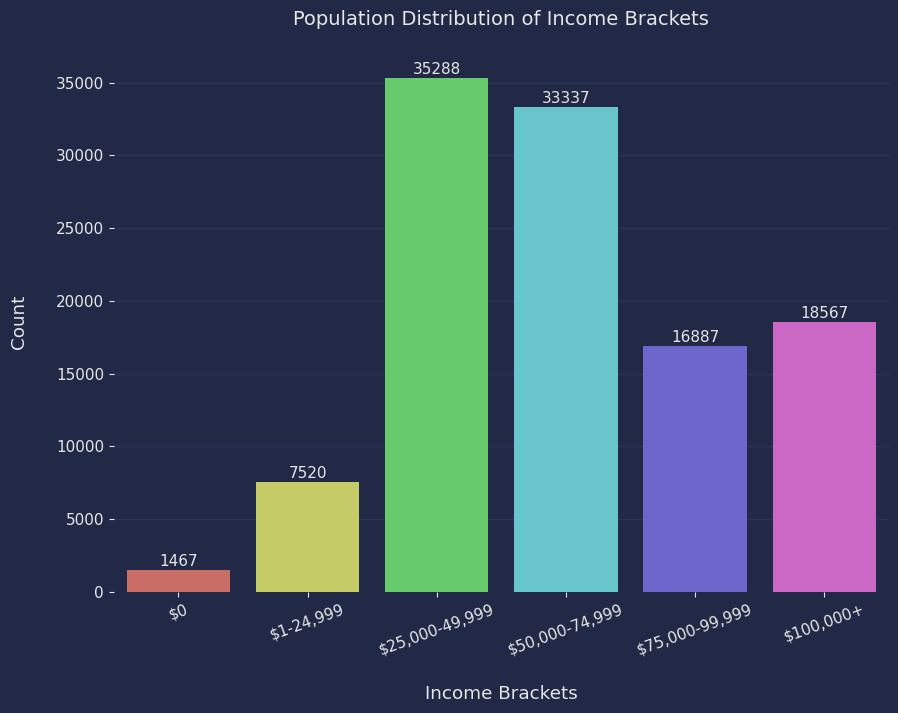

In [80]:
plt.figure(figsize=(10, 7))
sns.countplot(data=loan_charts, x='Income', palette="hls")
plt.title('Population Distribution of Income Brackets')
plt.xticks(rotation=20)
plt.xlabel('Income Brackets', labelpad=20)
plt.ylabel('Count', labelpad=20)

# Printing values on bars
clarity_counts = loan_charts['Income'].value_counts(sort=False)
for i in range(clarity_counts.shape[0]):
    total = clarity_counts[i]
    plt.text(i, total+1100, total, va='top', ha='center')

#### Income Brackets Insight
There is heavy competition for mode between the 2 middle tier brackets. While the mode does get awarded to 25,000-49,999; it's important to note how even it is. The difference is merely a couple thousand. This relationship carries over to the top 2 income brackets as well. Applicant are more likely to be making 75,000-100,000 than the bottom 2 tiers combined. Prosper loans clearly has a customer base that is influenced by middle-income & higher-income loan conditions. Prosper needs to cater to this demand.

Term
36    87224
60    24228
12     1614
Name: count, dtype: int64


Text(0.5, 1.0, 'Term Distribution in Months')

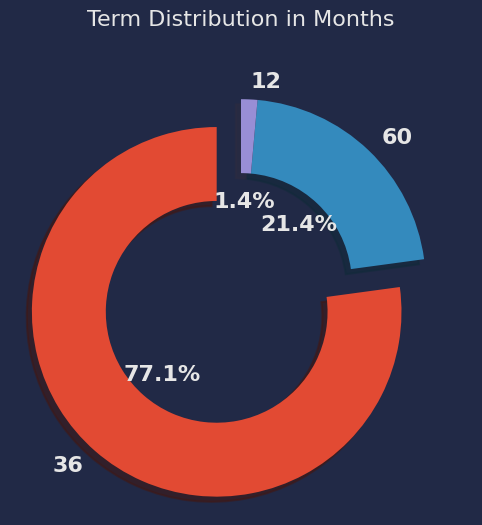

In [81]:
print(loan_charts.Term.value_counts())
labels = ['36', '60', '12']
sizes = [87224, 24228, 1614]
explode = (0.2, 0, 0)
bold_font = FontProperties(weight='bold', size=16)
plt.figure(figsize=(10,6))
plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, 
       wedgeprops={'width':.4, 'linewidth':1.5}, textprops={'fontproperties': bold_font},
       pctdistance=.45)
plt.title('Term Distribution in Months', size=16)

#### Terms Insight
Individuals accepting Loans through Prosper prefer 36 then 60 terms. Hardly any go for the 12 term loan. It's wise to focus on promoting the terms customers are interested in and support these promotions with deals, enticing conditions, etc. Also, increasing 12 month loan terms 18 or 24 should be explored as to increase their popularity.

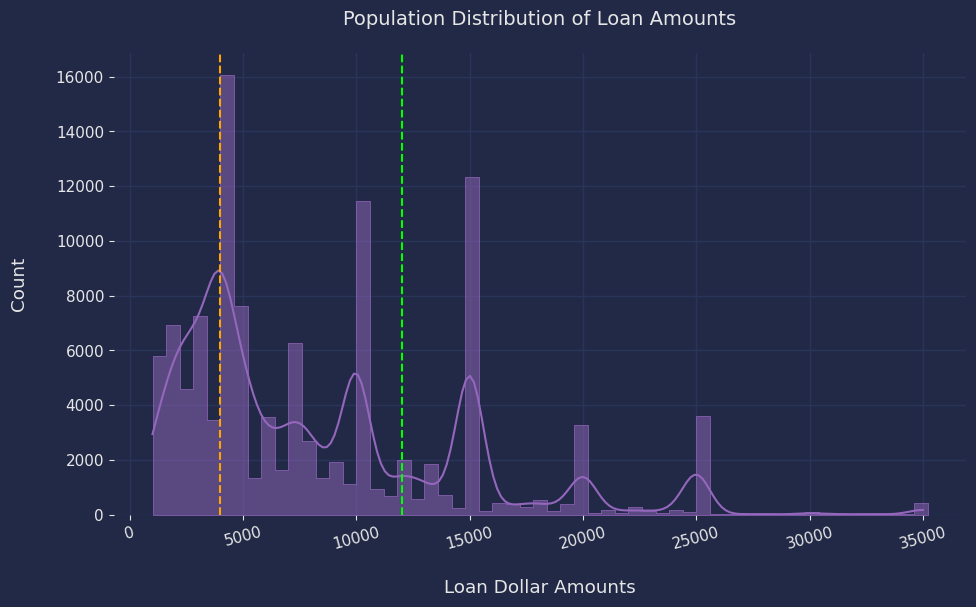

In [82]:
amount_bins = np.arange(1000, 35000+600, 600)
plt.figure(figsize=(11,6))
sns.histplot(data=loan_charts, x='Amount', color='tab:purple', bins=amount_bins, element='step', kde=True)
plt.title('Population Distribution of Loan Amounts')
plt.xticks(rotation=15)
plt.xlabel('Loan Dollar Amounts', labelpad=20)
plt.ylabel('Count', labelpad=20)

q1rt = np.quantile(loan_charts.Amount, .25)
plt.axvline(x=q1rt, label='Q1', c='orange', linestyle='dashed')
q1rt3 = np.quantile(loan_charts.Amount, .75)
plt.axvline(x=q1rt3, label='Q3', c='lime', linestyle='dashed')

#### Loan Amounts Insight
A bin selection with a step of .01 was chosen to split values on the hundredth decimal place instead of the thousandth. This encourages a more realistic breakdown of the chart as percents are hardly inspected to the thousandth. Past 25,000 loan amount counts steeply drop off. It must be difficult obtaining such a loan. Moreover, there are favorite amounts: 3500-4000, 7500, 10000, 15000, 20000, 25000 remain popular. Prosper should acknowledge this in their marketing campaign to bring in more customers. Focus on these amounts to push sales numbers.

C:\Users\tekre\AppData\Local\Temp\ipykernel_39580\2707685151.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=15)
C:\Users\tekre\AppData\Local\Temp\ipykernel_39580\2707685151.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax1.get_xticklabels(), rotation=15)


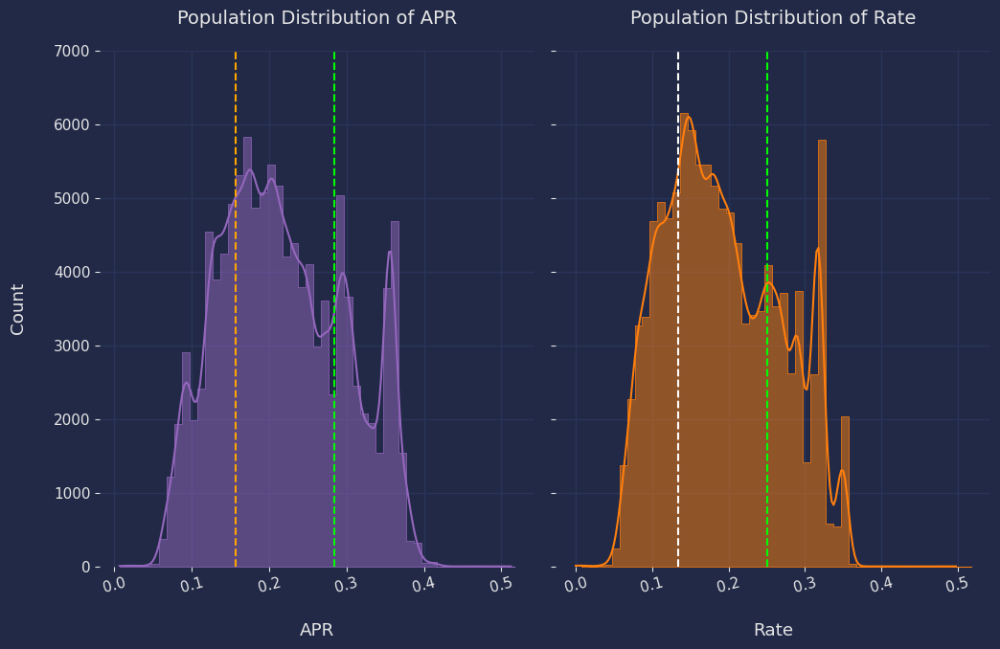

In [83]:
APR_bins = np.arange(.007, .512+.01, .01)
Rate_bins = np.arange(0, .497+.01, .01)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))

# Left chart
sns.histplot(data=loan_charts, x='APR', color='tab:purple', element='step', kde=True, bins=APR_bins, ax=ax1)
ax1.set_title('Population Distribution of APR')
ax1.set_xlabel('APR' , labelpad=20)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=15)
ax1.set_yticks(range(0, 7001, 1000))
ax1.set_ylabel('Count', labelpad=20)

q1rt = np.quantile(loan_charts.APR, .25)
ax1.axvline(x=q1rt, label='Q1', c='orange', linestyle='dashed')
q1rt3 = np.quantile(loan_charts.APR, .75)
ax1.axvline(x=q1rt3, label='Q3', c='lime', linestyle='dashed')

# Right chart
sns.histplot(data=loan_charts, x='Rate', color='tab:orange', element='step', kde=True, bins=APR_bins, ax=ax2)
ax2.set_title('Population Distribution of Rate')
ax2.set_xlabel('Rate', labelpad=20)
ax2.set(yticklabels=[])
ax2.set_ylabel('')
ax2.set_xticklabels(ax1.get_xticklabels(), rotation=15)
ax2.set_yticks(range(0, 7001, 1000))
q1rtR = np.quantile(loan_charts.Rate, .25)
ax2.axvline(x=q1rtR, label='Q1', c='white', linestyle='dashed')
q1rtR3 = np.quantile(loan_charts.Rate, .75)
ax2.axvline(x=q1rtR3, label='Q3', c='lime', linestyle='dashed')

plt.subplots_adjust(wspace=.05) 

#### APR Insight
Customer should expect to receive an APR .15 - .35. Most common APRs are .15-.2 & .3 & 3.6. For ideal insight, Prosper should plan financing assuming the average loan borrower will reveive an APR within this range. The further outside the range the more unlikely it becomes for that APR to be provided.
#### Rate Insight
Customer should expect to receive a rate .1 - .325. Most common rates are .125 & .325. For ideal insight, Prosper should plan financing assuming the average loan borrower will reveive a rate within this range. The further outside the range the more unlikely it becomes for that rate to be provided.

### Bivariate Analysis
* Do income brackets favor certain terms over others?
* What is the distribution of each feature per Income Bracket?
* Any noticable APR or Rate benefits when moving up the Income bracket ladder?

Text(0, 0.5, 'Count')

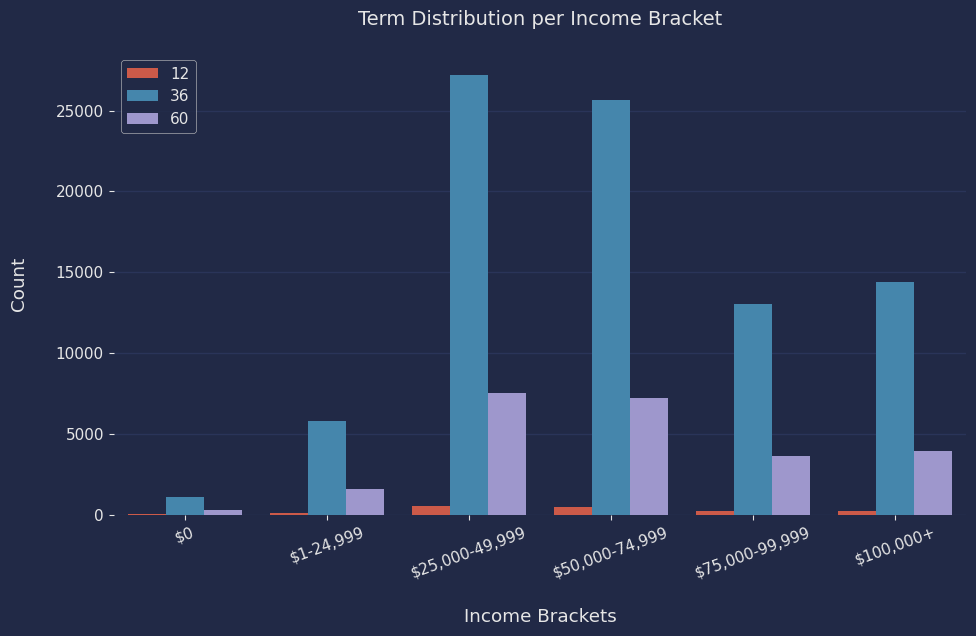

In [84]:
plt.figure(figsize=(11,6))
sns.countplot(data=loan_charts, x='Income', hue='Term')
plt.title('Term Distribution per Income Bracket')
plt.xticks(rotation=20)
plt.xlabel('Income Brackets', labelpad=20)
plt.legend(loc='upper left')
plt.ylabel('Count', labelpad=20)

#### Term x Income Bracket Insight
No matter the income, 36 terms is the gold standard, then 60, then 12. Increasing 12 month loan terms 18 or 24 should be explored as to increase their popularity. 12 months isn't even on the table for customers it seems. An adjust to something closer to 36 would be appreciated and can lead to more loans.

Text(0, 0.5, 'Loan Amount')

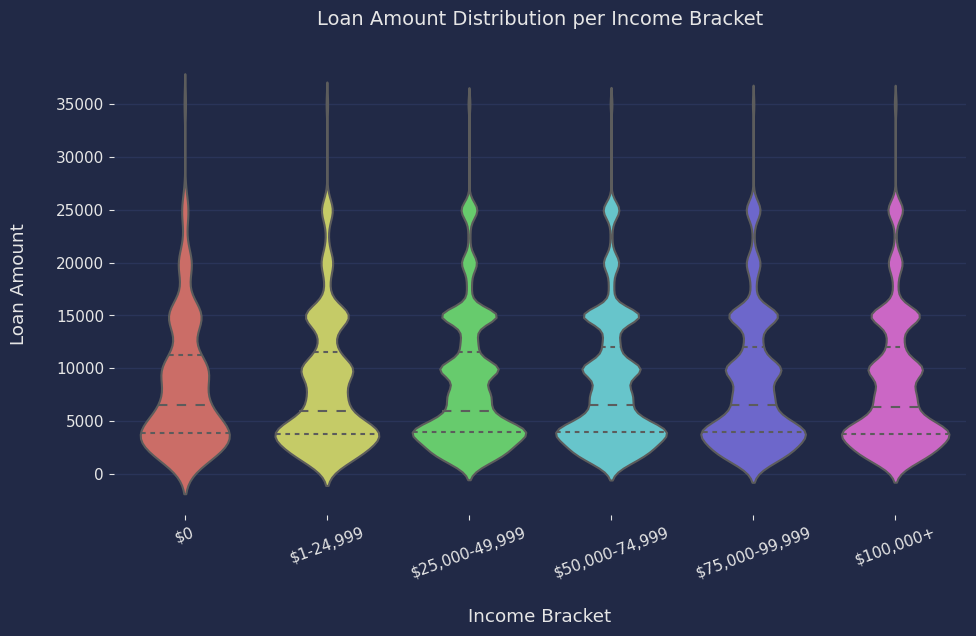

In [85]:
plt.figure(figsize=(11,6))
sns.violinplot(data=loan_charts, x='Income', y='Amount', inner='quartiles', palette="hls")
plt.xticks(rotation=20)
plt.title('Loan Amount Distribution per Income Bracket')
plt.xlabel('Income Bracket', labelpad=20)
plt.ylabel('Loan Amount', labelpad=20)

#### Loan x Income Bracket Insight
The lowest bracket has a wider distribution range compared to the others. Surprisingly, loan amounts vary very little between categories. Prosper can keep this in mind as targeted loan amounts will receive little payout. Customers of varying incomes can choose either low or high.

Text(0, 0.5, 'APR')

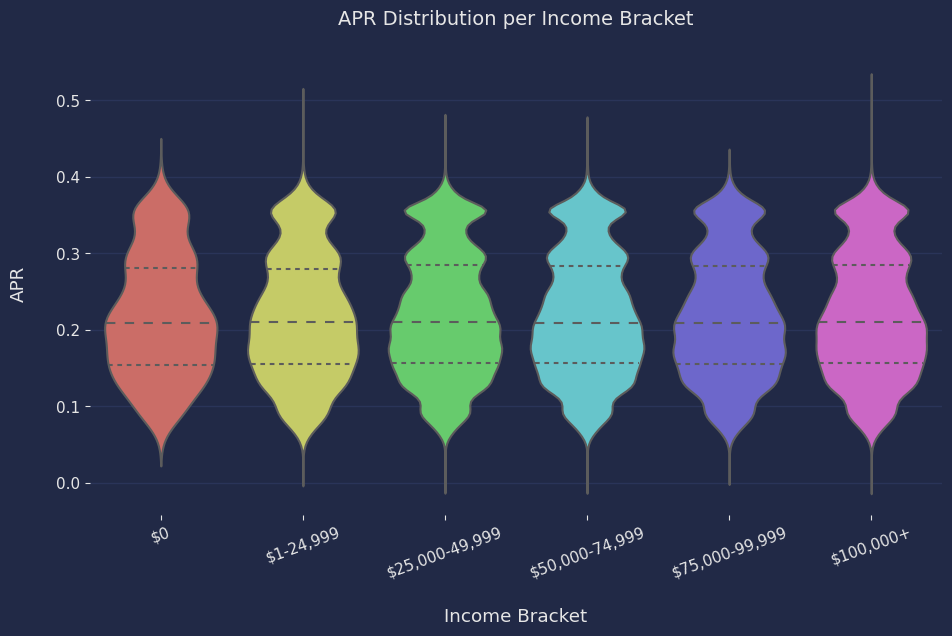

In [86]:
plt.figure(figsize=(11,6))
sns.violinplot(data=loan_charts, x='Income', y='APR', inner='quartiles', palette="hls")
plt.xticks(rotation=20)
plt.title('APR Distribution per Income Bracket')
plt.xlabel('Income Bracket', labelpad=20)
plt.ylabel('APR', labelpad=20)

#### APR x Income Bracket Insight
Individuals in the highest tier should slighty more expect a higher APR due to their improved financial status. Slightly expected only due to the even distribution across categories. Prosper has better APR flexibilty when customers make more as shown through the 100,000 category.

Text(0, 0.5, 'Rate')

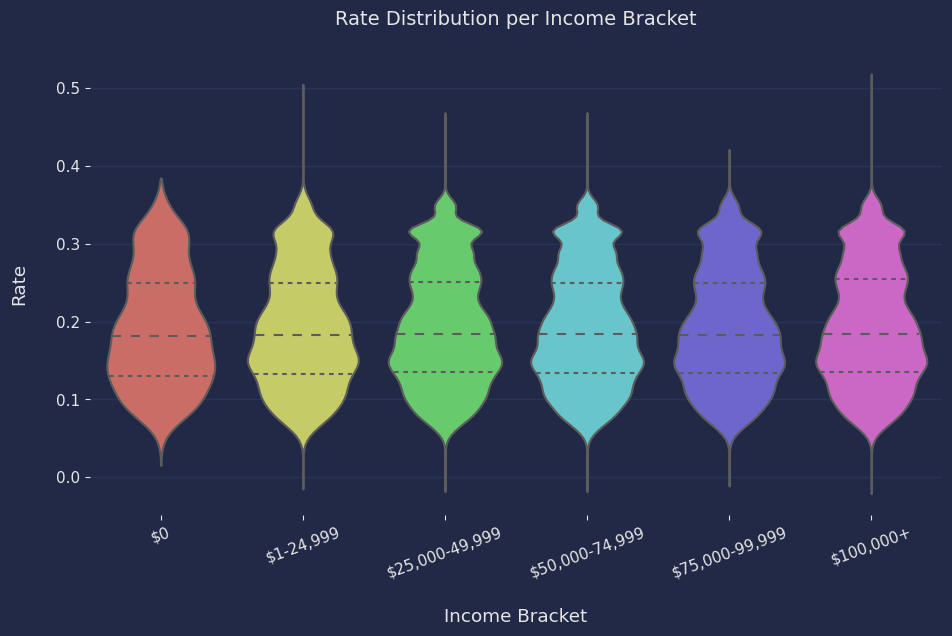

In [87]:
plt.figure(figsize=(11,6))
sns.violinplot(data=loan_charts, x='Income', y='Rate', inner='quartiles', palette="hls")
plt.xticks(rotation=20)
plt.title('Rate Distribution per Income Bracket')
plt.xlabel('Income Bracket', labelpad=20)
plt.ylabel('Rate', labelpad=20)

#### Rate x Income Bracket Distribution Insight
Individuals in the highest tier should slighty more expect a higher rate due to their improved financial status. Slightly expected only due to the even distribution across categories. Prosper has better rate flexibilty when customers make more as shown through the 100,000 category. Inversly, 0 provides a reliable return of rates from lack of outliers. Like APR, 1-24,999 mimics 100,000 closer than the inbetween categories. Customers in the middle should worry less about receiving an extreme rate.
### Multivariate Analysis
* Are better APRs, rates or higher loan amounts associated to higher income?
* Are APRs & rates determined using similar metrics?
* Do heatmaps or scatterplots show these relationships more effectively?

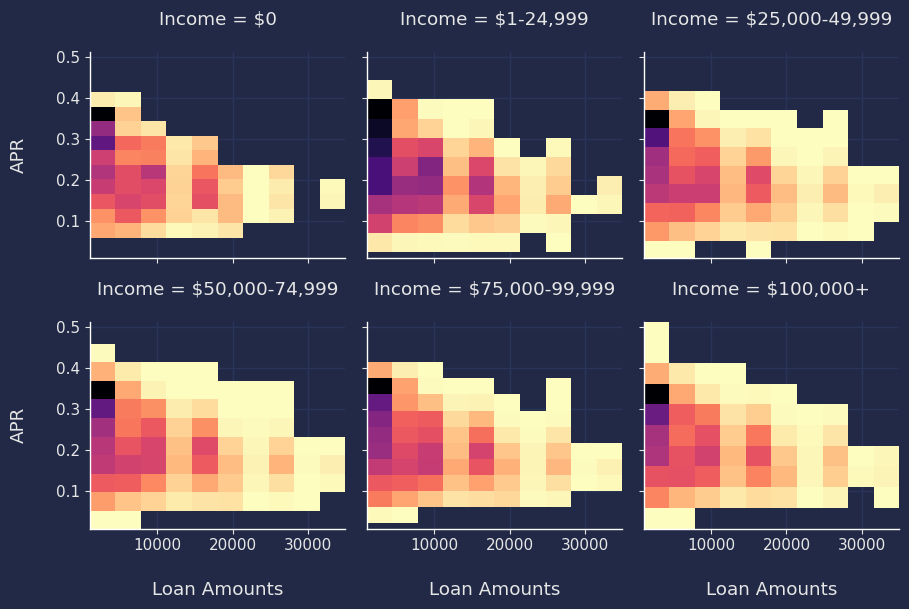

In [88]:
FG = sns.FacetGrid(data=loan_charts, col='Income', col_wrap=3, height=3)
FG.map(plt.hist2d, 'Amount', 'APR', cmap='magma_r', cmin=2, bins=10)
FG.set_xlabels('Loan Amounts', labelpad=20)
FG.set_ylabels('APR', labelpad=20)
for ax in FG.axes.flat:
    for c in ax.collections:
        c.set_edgecolor("none")

#### Apr x Loan Amounts per Income Insight
1-24,999 has APRs more concetrated than others. This indicates common APRs among customers. Ideally, one should be within the top 4 brackets if they desire to have utmost flexibility with APR. What stands out, in bracket 1-24,999 it is bi-modial distribution, almost multi-modial. Other categories are uni-modial. This relationship is only apparent in the lower amounts section of ~5,000 or less. Income 0 has little outliers. Besides these key differences, the heatmaps are quite similar.

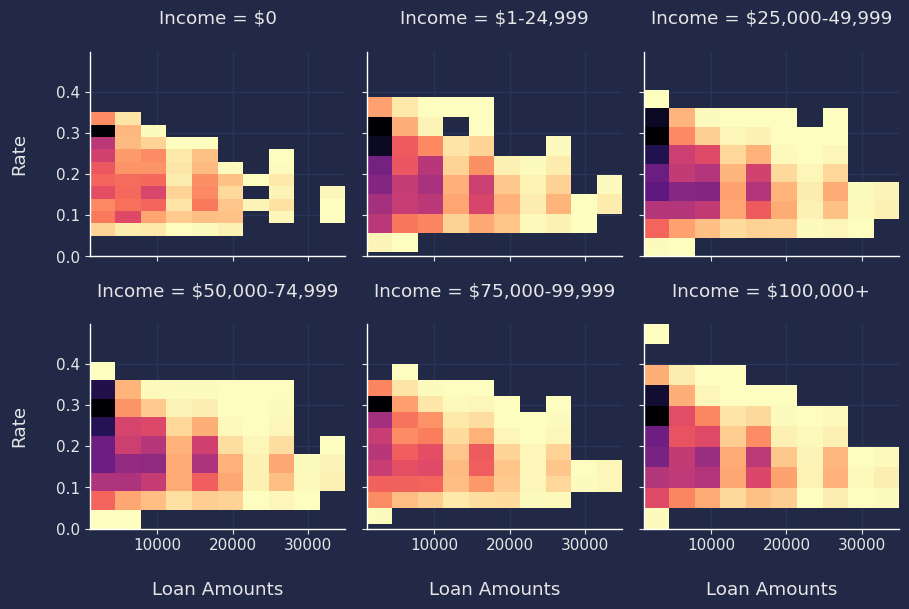

In [89]:
FG = sns.FacetGrid(data=loan_charts, col='Income', col_wrap=3, height=3)
FG.map(plt.hist2d, 'Amount', 'Rate', cmap='magma_r', cmin=2, bins=10)
FG.set_xlabels('Loan Amounts', labelpad=20)
FG.set_ylabels('Rate', labelpad=20)
for ax in FG.axes.flat:
    for c in ax.collections:
        c.set_edgecolor("none")

#### Rate x Loan Amounts per Income Insight
50,000-74,999 has rates that are more concentrated than others. This indicates common rates among customers. Ideally, one should be within the top 4 brackets if they desire to have utmost flexibility with rate negotiations. 25,000-49,999 & 50,000-74,999 has 3 common rates for lower loan amounts. The others either have 2 or 1. This type of relationship is reflected in loan amounts of 10,000 and 15,000 but with 2 within the mentioned brackets.  Still, brackets besides 0 & 75,000-99,999 are bi-modial. Customers can expect a rate corresponding to the darker cells.

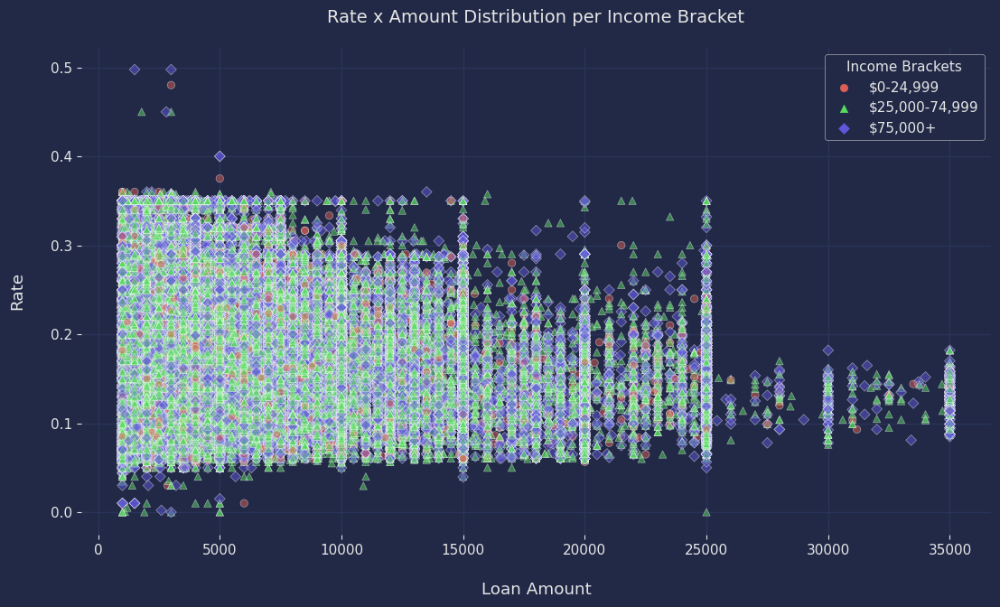

In [90]:
# Ordinal & income grouping lists
inc_order = ['$0-24,999', '$25,000-74,999', '$75,000+']
category_mapping_income = {
    '$0-24,999': ['$0', '$1-24,999'],
    '$25,000-74,999': ['$25,000-49,999', '$50,000-74,999'],
    '$75,000+': ['$75,000-99,999', '$100,000+']
}
marker_styles = {
    '$0-24,999': 'o',
    '$25,000-74,999': '^',
    '$75,000+': 'D'
}

# Income grouping into 3 brackets instead of 6
loan_charts2 = loan_charts.copy()
loan_charts2['Income'] = loan_charts2['Income'].map({income: category for category, incomes in category_mapping_income.items() for income in incomes})
ordinals_IR = pd.CategoricalDtype(categories=inc_order, ordered=True)
loan_charts2['Income'] = loan_charts2['Income'].astype(ordinals_IR)

plt.figure(figsize=(13, 7))
sns.scatterplot(data=loan_charts2, x='Amount', y='Rate', hue='Income', style='Income', alpha=0.5, markers=marker_styles,
               palette="hls")
plt.title('Rate x Amount Distribution per Income Bracket')
plt.xlabel('Loan Amount', labelpad=20)
plt.ylabel('Rate', labelpad=20)
plt.legend(title='Income Brackets')

#### Rate x Loan Amount per Income Bracket Insight
Chart readibility was at an all time low with 5 income brackets. Looked like a glob of rainbow goo. To rectify, income brackets were grouped into pairs of 3 instead of individual 6. This chart provides evidence for minimum & maximum loan amounts being accessible to any income bracket. On the contrary, distribution is mixed. 25,000-75000+ tiers are readily given loans of 25000+, where the lowest tier generally has access lower than 25,000. It also appears rate is not affixed to income bracket, given the wide and uniform distribution of each income bracket. Prosper needs to limit access of higher loans to 0-24,999 more. There shouldn't be any customer of that stature acquitted with a loan they can't pay back.

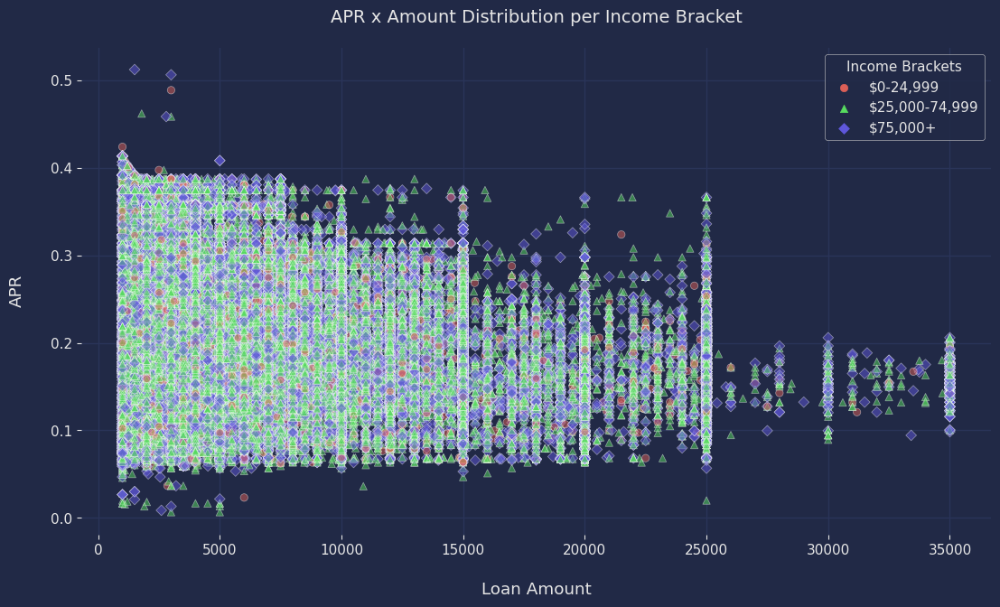

In [91]:
plt.figure(figsize=(13, 7))
sns.scatterplot(data=loan_charts2, x='Amount', y='APR', hue='Income', style='Income', alpha=0.5, markers=marker_styles,
               palette="hls")
plt.title('APR x Amount Distribution per Income Bracket')
plt.xlabel('Loan Amount', labelpad=20)
plt.ylabel('APR', labelpad=20)
plt.legend(title='Income Brackets')
plt.show()

#### APR x Loan Amount per Income Bracket Insight
The differences between this chart and the previous are extremely minimal. Prosper has a mirrored system when assigning APRs & Rates. Distribution, min, and max are practically identical. Customer should be prepard to woo Prosper into providing a lower APR or rate based on other factors, such as credit instead of their income status



## *Research Question #2*
#### *Do certain occupations receive better loan conditions over others? Are term lengths evenly distributed?*

In [92]:
occ_charts = loan_df[['Term', 'LoanOriginalAmount', 'BorrowerAPR', 'BorrowerRate']].copy()
occ_charts = occ_charts.rename(columns={'LoanOriginalAmount':'Loan Amount', 'BorrowerAPR':'APR', 'BorrowerRate':'Rate'})
occ_charts['Occupation'] = customer_ML['Occupation'].copy()
occ_charts

,Term,Loan Amount,APR,Rate,Occupation
0,36,9425,0.165,0.158,Other
1,36,10000,0.120,0.092,Professional
2,36,3001,0.283,0.275,Skilled Labor
3,36,10000,0.125,0.097,Executive
4,36,15000,0.246,0.208,Professional
...,...,...,...,...,...
113061,36,10000,0.224,0.186,Administrative Assistant
113062,36,2000,0.132,0.111,Other
113063,60,10000,0.240,0.215,Other
113064,60,15000,0.284,0.261,Other


In [93]:
occ_charts.Occupation.value_counts()

Occupation
Other                          31951
Professional                   13531
Computer Programmer             4442
Executive                       4280
Teacher                         3729
                               ...  
Dentist                           67
Student - College Freshman        41
Student - Community College       28
Judge                             22
Student - Technical School        16
Name: count, Length: 67, dtype: int64

#### Feature Engineering
Occupations will be grouped into relative categories to provide better insight on graphs and reduce clutter, given the wide array of occupations listed.

In [94]:
category_mapping = {
    'Management & Leadership': ['Executive', 'Retail Management', 'Food Service Management', 'Police Officer/Correction Officer', 
                                  'Military Officer', 'Principal', 'Judge'],
    'Skilled Trades': ['Skilled Labor', 'Construction', 'Tradesman - Mechanic', 'Tradesman - Electrician', 'Tradesman - Carpenter', 'Tradesman - Plumber'],
    'Sales & Marketing': ['Sales - Retail', 'Sales - Commission', 'Realtor', 'Car Dealer'],
    'Hospitality & Service': ['Food Service', 'Waiter/Waitress', 'Flight Attendant', 'Bus Driver', 'Religious'],
    'Healthcare & Nursing': ['Nurse (RN)', 'Nurse (LPN)', 'Nurse\'s Aide', 'Pharmacist', 'Doctor', 'Dentist'],
    'Education': ['Teacher', 'Professor', 'Teacher\'s Aide', 'Student - College Senior', 'Student - College Graduate Student', 'Student - College Sophomore', 
                  'Student - College Junior', 'Student - College Freshman', 'Student - Community College', 'Student - Technical School'],
    'Legal & Financial': ['Accountant/CPA', 'Attorney'],
    'Engineering & Tech': ['Computer Programmer', 'Engineer - Mechanical', 'Engineer - Electrical', 'Engineer - Chemical'],
    'Science': ['Scientist', 'Biologist', 'Chemist'],
    'Public Service': ['Fireman', 'Civil Service', 'Postal Service', 'Social Worker', 'Military'],
    'Office Workers': ['Clerical', 'Clergy', 'Analyst', 'Investor', 'Psychologist'],
    'Creative & Arts': ['Architect', 'Landscaping', 'Homemaker'],
    'Transportation & Logistics': ['Truck Driver', 'Pilot - Private/Commercial'],
    'Other': ['Other'],
    'Professional': ['Professional']
}
occ_charts['Occupation'] = occ_charts['Occupation'].map({occupation: category for category, occupations in category_mapping.items() for occupation in occupations})
print(occ_charts.shape)
occ_charts.Occupation.value_counts()

(113066, 5)


Occupation
Other                         31951
Professional                  13531
Management & Leadership       10317
Office Workers                 7264
Engineering & Tech             7179
Sales & Marketing              6906
Skilled Trades                 6132
Education                      5257
Healthcare & Nursing           4267
Legal & Financial              4242
Public Service                 3221
Hospitality & Service          2109
Transportation & Logistics     1864
Science                         636
Creative & Arts                 565
Name: count, dtype: int64

#### Feature breakdown
Term is ordinal quantitative. Ocucpation is nominal quantitative. Due to its status as independent variable for the research question, charts will be categorized based on Occupation. Rate, APR, and Amount are continuous variables while Term is individually discrete, all dependent. 
### Univariate Analysis
* Population distributions for the qualitative features: Occupaton & Term
* Is there an outstanding difference between the mode category and the min category?
* Unimodal, bimodal or multimodal?

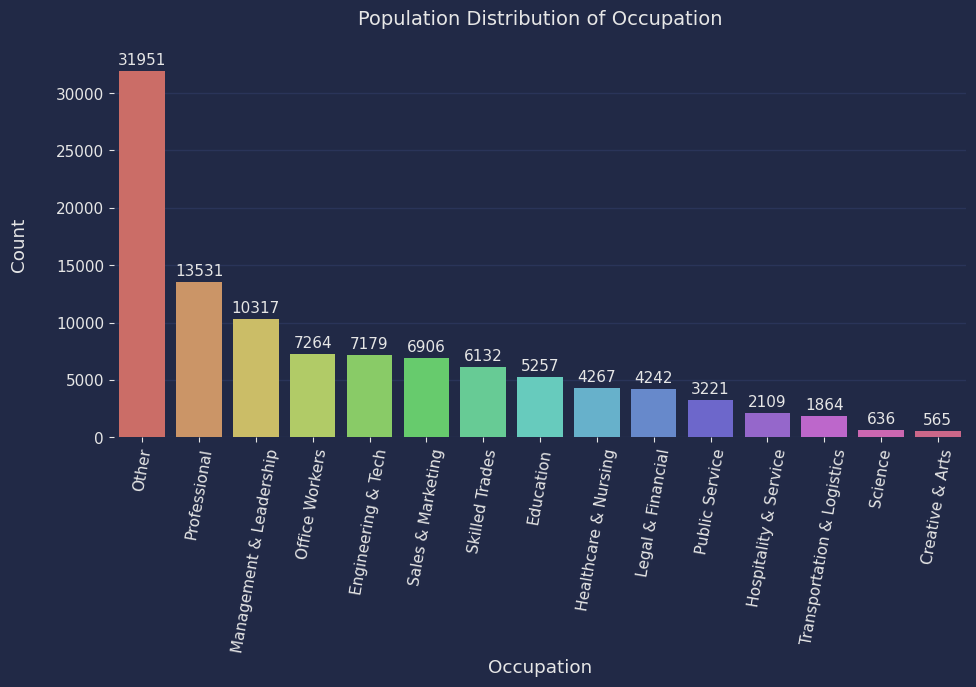

In [95]:
# Pre-chart setup
term_order2 = ['12', '36', '60']
terms2 = pd.CategoricalDtype(categories=term_order, ordered=True)
occ_charts['Term'] = loan_charts['Term'].astype(terms)

popXocc = occ_charts.Occupation.value_counts().index
plt.figure(figsize=(11,5))
sns.countplot(data=occ_charts, x='Occupation', palette="hls", order=popXocc)
plt.xticks(rotation=80)
plt.title('Population Distribution of Occupation')
plt.ylabel('Count', labelpad=20)

# Printing values on bars
clarity_counts = occ_charts['Occupation'].value_counts()
for i in range(clarity_counts.shape[0]):
    total = clarity_counts[i]
    plt.text(i, total+1600, total, va='top', ha='center')

#### Occupation Insight
Other is by far the mode, but this is presumably due to it's vast reach across the job sphere. Sadly the information behind what makes up Other is vacant. Diving deeper into that category would be insightful but I digress. Creative & Arts and Science are barely noticable in the back. Prosper could consider making marketing attempts to these groups for easy growth unless there's an absence of workers available. An alternative and proven effective approach is targeting Professional to Legal & Financial categories. Word spreads easily since employees are in close proximity, in other words free advertising.

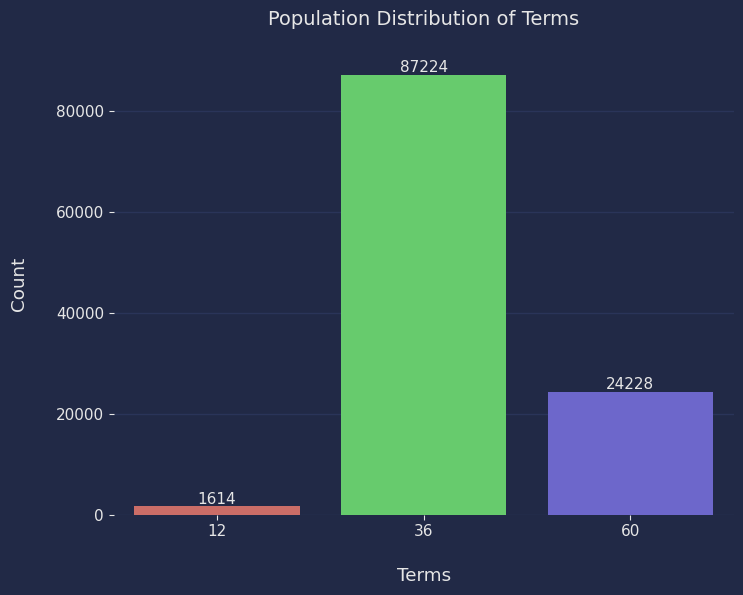

In [96]:
plt.figure(figsize=(8, 6))
sns.countplot(data=occ_charts, x='Term', palette="hls")
plt.title('Population Distribution of Terms')
plt.xlabel('Terms', labelpad=20)
plt.ylabel('Count', labelpad=20)

# Printing values on bars
clarity_counts = occ_charts['Term'].value_counts(sort=False)
for i in range(clarity_counts.shape[0]):
    total = clarity_counts.iloc[i]
    plt.text(i, total+3000, total, va='top', ha='center')

#### Terms Insight
Individuals accepting Loans through Prosper prefer 36 then 60 terms. Hardly any go for the 12 term loan. It's wise to focus on promoting the terms customers are interested in and support these promotions with deals, enticing conditions, etc. Additionally, increasing 12 month loan terms 18 or 24 should be explored as to increase their popularity.

### Bivariate Analysis
* Do certain professions land people in positions to take out higher amount loans?
* Are any categories able to pull in more people obtaining a specific loan amount compared to Other?
* Which occupations have the highest value outliers for loan amounts?

Text(0.5, 1.0, 'Loan Amount Distribution per Occupation')

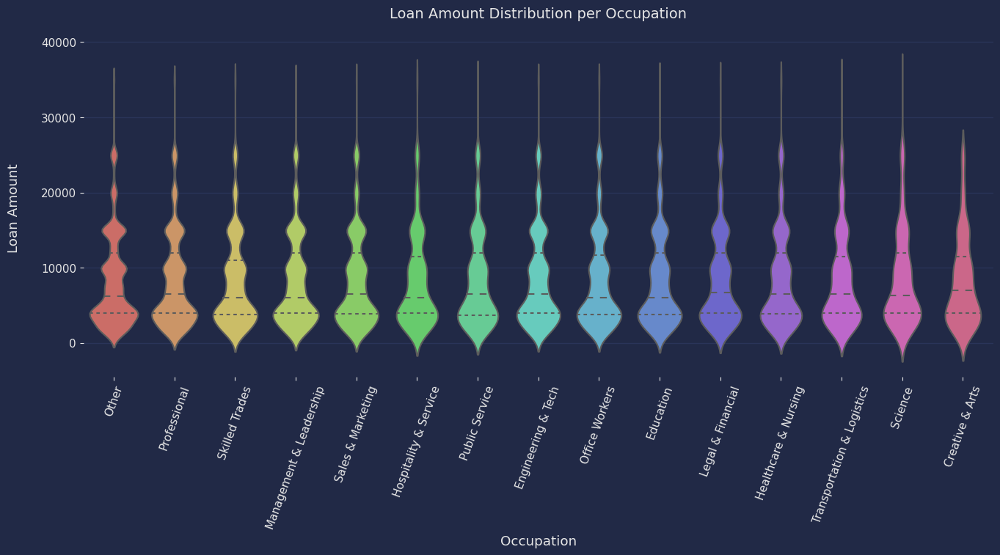

In [97]:
plt.figure(figsize=(16,6))
sns.violinplot(data=occ_charts, x='Occupation', y='Loan Amount', inner='quartiles', palette="hls")
plt.xticks(rotation=70)
plt.ylabel('Loan Amount', labelpad=20)
plt.title('Loan Amount Distribution per Occupation')

#### Loan Amount x Occupation Insight
Due to their limited population or restricted financing, Creative & Arts has the strictest range for loan amounts available. Science and Hospitality & Service have the highest loan amounts recorded. Prosper can pursue this and secure higher loans within these occupations. Quartile ranges are similar showing how loan amounts or minimally correlated occupations. Other variables will likely be heavier influences, such as credit status. However, with the bottom quartile having such volume in all categories, Prosper needs to explore ways into enticing these lower loan amount borrowers into higher loans. If such an advertising strategy succeeds, profits will rise.
### Multivariate Analysis
* Does APR/rate and loan fluctuate between Occupations?
* Does Term lengths get a bonus of lower APR/rates?
* Are any terms able to secure higher loans?

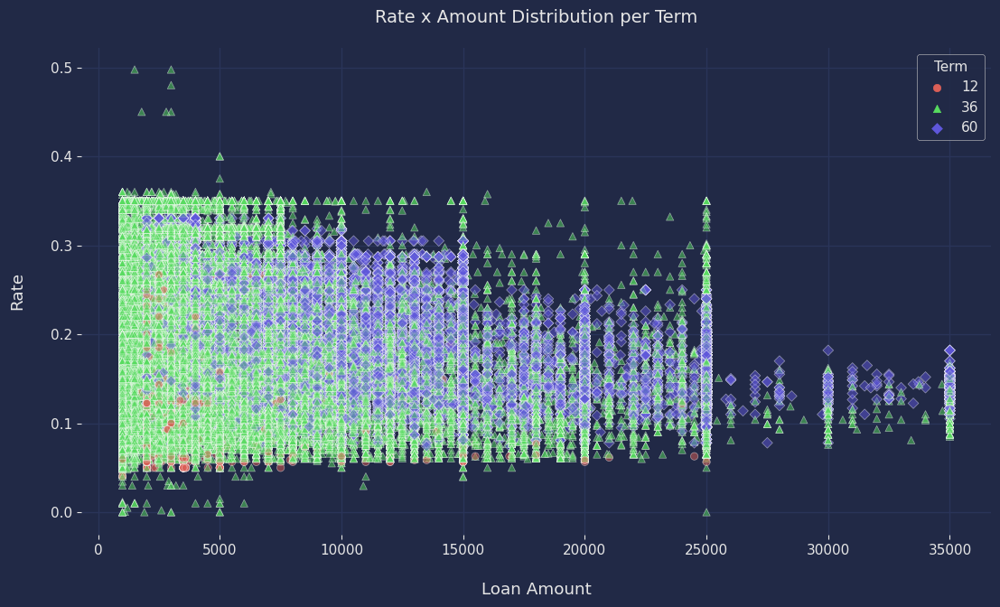

In [98]:
plt.figure(figsize=(13, 7))
marker_styles = {
    '12': 'o',
    '36': '^',
    '60': 'D'
}
sns.scatterplot(data=loan_charts, x='Amount', y='Rate', hue='Term', style='Term', alpha=0.5, markers=marker_styles,
               palette="hls")
plt.title('Rate x Amount Distribution per Term')
plt.xlabel('Loan Amount', labelpad=20)
plt.ylabel('Rate', labelpad=20)
plt.legend(title='Term')
plt.show()

#### Rate x Loan Amount per Term InsightCustomers who select 36 or 60 terms are provided maximum flexibility. They can choose to as high as the max (35000) or the minimum (1000). If someone values having amount options on the table, then one of these categories needs to be picked. Additionally, rate shows none or minimal correlation to Term; given the similar vertical height of each Term. The key difference is Term 36 reaching up to .5 rate values. Higher loan amounts hover between 0.1 - 0.2 rate exclusively.


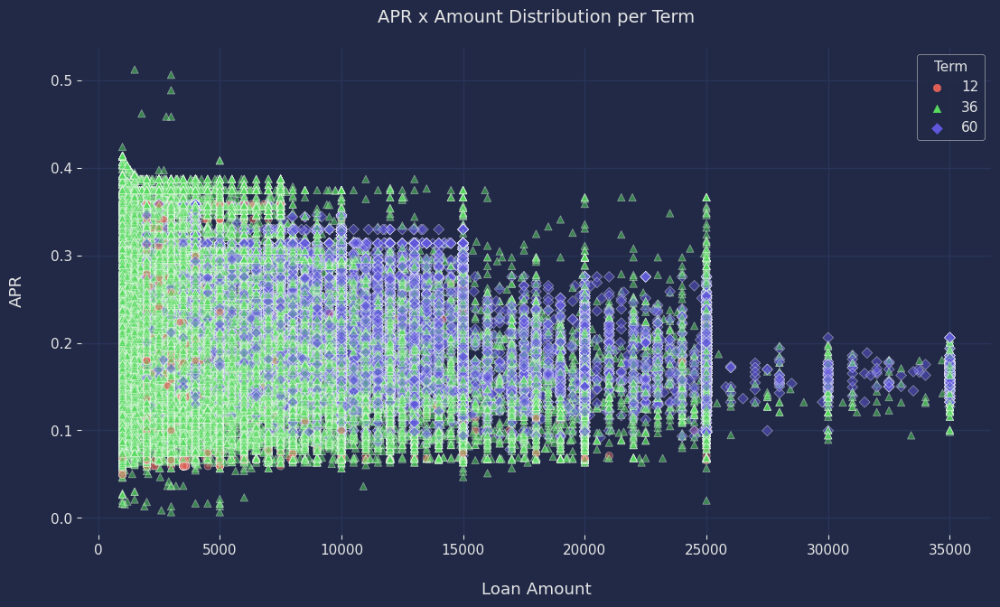

In [99]:
plt.figure(figsize=(13, 7))
sns.scatterplot(data=loan_charts, x='Amount', y='APR', hue='Term', style='Term', alpha=0.5, markers=marker_styles,
               palette="hls")
plt.title('APR x Amount Distribution per Term')
plt.xlabel('Loan Amount', labelpad=20)
plt.ylabel('APR', labelpad=20)
plt.legend(title='Term')
plt.show()

#### APR x Loan Amount per Term Insight
Customers who select 36 or 60 terms are provided maximum flexibility. They can choose to as high as the max (35000) or the minimum (1000). If someone values having amount options on the table, then one of these categories needs to be picked. Additionally, rate shows none or minimal correlation to Term; given the similar vertical height of each Term. The key difference is Term 36 reaching up to .5 rate values. Higher loan amounts hover between 0.1 - 0.2 APR exclusively.

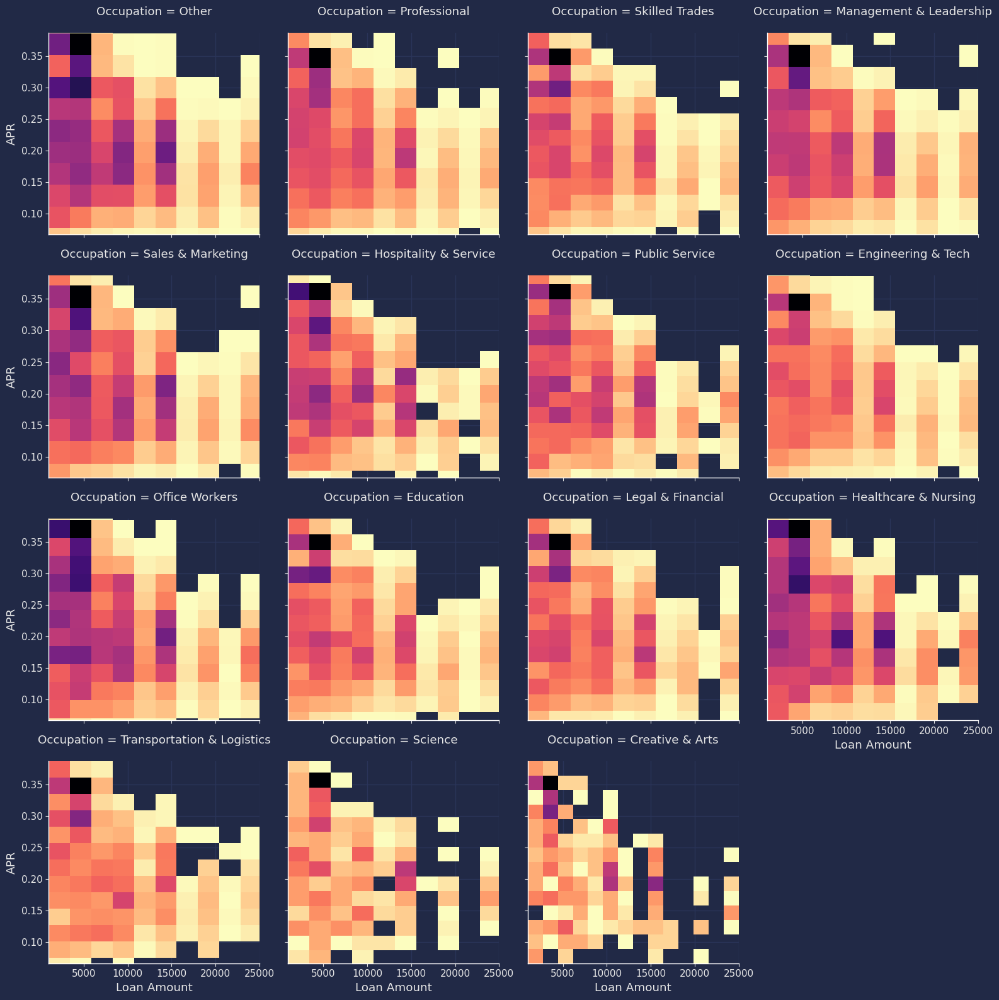

In [100]:
FG = sns.FacetGrid(data=occ_charts, col='Occupation', col_wrap=4, height=4)
FG.map(plt.hist2d, 'Loan Amount', 'APR', cmap='magma_r', cmin=2, bins=14)
for ax in FG.axes.flat:
    for c in ax.collections:
        c.set_edgecolor("none")

#### Loan Amount x APR per Occupation Insight
Healthcare & Nursing, Office Workers, Other, Sales & Marketing, Management & Leadership have similar distributions for .15 - .35 APR. These color density findings are probably related to their population counts. The similarities span across all occupations in regards to the most common APR and loan of .35 | 5,000. Generally APRs of around .3 are provided for lower amounts. Higher amounts such as 10,000+ receive a beneficial APR drop to around .2; with 25,000+ hovering around .15. Prosper is doing a swell job staying competitive with rates for the bigger loans as shown by the white cells in the top right corner of each subplot.

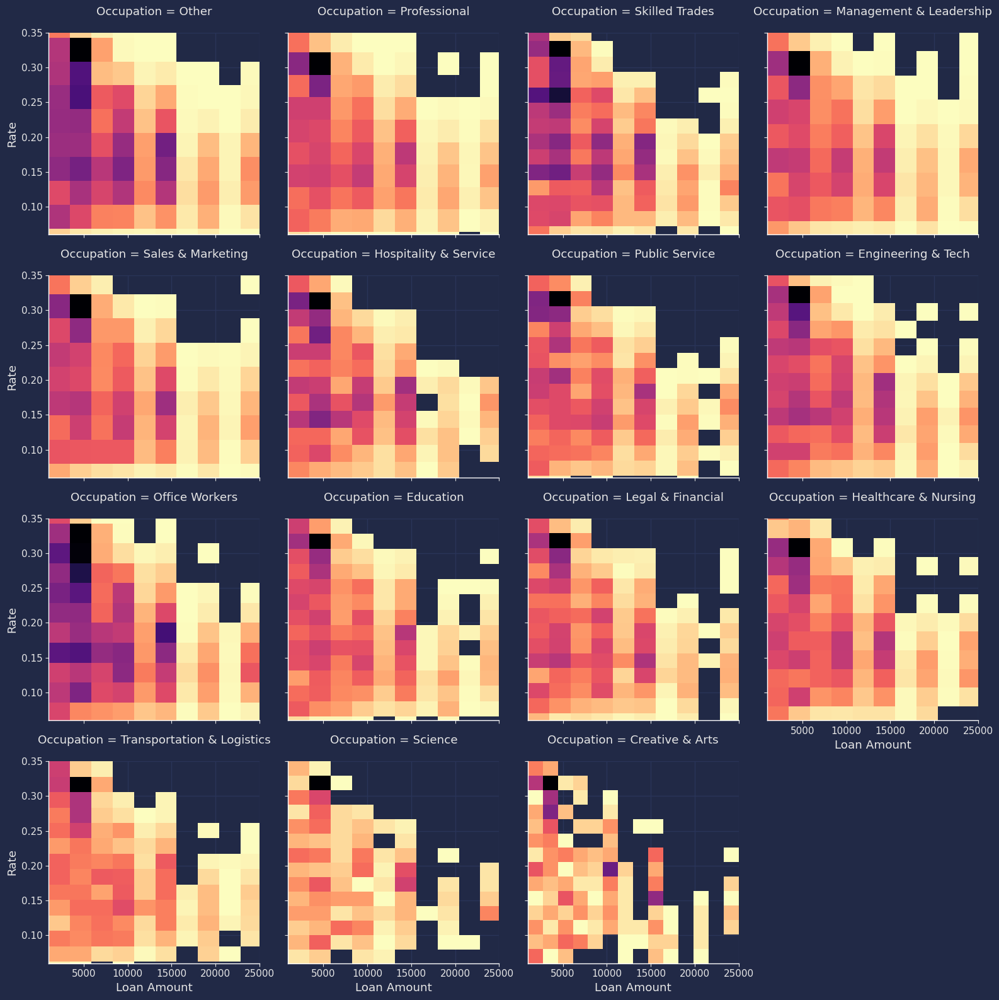

In [101]:
FG = sns.FacetGrid(data=occ_charts, col='Occupation', col_wrap=4, height=4)
FG.map(plt.hist2d, 'Loan Amount', 'Rate', cmap='magma_r', cmin=2, bins=14)
for ax in FG.axes.flat:
    for c in ax.collections:
        c.set_edgecolor("none")

#### Loan Amount x Rate per Occupation Insight
Healthcare & Nursing, Office Workers, Other, Sales & Marketing, Management & Leadership have similar distributions for .15 - .35 APR. Office Workers have common Rates among it's customers considering it bimodial, almost multimodial status. Includes 8 darker colored cells. Skilled Trades also has a bimodial setup with 6 darker cells. Rates for these 2 categories be more shared compared to other categories. The similarities span across all occupations in regards to the most common rate and loan of .35 | 5,000. Generally rates of around .3 are provided for lower amounts. Higher amounts such as 10,000+ receive a beneficial rate drop to around .2; with 25,000+ hovering around .15. Prosper is doing a swell job staying competitive with rates for the bigger loans as shown by the white cells in the top right corner of each subplot.

## *Research Question #3*
#### *Are there variables that constitute a higher Prosper Score?*

In [102]:
score_charts = customer_ML[['ProsperScore', 'IncomeVerifiable', 'TotalTrades']].copy()
score_charts[['OpenCreditLines',
              'CurrentDelinquents', 'AmountDelinquent', 'CreditScore']] = credit_df[['OpenCreditLines', 'CurrentDelinquencies',
                                                                                    'AmountDelinquent', 'CreditScore']].copy()

# Rounding feature values to whole numbers due to decimal insignificance and for discreet formatting
def column_rounder(col):
    score_charts[col] = score_charts[col].round(0)
    return score_charts

for col in score_charts.columns:
    score_charts = column_rounder(col)

# 1.0 is Yes, 0 is No
print(score_charts.IncomeVerifiable.value_counts())
score_charts.head(5)

# Ordering ProsperScore
scores_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
PS_order = pd.CategoricalDtype(ordered=True, categories=scores_list)
score_charts['ProsperScore'] = score_charts['ProsperScore'].astype(PS_order)

IncomeVerifiable
1.0    104479
0.0      8587
Name: count, dtype: int64


In [103]:
score_charts.loc[score_charts['IncomeVerifiable'] == 1, 'IncomeVerifiable'] = "Yes"
score_charts.loc[score_charts['IncomeVerifiable'] == 0, 'IncomeVerifiable' ] = "No"
print(score_charts.IncomeVerifiable.value_counts())

IncomeVerifiable
Yes    104479
No       8587
Name: count, dtype: int64


### Univariate Analysis
* Which ProsperScores are easist & hardest to obtain? Which type of mode?
* Is IncomeVerifiable a "Yes" value for majority of customers?
* How many open credit lines are average? What are the max range outliers?

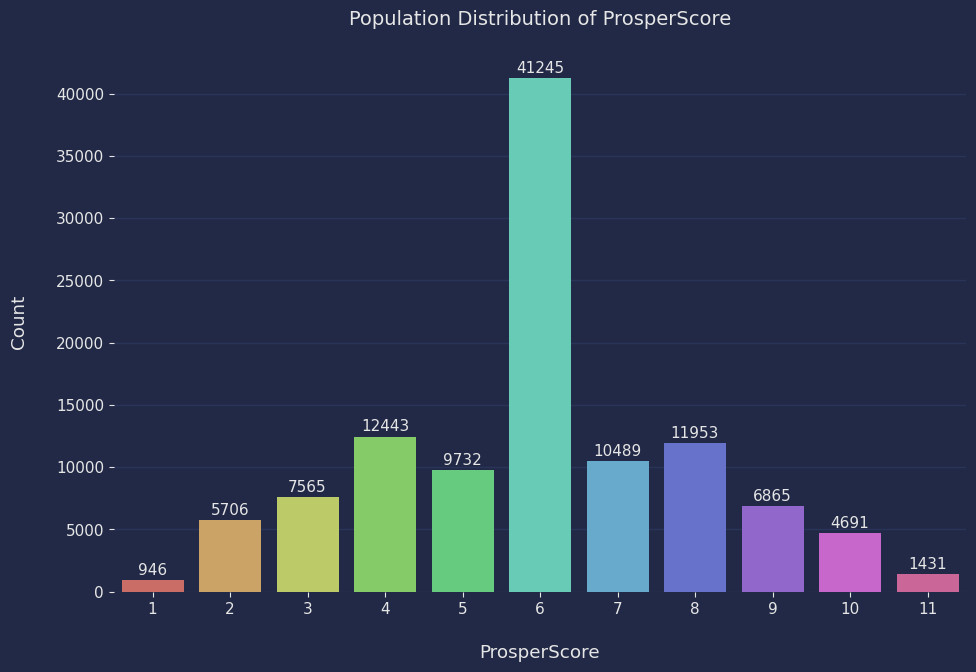

In [104]:
plt.figure(figsize=(11,7))
sns.countplot(data=score_charts, x='ProsperScore', palette="hls")
plt.title('Population Distribution of ProsperScore')
plt.ylabel('Count', labelpad=20)
plt.xlabel('ProsperScore', labelpad=20)

# Printing values on bars
clarity_counts = score_charts['ProsperScore'].value_counts(sort=False)
for i in range(clarity_counts.shape[0]):
    total = clarity_counts.iloc[i]
    plt.text(i, total+1400, total, va='top', ha='center')

#### ProsperScore Insight
The middle tiers of 4, 6, and 8 contain most records. Leading by 6 due to the mean impute that was enacted on null values. It's equally difficult to achieve a high ProsperScore and a low. Customers should aim for a 6 or above to be considered average or above average.

Text(0.5, 1.0, 'Income Verifiable Distribution')

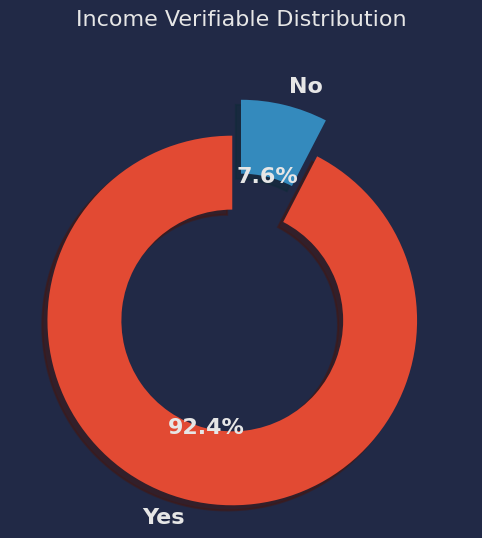

In [105]:
labels = ['Yes', 'No']
sizes = [104479, 8587]
explode = (0.2, 0)
bold_font = FontProperties(weight='bold', size=16)
plt.figure(figsize=(10,6))
plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, 
       wedgeprops={'width':.4, 'linewidth':1.5}, textprops={'fontproperties': bold_font})
plt.title('Income Verifiable Distribution', size=16)

#### Income Verifiable Insight
Loans are easier to obtain when financial status is verified. This enables Prosper to deal offers or loan conditions in confidence. Efforts by both parties should be done to reduce the "No" 7.6% figure.

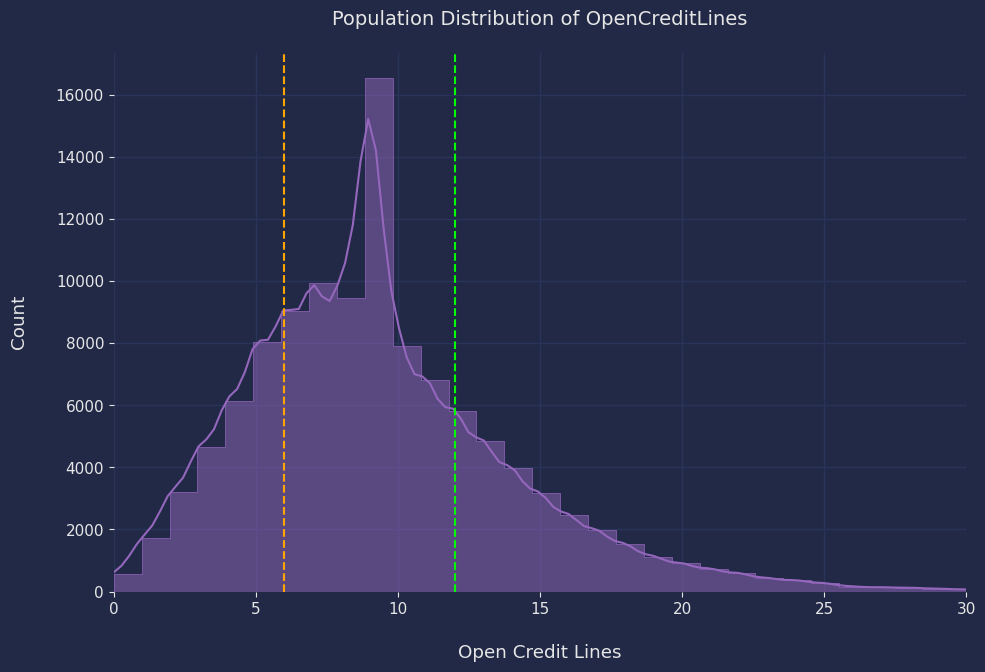

In [106]:
plt.figure(figsize=(11,7))
sns.histplot(data=score_charts, x='OpenCreditLines', color='tab:purple', element='step', kde=True, bins=55)
plt.title('Population Distribution of OpenCreditLines')
plt.xlabel('Open Credit Lines', labelpad=20)
plt.ylabel('Count', labelpad=20)
plt.xlim(0, 30)

q1rt = np.quantile(score_charts.OpenCreditLines, .25)
plt.axvline(x=q1rt, label='Q1', c='orange', linestyle='dashed')
q1rt3 = np.quantile(score_charts.OpenCreditLines, .75)
plt.axvline(x=q1rt3, label='Q3', c='lime', linestyle='dashed')

#### Open Credit Lines Insight
Mode is 10. There is a steeper rise compared to the fall indicating larger increases for each value in 1-10 compared to 10+. Abundant credit lines are rarer to see, such as 20.

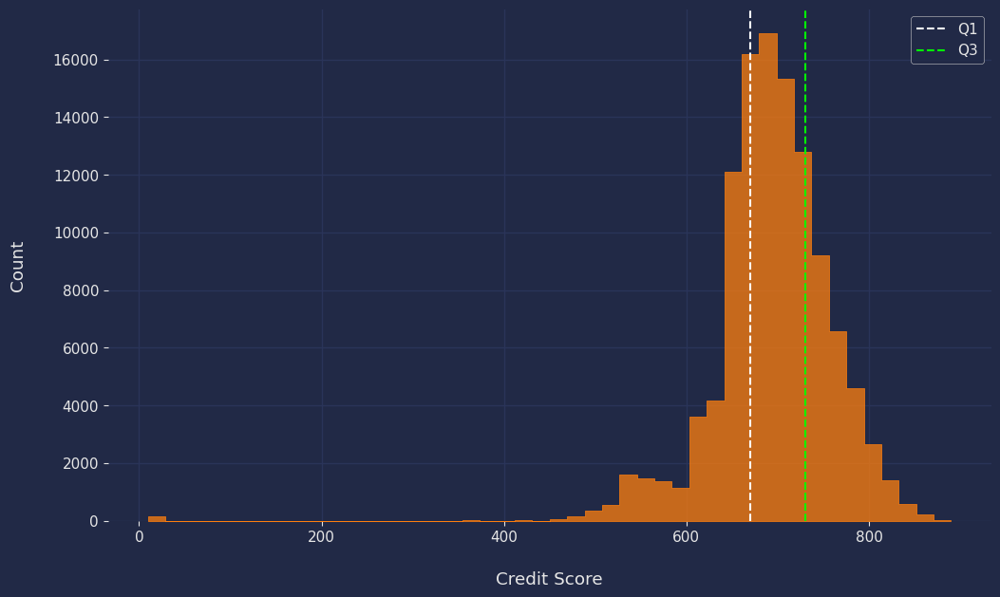

In [107]:
plt.figure(figsize=(12, 7))
sns.histplot(data=score_charts, x='CreditScore', bins=46, color='tab:orange', element='step')
plt.xlabel('Credit Score', labelpad=20)
plt.ylabel('Count', labelpad=20)
q1rt = np.quantile(score_charts['CreditScore'], .25)
plt.axvline(x=q1rt, label='Q1', c='white', linestyle='dashed')
q1rt3 = np.quantile(score_charts['CreditScore'], .75)
plt.axvline(x=q1rt3, label='Q3', c='lime', linestyle='dashed')

plt.legend()
plt.show()

#### Credit Scores Insight
Left chart is lower score and right chart is upper score. Distribution is practically identical between these features. Mode appears to be ~700. Customer above ~700 should be provided with better conditions in order for Prosper to stay competitive with it's competition. Loans borrowers with higher credit scores are next-to guaranteed for fulfilling payments, so competition is fierce. Customers with a score of 400-599 should improve it to 600+ to receive average conditions.

### Bivariate Analysis
* Which ProsperScore has the closest No:Yes IncomeVerifiable ratio?
* Do higher amount delinquent and current delinquencies correlate to lower ProsperScores?
* Are open credit lines or total trades show positive correlation to ProsperScores?

Text(0.5, 0, 'ProsperScore')

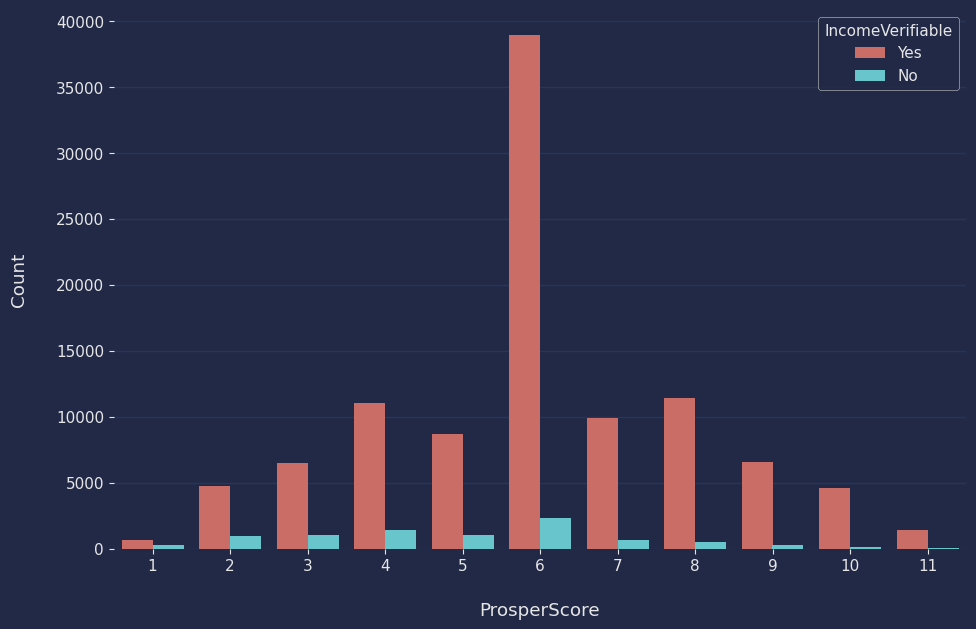

In [108]:
plt.figure(figsize=(11,7))
sns.countplot(data=score_charts, x='ProsperScore', hue='IncomeVerifiable', palette="hls")
plt.ylabel('Count', labelpad=20)
plt.xlabel('ProsperScore', labelpad=20)

#### ProsperScore x IncomeVerifiable Insight
Higher ProsperScores on tend to have proportionally less "No" values on IncomeVerifiable. ProsperScore 1 value has closest Yes:No ratio. This confirms that proving Income will help in obtaining a better ProsperScore, and are therefor one step closer to improved loan conditions.

Text(0.5, 0, 'ProsperScore')

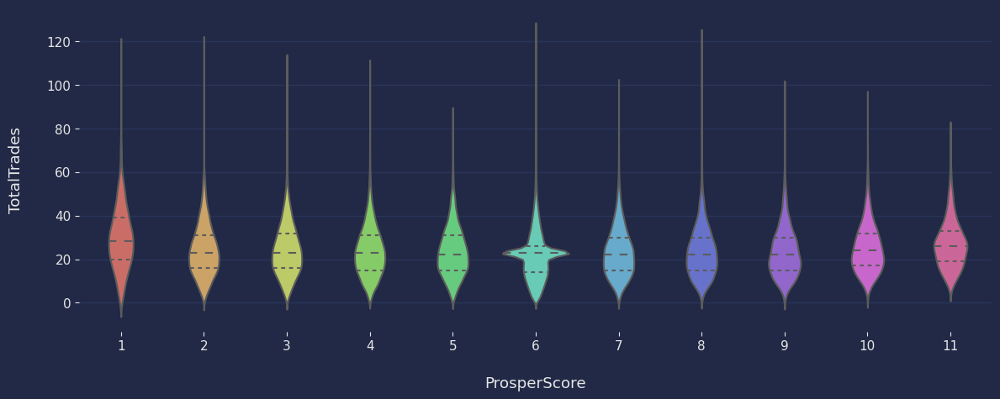

In [109]:
plt.figure(figsize=(14,5))
sns.violinplot(data=score_charts, x='ProsperScore', y='TotalTrades', inner='quartiles', palette="hls")
plt.ylabel('TotalTrades', labelpad=20)
plt.xlabel("ProsperScore", labelpad=20)

#### ProsperScore x TotalTrades Insight
Value of 1, 2, 6, and 8 have the peak outliers. This indicates it's possible to get up to an 8 ProsperScore having ~120 total trades. Keep in mind, this does only extend to 8. Values 9+ peak at 100, with 11 peaking at 80. Customers need to limit their total trades to increase ProsperScore. Distributions are similar between all values besides 6 which is due to the imputes, and 1; ProsperScore 1 customers on average vary more in terms of TotalTrades. Low or no correlation between these features.

Text(0.5, 0, 'ProsperScore')

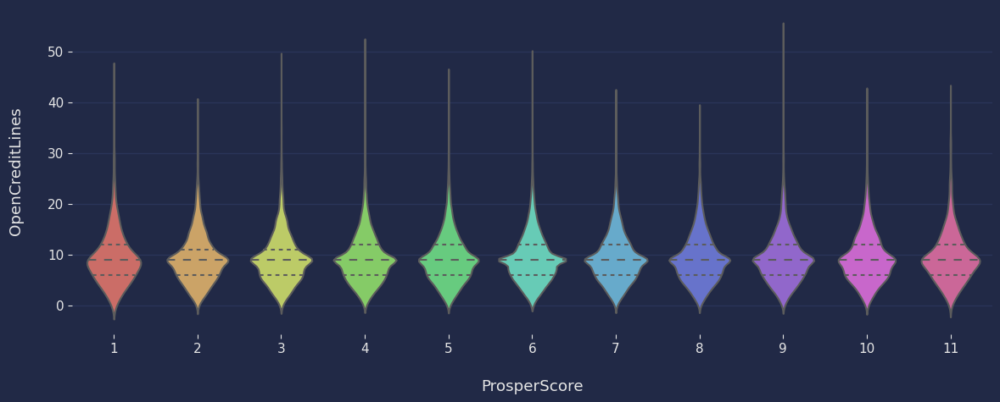

In [110]:
plt.figure(figsize=(14,5))
sns.violinplot(data=score_charts, x='ProsperScore', y='OpenCreditLines', inner='quartiles', palette="hls")
plt.ylabel('OpenCreditLines', labelpad=20)
plt.xlabel("ProsperScore", labelpad=20)

#### ProsperScore x OpenCreditLines Insight
Distributions are almost identical between ProserScores. Only significant difference in this chart are the outliers. These 2 features can be concluded as having no correlation.

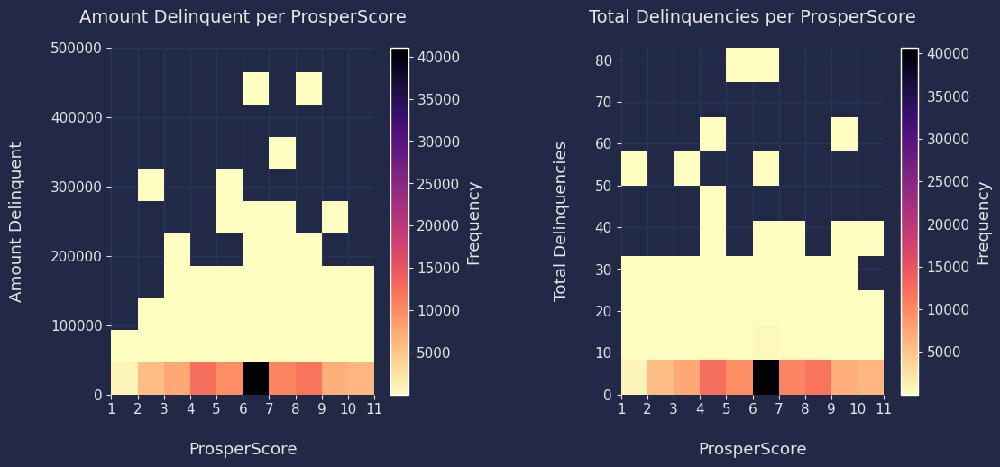

In [111]:
# Left chart
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
h1 = ax1.hist2d(data=score_charts, x='ProsperScore', y='AmountDelinquent', cmap='magma_r', cmin=1, bins=10)
ax1.set_title('Amount Delinquent per ProsperScore')
ax1.set_xlabel('ProsperScore', labelpad=20)
ax1.set_ylabel('Amount Delinquent', labelpad=20)
ax1.set_xticks([item for item in range(1, 12)])
ax1.set_ylim(0, 500000)
cbar1 = plt.colorbar(h1[3], ax=ax1)
cbar1.set_label('Frequency')

# Right chart
h2 = ax2.hist2d(data=score_charts, x='ProsperScore', y='CurrentDelinquents', cmap='magma_r', cmin=1, bins=10)
ax2.set_title('Total Delinquencies per ProsperScore')
ax2.set_xlabel('ProsperScore', labelpad=20)
ax2.set_ylabel('Total Delinquencies', labelpad=20)
ax2.set_xticks([item for item in range(1, 12)])
cbar2 = plt.colorbar(h2[3], ax=ax2)
cbar2.set_label('Frequency')

plt.subplots_adjust(wspace=.55)

#### Amount Delinquent x ProsperScore & Total Delinquencies x Prosper Score Insight
The left heatmap provides insight into the fact of nearly all customers maintaining a delinquent balance equal to or lower than 50,000. Outliers do exist above this figure. The middle ProsperScores of 4-8 have a higher population of customers with a 50,000 or less delinquent balance compared to others. Mode is ProsperScore 6 @ 50,000, max is ~450,000. The right heatmap shows similar distribution. The bottom tier, or 10, is applicable instead of 50,000. Mode is ProsperScore 6 @ 10, max is ~80. Similar amount of outliers for both heatmaps.
### Multivariate Analysis
* Are open credit lines and total trades proportiniate to each other for each ProsperScore?
* Which ProsperScores have the most concentrated values for open credit lines and total trades?
* Are "No" IncomeVerifiable values often delinquent or have higher delinquent balances than "Yes" values?

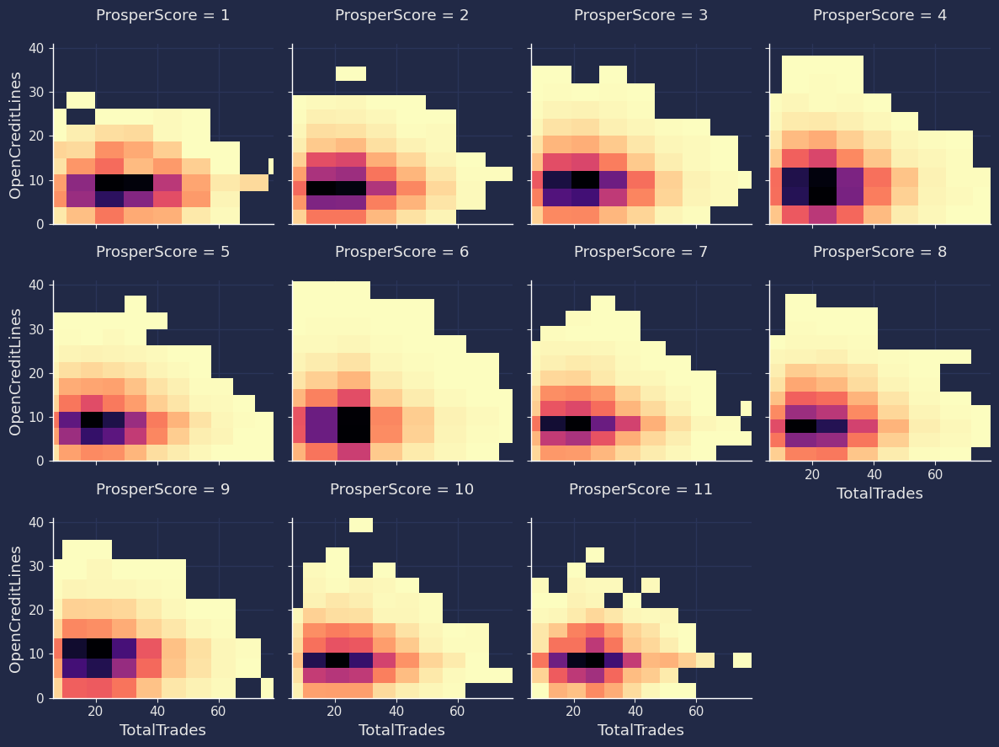

In [112]:
FG = sns.FacetGrid(data=score_charts, col='ProsperScore', col_wrap=4, height=3)
FG.map(plt.hist2d, 'TotalTrades', 'OpenCreditLines', cmap='magma_r', cmin=2, bins=12)
for ax in FG.axes.flat:
    for c in ax.collections:
        c.set_edgecolor("none")

#### Total Trades x Open Credit Lines per ProsperScore Insight
Mode within all charts includes 20 Trades x 10 Credit lines. ProsperScores: 1, 2, 4, 6, 9, 11 have a split mode between 2 cells. Distribution for each ProsperScore, besides 6, has a radius of 2 cells where values gradually fade into lower amounts then dispersing into a large radius low yellow values. Customers who stick within the higher frequency radius will yield better loan conditions. Opening too many credit lines or trades is going against the status quo and could harm financial standing, according to Prosper and other loan providers. ProsperScore 4 & 6 have the least variance in values, contrasted by scores 10 & 11.

Text(0.5, 0, 'ProsperScore')

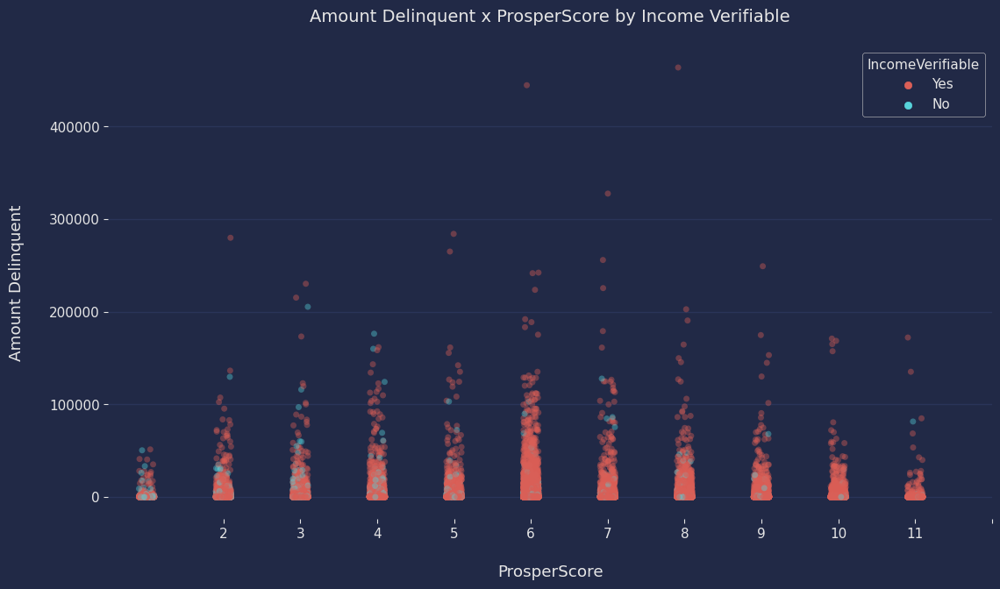

In [113]:
plt.figure(figsize=(13,7))
sns.stripplot(data=score_charts, x='ProsperScore', y='AmountDelinquent', palette="hls", hue='IncomeVerifiable',
               alpha=0.4)
plt.xticks([i for i in range(1,12)])
plt.title('Amount Delinquent x ProsperScore by Income Verifiable')
plt.ylabel('Amount Delinquent', labelpad=20)
plt.xlabel('ProsperScore', labelpad=20)

Text(0.5, 0, 'ProsperScore')

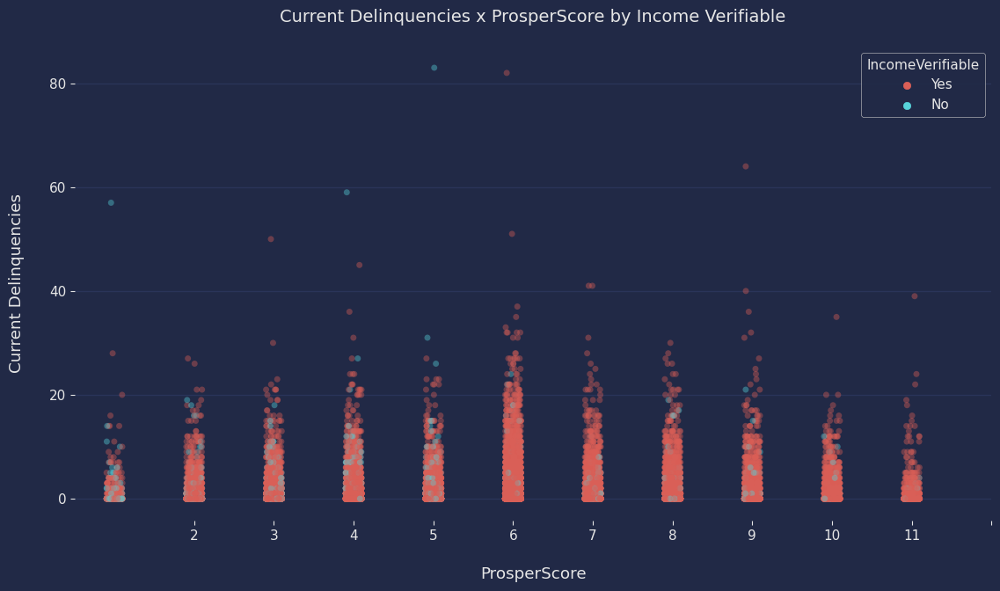

In [114]:
plt.figure(figsize=(13.45,7))
sns.stripplot(data=score_charts, x='ProsperScore', y='CurrentDelinquents', palette="hls", hue='IncomeVerifiable',
               alpha=0.4)
plt.xticks([i for i in range(1,12)])
plt.title('Current Delinquencies x ProsperScore by Income Verifiable')
plt.ylabel('Current Delinquencies', labelpad=20)
plt.xlabel('ProsperScore', labelpad=20)

#### ProsperScore x CurrentDelinquents & ProsperScore x AmountDelinquent - by IncomeVerifiable Insight
"No" IncomeVarifiable values are prominently less common in categories 6+ in the bottom chart, and evenly dispersed in the top chart. ProsperScores 6, 7, 8, 10, 11 have scarce amounts or none of this value. Bottom chart outliers are equally dispersed between IncomeVerifiable, with the top chart dominated by "Yes" for this metric. Its possible Prosper does consider current delinquencies as more problematic than delinquent amount balance. It's advisable for customers to keep their current delinquencies in check. Having customers so embedded with debt such as 60+ current delinquences or 300,000 balance owed is a financial gamble. The safe play is to deny loan borrowers of this stature any new loans.

### Correlation Analysis

In [115]:
combine_pk = loan_df.index

# function to add PK's to each table for a merge
def table_join(x, y, z):
    table_list = [x.copy(), y.copy(), z.copy()]
    final_list = []
    for item in table_list:
        item['PK'] = combine_pk
        final_list.append(item)
    return final_list

combine_tables = table_join(loan_df, credit_df, customer_ML)

x_table = combine_tables[0]
y_table = combine_tables[1]
z_table = combine_tables[2]

mega_table = pd.merge(x_table, pd.merge(y_table, z_table, on='PK', how='outer'), on='PK', how='outer')

In [116]:
mega_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113066 entries, 0 to 113065
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Term                        113066 non-null  int64  
 1   LoanStatus                  113066 non-null  object 
 2   BorrowerAPR                 113066 non-null  float64
 3   BorrowerRate                113066 non-null  float64
 4   ListingCategory (numeric)   113066 non-null  int64  
 5   LoanNumber                  113066 non-null  int64  
 6   LoanOriginalAmount          113066 non-null  int64  
 7   PK                          113066 non-null  int64  
 8   OpenCreditLines             113066 non-null  float64
 9   TotalCreditLinespast7years  113066 non-null  float64
 10  TotalInquiries              113066 non-null  float64
 11  CurrentDelinquencies        113066 non-null  float64
 12  AmountDelinquent            113066 non-null  float64
 13  BankcardUtiliz

In [117]:
# removing features with string values for correlation matrix
mega_table.drop(['LoanStatus', 'Occupation', 'EmploymentStatus', 'IncomeRange'], axis=1, inplace=True)

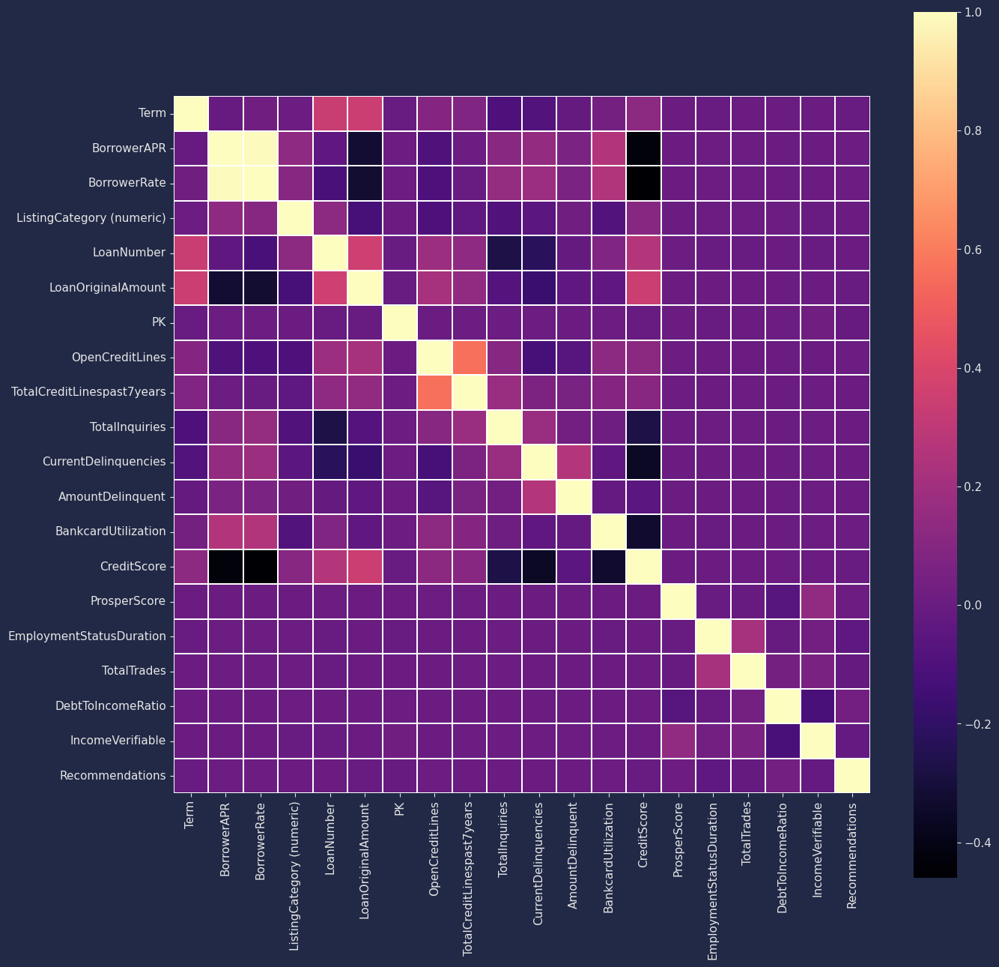

In [118]:
f, ax = plt.subplots(figsize=(15,15))
ax = sns.heatmap(mega_table.corr(),linewidths=.2 ,square=True, cmap='magma')

It's evident that most variables do not have a relationship between each other, whether thats a negative or positive one. Of those relationships, the majority are positive correlations.
#### Negatives
The orange squares and dark purples suggest a -.4 and -.2 r-value respectivelly. Loan Number, Loan Original Amount, Listing Category, Open Credit Lines, Total Inquiries, Current Delinquencies, Amount Delinquent, CreditScoreRangeLower & Upper, Bankcard Utilization, and Debt to Income Ratio are classified as having negative correlations. Most tend to float around -.2 r-value. There are 12 cells with the -.4 r-value. These are seen in the attributes of CreditScoreRangeLower & Upper, Loan Original Amount, APR, Rate, Total Inquiries, Current Delinquencies, and Bankcard Utilizaiton. 
#### Positives
The vanilla, orange, and pink are evident of positive relationships with r-values of 1, .6, and .4 respectivelly. BorrowerRate, BorrowerAPR, Loan Number, Loan Original Amount, CreditScoreRangeLower & Upper, Bankcard Utilization, Total Credit Lines past 7 years, and Current Delinquencies are classified as this type. A few of these also have polarized relationships with a different variable. 
#### Summary
Further analysis is required to formulate evidence of how exactly there variables influence each other, but the direction is clear. For the negatives, their higher or lower value causes the corresponding variable to respond oppositely. For the positives, their higher or lower values causes a similar response in the other variable. 

In [119]:
roots = pd.read_csv(r"C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\2. 02172024 - Root Cause & Risk Analysis on Loans\Tables\ProsperLoan_Data.csv")
roots

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.165,0.158,0.138,...,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.120,0.092,0.082,...,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.283,0.275,0.240,...,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.125,0.097,0.087,...,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.246,0.208,0.199,...,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113932,E6D9357655724827169606C,753087,2013-04-14 05:55:02.663000000,NaN,36,Current,NaN,0.224,0.186,0.176,...,-75.58,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
113933,E6DB353036033497292EE43,537216,2011-11-03 20:42:55.333000000,NaN,36,FinalPaymentInProgress,NaN,0.132,0.111,0.101,...,-30.05,0.0,0.0,0.0,0.0,1.0,0,0,0.0,22
113934,E6E13596170052029692BB1,1069178,2013-12-13 05:49:12.703000000,NaN,60,Current,NaN,0.240,0.215,0.205,...,-16.91,0.0,0.0,0.0,0.0,1.0,0,0,0.0,119
113935,E6EB3531504622671970D9E,539056,2011-11-14 13:18:26.597000000,NaN,60,Completed,2013-08-13 00:00:00,0.284,0.261,0.251,...,-235.05,0.0,0.0,0.0,0.0,1.0,0,0,0.0,274


In [120]:
pd.set_option('display.max_rows', None)
roots.isna().sum()

ListingKey                                  0
ListingNumber                               0
ListingCreationDate                         0
CreditGrade                             84984
Term                                        0
LoanStatus                                  0
ClosedDate                              58848
BorrowerAPR                                25
BorrowerRate                                0
LenderYield                                 0
EstimatedEffectiveYield                 29084
EstimatedLoss                           29084
EstimatedReturn                         29084
ProsperRating (numeric)                 29084
ProsperRating (Alpha)                   29084
ProsperScore                            29084
ListingCategory (numeric)                   0
BorrowerState                            5515
Occupation                               3588
EmploymentStatus                         2255
EmploymentStatusDuration                 7625
IsBorrowerHomeowner               

In [121]:
roots.columns

Index(['ListingKey', 'ListingNumber', 'ListingCreationDate', 'CreditGrade',
       'Term', 'LoanStatus', 'ClosedDate', 'BorrowerAPR', 'BorrowerRate',
       'LenderYield', 'EstimatedEffectiveYield', 'EstimatedLoss',
       'EstimatedReturn', 'ProsperRating (numeric)', 'ProsperRating (Alpha)',
       'ProsperScore', 'ListingCategory (numeric)', 'BorrowerState',
       'Occupation', 'EmploymentStatus', 'EmploymentStatusDuration',
       'IsBorrowerHomeowner', 'CurrentlyInGroup', 'GroupKey',
       'DateCreditPulled', 'CreditScoreRangeLower', 'CreditScoreRangeUpper',
       'FirstRecordedCreditLine', 'CurrentCreditLines', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'OpenRevolvingAccounts',
       'OpenRevolvingMonthlyPayment', 'InquiriesLast6Months', 'TotalInquiries',
       'CurrentDelinquencies', 'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'Availa

In [122]:
roots.drop(['GroupKey', 'CreditGrade', 'ClosedDate'], axis=1, inplace=True)
roots[['TotalProsperLoans',
       'TotalProsperPaymentsBilled', 'OnTimeProsperPayments',
       'ProsperPaymentsLessThanOneMonthLate',
       'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed',
       'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing',
       'LoanCurrentDaysDelinquent', 'LoanFirstDefaultedCycleNumber']] = roots[['TotalProsperLoans',
       'TotalProsperPaymentsBilled', 'OnTimeProsperPayments',
       'ProsperPaymentsLessThanOneMonthLate',
       'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed',
       'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing',
       'LoanCurrentDaysDelinquent', 'LoanFirstDefaultedCycleNumber']].fillna(0)
roots.dropna(inplace=True)
roots.isna().sum().sum()

0

In [123]:
print(roots.shape)
roots.info()

(76216, 78)
<class 'pandas.core.frame.DataFrame'>
Index: 76216 entries, 1 to 113936
Data columns (total 78 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ListingKey                           76216 non-null  object 
 1   ListingNumber                        76216 non-null  int64  
 2   ListingCreationDate                  76216 non-null  object 
 3   Term                                 76216 non-null  int64  
 4   LoanStatus                           76216 non-null  object 
 5   BorrowerAPR                          76216 non-null  float64
 6   BorrowerRate                         76216 non-null  float64
 7   LenderYield                          76216 non-null  float64
 8   EstimatedEffectiveYield              76216 non-null  float64
 9   EstimatedLoss                        76216 non-null  float64
 10  EstimatedReturn                      76216 non-null  float64
 11  ProsperRating (numer

<Axes: >

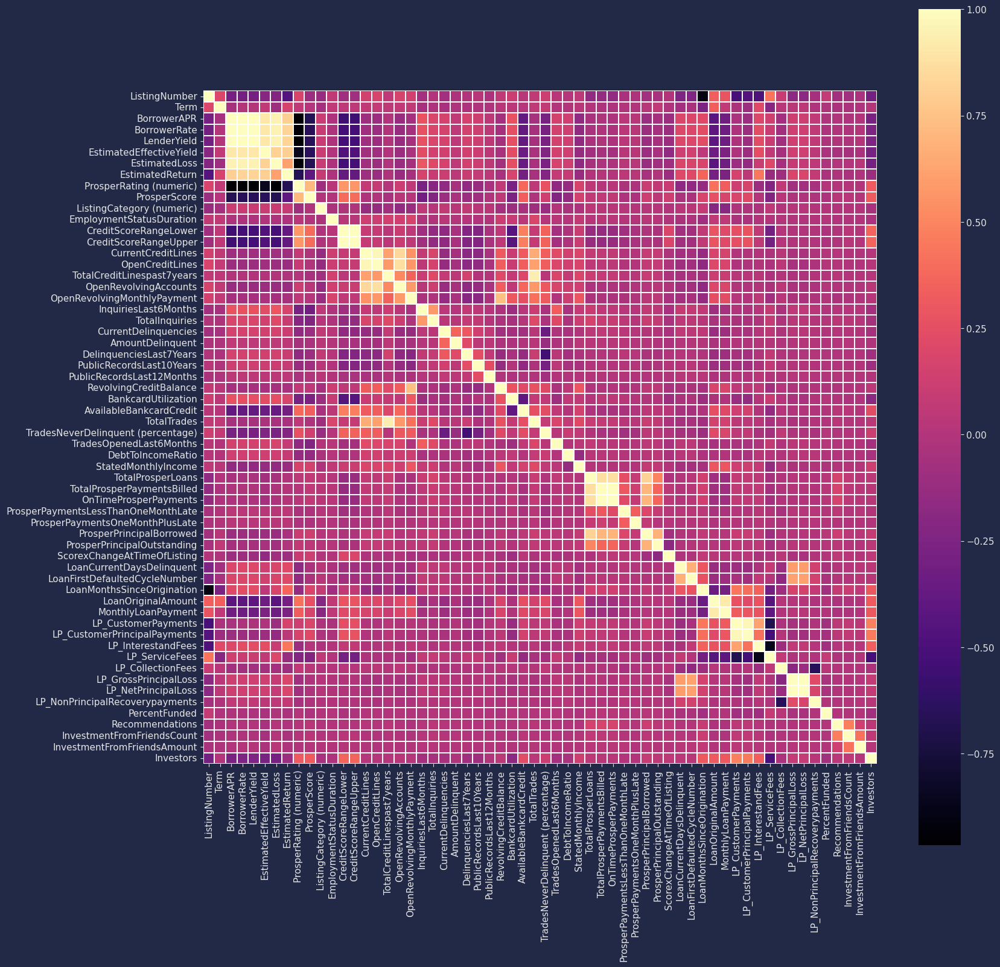

In [124]:
roots.drop(['MemberKey', 'LoanKey', 'LoanNumber', 'LoanOriginationQuarter', 'DateCreditPulled', 'ListingKey', 'LoanOriginationDate'], inplace=True, axis=1)
num_cols = []
obj_cols = []
for col in roots.columns:
    if roots[col].dtype == 'object' or roots[col].dtype == 'bool':
        obj_cols.append(col)
    else:
        num_cols.append(col)

f, ax = plt.subplots(figsize=(18,18))
sns.heatmap(roots[num_cols].corr(),linewidths=.2 ,square=True, cmap='magma', ax=ax)

In [125]:
roots.reset_index(drop=True, inplace=True)
root_sample = roots.sample(n=500, random_state=22)
s1_cols = ['EstimatedReturn', 'BorrowerAPR', 'LP_InterestandFees', 'LoanMonthsSinceOrigination']

rootS = root_sample.copy(deep=True)
roots_scaled, Rscale = SSstandardize(root_sample[s1_cols])
for c, col in enumerate(s1_cols):
    rootS[col] =  roots_scaled[:, c]

model_params = pd.DataFrame()

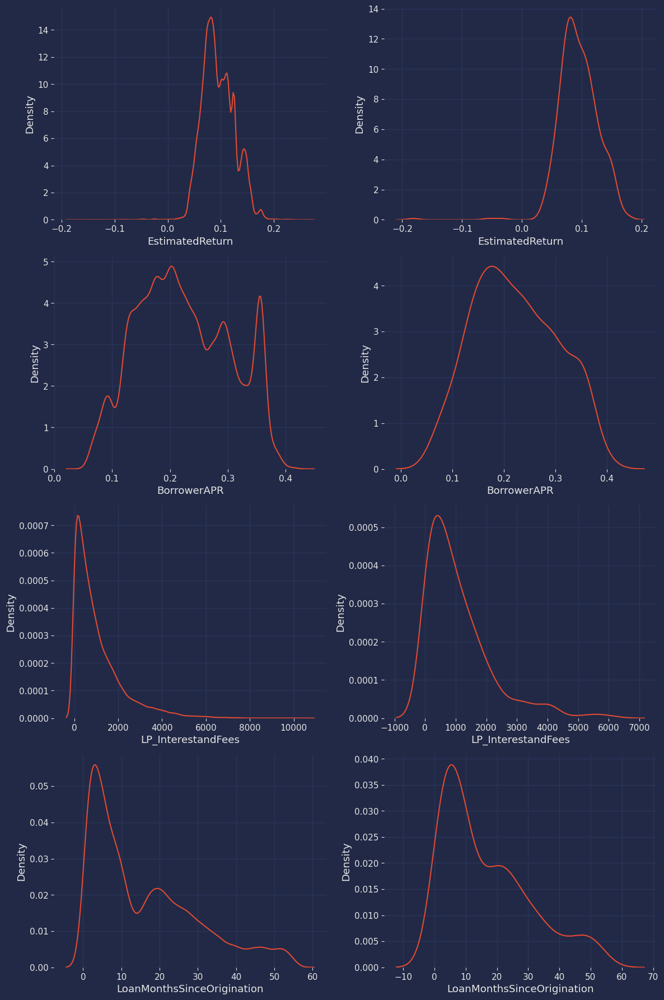

In [126]:
pd.set_option('display.max_rows', 10)
fig, axs = plt.subplots(4, 2, figsize=(12,18))
axs = axs.flatten()
sns.kdeplot(roots, x='EstimatedReturn', ax=axs[0])
sns.kdeplot(root_sample, x='EstimatedReturn', ax=axs[1])
sns.kdeplot(roots, x='BorrowerAPR', ax=axs[2])
sns.kdeplot(root_sample, x='BorrowerAPR', ax=axs[3])
sns.kdeplot(roots, x='LP_InterestandFees', ax=axs[4])
sns.kdeplot(root_sample, x='LP_InterestandFees', ax=axs[5])
sns.kdeplot(roots, x='LoanMonthsSinceOrigination', ax=axs[6])
sns.kdeplot(root_sample, x='LoanMonthsSinceOrigination', ax=axs[7])
plt.tight_layout()
plt.show()

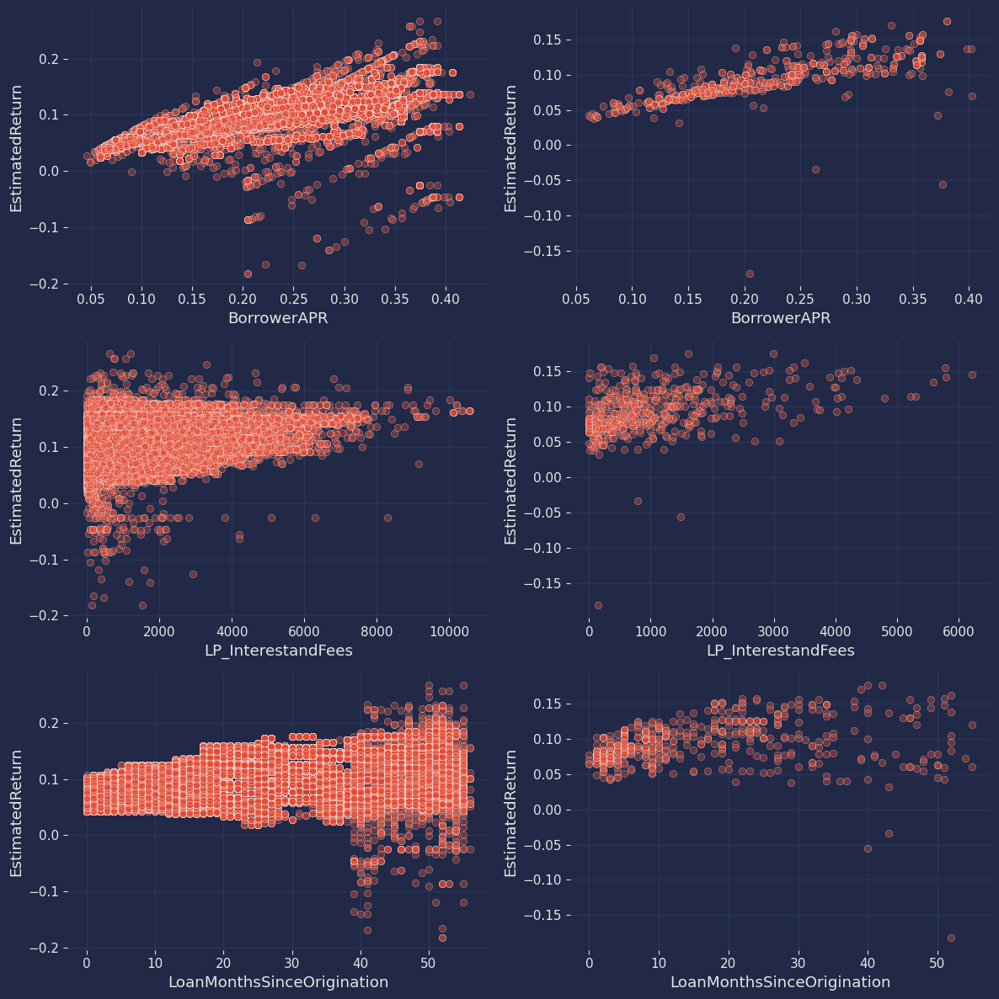

In [127]:
fig, axs = plt.subplots(3, 2, figsize=(12,12))
axs = axs.flatten()
sns.scatterplot(roots, x='BorrowerAPR', y="EstimatedReturn", ax=axs[0], alpha=.4)
sns.scatterplot(root_sample, x='BorrowerAPR', y="EstimatedReturn",ax=axs[1], alpha=.4)
sns.scatterplot(roots, x='LP_InterestandFees', y="EstimatedReturn",ax=axs[2], alpha=.4)
sns.scatterplot(root_sample, x='LP_InterestandFees', y="EstimatedReturn",ax=axs[3], alpha=.4)
sns.scatterplot(roots, x='LoanMonthsSinceOrigination', y="EstimatedReturn",ax=axs[4], alpha=.4)
sns.scatterplot(root_sample, x='LoanMonthsSinceOrigination', y="EstimatedReturn",ax=axs[5], alpha=.4)
plt.tight_layout()
plt.show()

                            OLS Regression Results                            
Dep. Variable:        EstimatedReturn   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.492
Method:                 Least Squares   F-statistic:                     393.3
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           6.10e-65
Time:                        09:15:49   Log-Likelihood:                -539.83
No. Observations:                 500   AIC:                             1084.
Df Residuals:                     498   BIC:                             1092.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept     -1.7e-16      0.032  -5.33e-15      

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


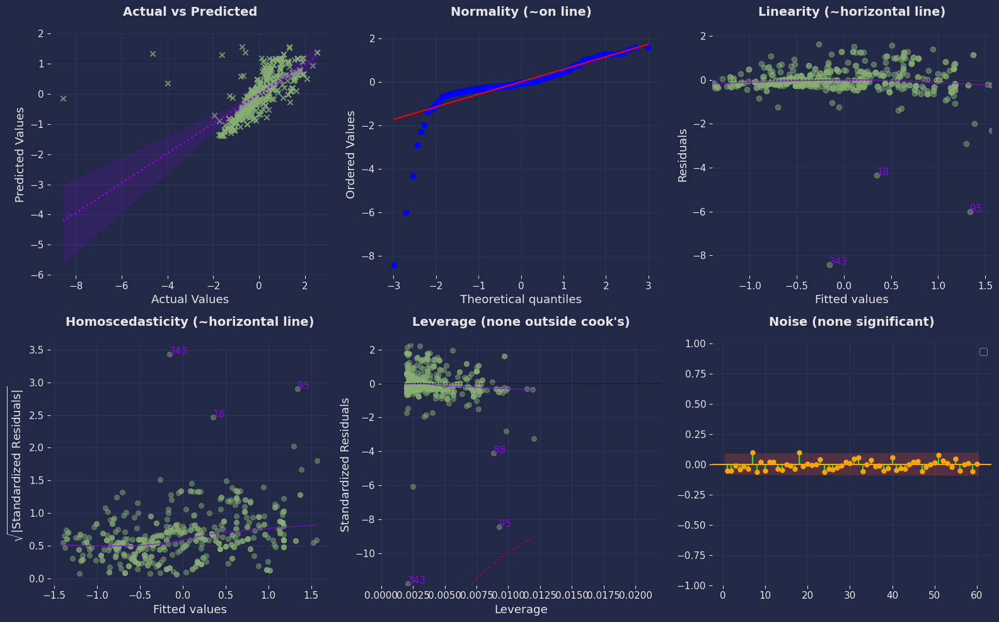

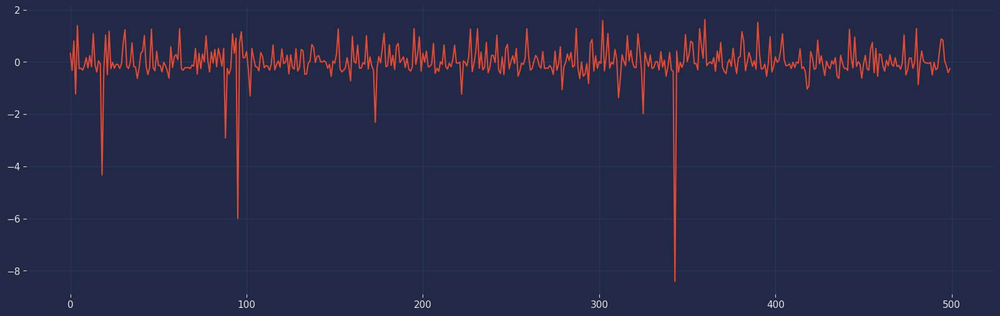

In [128]:
return_model = smf.ols('EstimatedReturn ~ BorrowerAPR', rootS).fit(cov_type='HC1')
model_params['returnAPR'] = [return_model.params[0], return_model.params[1], return_model.bse[1], return_model.tvalues[1], return_model.pvalues[1], [i for i in return_model.conf_int()[1]]]

print(return_model.summary())
SST = return_model.centered_tss
SSR = return_model.ssr
SSE = return_model.mse_model
MSE = return_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(return_model)
vifDF, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:        EstimatedReturn   R-squared:                       0.149
Model:                            OLS   Adj. R-squared:                  0.147
Method:                 Least Squares   F-statistic:                     110.3
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           1.90e-23
Time:                        09:15:50   Log-Likelihood:                -669.14
No. Observations:                 500   AIC:                             1342.
Df Residuals:                     498   BIC:                             1351.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            -1.7e-16      0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


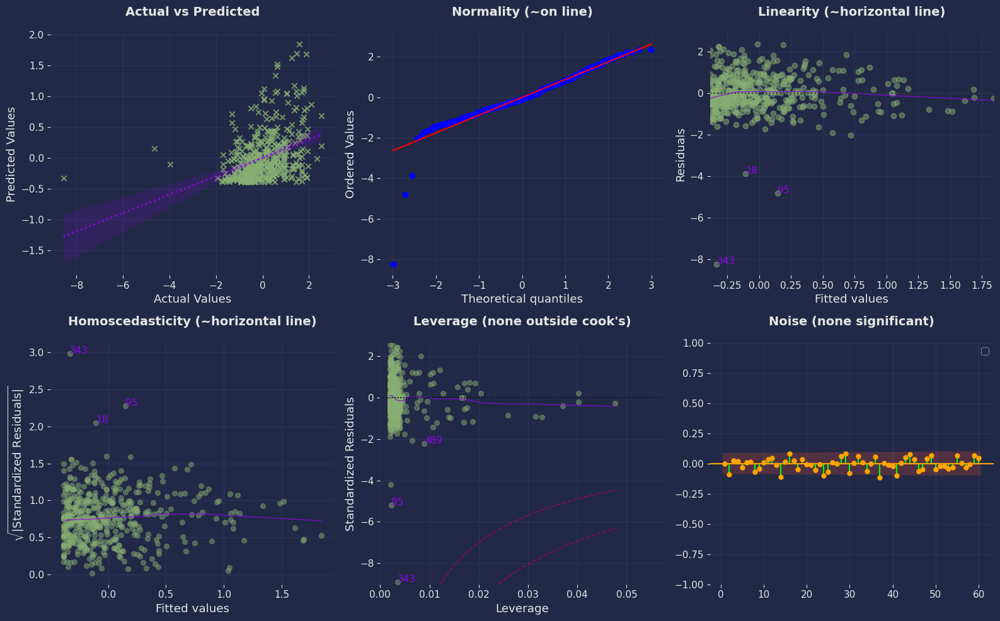

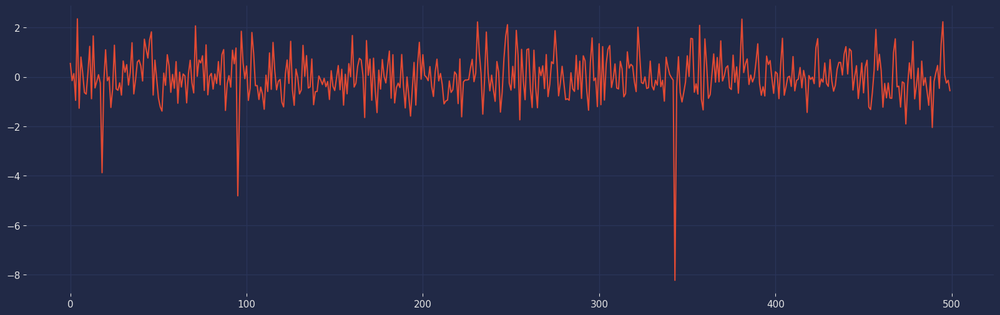

In [129]:
return_model = smf.ols('EstimatedReturn ~ LP_InterestandFees', rootS).fit(cov_type='HC1')
model_params['returnFees'] = [return_model.params[0], return_model.params[1], return_model.bse[1], return_model.tvalues[1], return_model.pvalues[1], [i for i in return_model.conf_int()[1]]]

print(return_model.summary())
SST = return_model.centered_tss
SSR = return_model.ssr
SSE = return_model.mse_model
MSE = return_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(return_model)
vifDF, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:        EstimatedReturn   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.034
Method:                 Least Squares   F-statistic:                     7.446
Date:                Fri, 19 Apr 2024   Prob (F-statistic):            0.00658
Time:                        09:15:51   Log-Likelihood:                -700.37
No. Observations:                 500   AIC:                             1405.
Df Residuals:                     498   BIC:                             1413.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


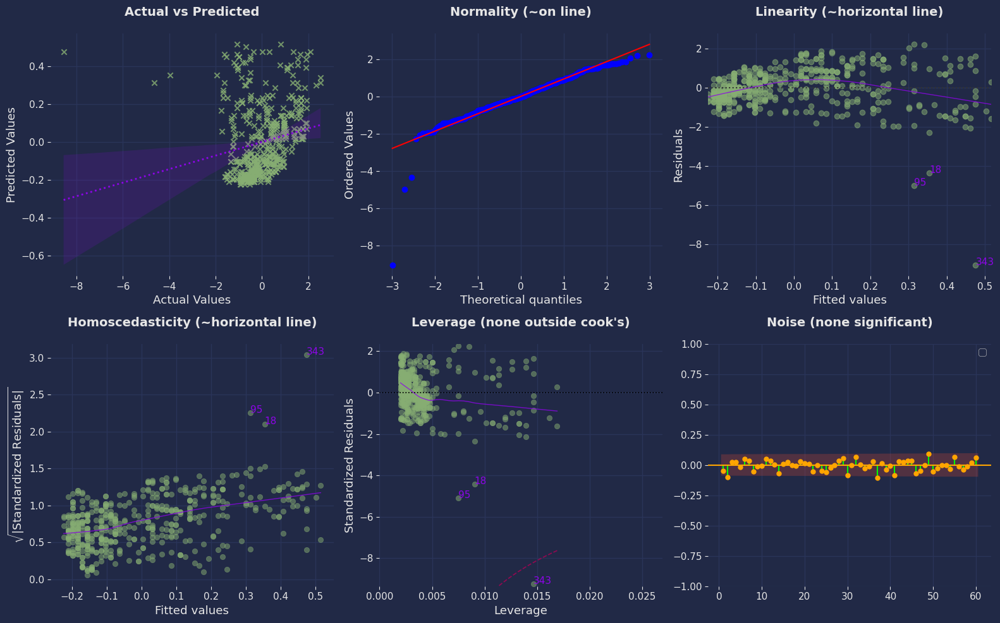

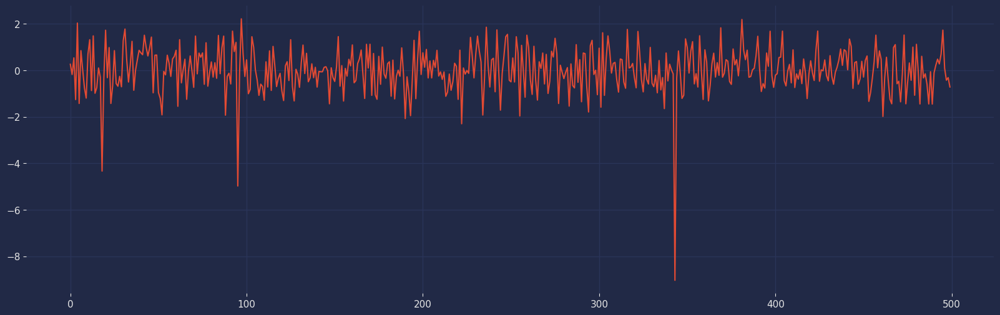

In [130]:
return_model = smf.ols('EstimatedReturn ~ LoanMonthsSinceOrigination', rootS).fit(cov_type='HC1')
model_params['returnMonths'] = [return_model.params[0], return_model.params[1], return_model.bse[1], return_model.tvalues[1], return_model.pvalues[1], [i for i in return_model.conf_int()[1]]]

print(return_model.summary())
SST = return_model.centered_tss
SSR = return_model.ssr
SSE = return_model.mse_model
MSE = return_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(return_model)
vifDF, fig, ax = cls()

                                 OLS Regression Results                                
Dep. Variable:        EstimatedReturn   R-squared (uncentered):                   0.570
Model:                            OLS   Adj. R-squared (uncentered):              0.567
Method:                 Least Squares   F-statistic:                              200.0
Date:                Fri, 19 Apr 2024   Prob (F-statistic):                    4.81e-85
Time:                        09:15:52   Log-Likelihood:                         -498.74
No. Observations:                 500   AIC:                                      1003.
Df Residuals:                     497   BIC:                                      1016.
Df Model:                           3                                                  
Covariance Type:                  HC1                                                  
                                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


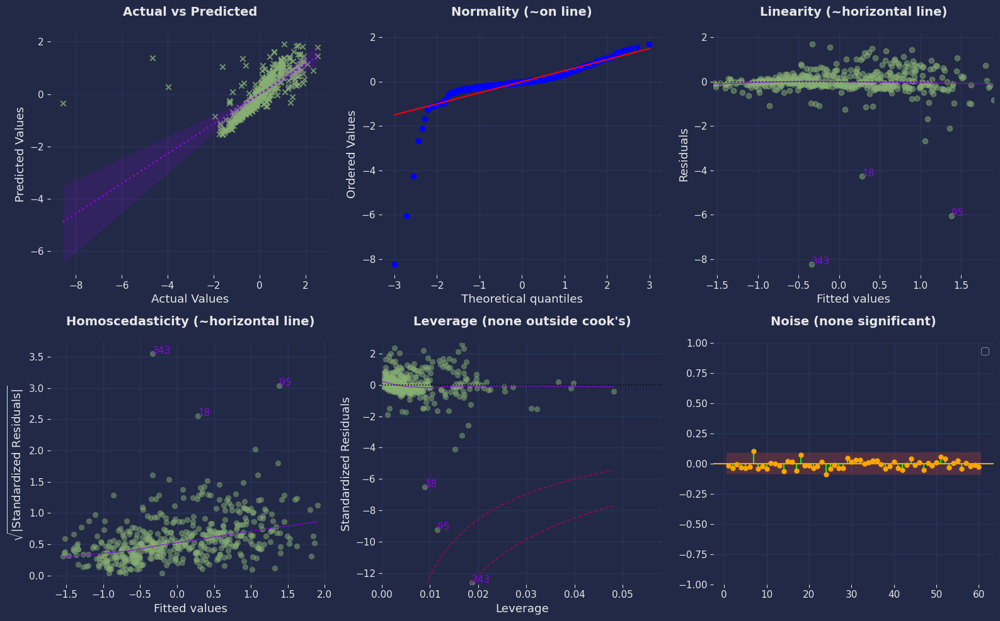

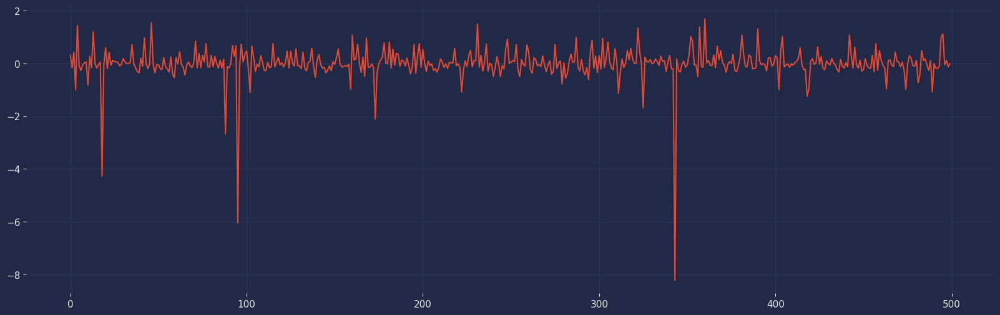

In [131]:
return_model = smf.ols('EstimatedReturn ~ BorrowerAPR + LP_InterestandFees + LoanMonthsSinceOrigination - 1', rootS).fit(cov_type='HC1', use_t=True)
print(return_model.summary())
SST = return_model.centered_tss
SSR = return_model.ssr
SSE = return_model.mse_model
MSE = return_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(return_model)
vif, fig, ax = cls()

In [132]:
vif

,Features,VIF Factor
0,BorrowerAPR,1.04
2,LoanMonthsSinceOrigination,1.11
1,LP_InterestandFees,1.12


In [133]:
rootsM = roots[['BorrowerAPR', 'LoanMonthsSinceOrigination', 'LP_InterestandFees', 'LoanOriginalAmount']]
rootsM.describe()

,BorrowerAPR,LoanMonthsSinceOrigination,LP_InterestandFees,LoanOriginalAmount
count,76216.000,76216.000,76216.000,76216.000
mean,0.224,15.947,1054.556,9294.999
std,0.079,13.835,1135.514,6413.404
min,0.046,0.000,-2.350,1000.000
25%,0.162,4.000,265.298,4000.000
50%,0.216,11.000,693.040,8000.000
75%,0.288,25.000,1452.930,14603.250
max,0.424,56.000,10572.780,35000.000


In [134]:
oldM = rootsM.query('LoanMonthsSinceOrigination > 24')
newM = rootsM.query('LoanMonthsSinceOrigination <= 12')
oldM['Return'] = (oldM['BorrowerAPR']*oldM['LoanMonthsSinceOrigination']*oldM['LP_InterestandFees'])+oldM['LoanOriginalAmount']
oldM['APR x Amount'] = oldM['BorrowerAPR']*oldM['LoanMonthsSinceOrigination']+oldM['LoanOriginalAmount']
newM['APR x Amount'] = newM['BorrowerAPR']*newM['LoanMonthsSinceOrigination']+newM['LoanOriginalAmount']
newM['Return'] = (newM['BorrowerAPR']*newM['LoanMonthsSinceOrigination']*newM['LP_InterestandFees'])+newM['LoanOriginalAmount']
oldM.describe()

,BorrowerAPR,LoanMonthsSinceOrigination,LP_InterestandFees,LoanOriginalAmount,Return,APR x Amount
count,19167.000,19167.000,19167.000,19167.000,19167.000,19167.000
mean,0.245,35.968,1507.030,6218.903,19514.705,6227.594
std,0.094,8.801,1353.794,4469.763,15750.335,4468.264
min,0.046,25.000,0.000,1000.000,1000.000,1001.974
25%,0.161,28.000,519.355,3000.000,8203.124,3008.949
50%,0.257,34.000,1112.820,5000.000,15420.868,5005.651
75%,0.331,43.000,2091.200,8000.000,26393.736,8003.834
max,0.424,56.000,10572.780,25000.000,192167.971,25014.165


In [135]:
newM.describe()

,BorrowerAPR,LoanMonthsSinceOrigination,LP_InterestandFees,LoanOriginalAmount,APR x Amount,Return
count,40206.000,40206.000,40206.000,40206.000,40206.000,40206.000
mean,0.204,5.177,596.778,11236.491,11237.592,12209.985
std,0.064,3.312,629.972,6767.810,6767.601,7177.618
min,0.061,0.000,-2.350,2000.000,2000.000,2000.000
25%,0.156,2.000,145.730,5000.000,5001.073,6052.146
50%,0.199,5.000,407.810,10000.000,10001.094,10767.263
75%,0.244,8.000,836.044,15000.000,15000.985,15974.529
max,0.354,12.000,5079.080,35000.000,35002.265,46505.284


In [136]:
# simple interest formula
newM_reg = (.6553*.204)+(.2754*596.778)+(.0172*5.177)
oldM_reg = (.6553*.245)+(.2754*1507.03)+(.0172*35.968)
print(newM_reg)
print(oldM_reg)

164.57538680000002
415.8152601


In [137]:
chartN = pd.DataFrame()
newMIF = newM['LP_InterestandFees'].sum()
oldMIF = oldM['LP_InterestandFees'].sum()

chartN['Profit'] = [newMIF, oldMIF]
chartN['Profit Type'] = ['Interest & Fees', 'Interest & Fees']
chartN['Return'] = [newM['Return'].sum()/2, oldM['Return'].sum()/2]
chartN['Loan Months'] = ['Under 1 year', 'Over 1 year']
chartN

,Profit,Profit Type,Return,Loan Months
0,2.399e+07,Interest & Fees,2.455e+08,Under 1 year
1,2.889e+07,Interest & Fees,1.870e+08,Over 1 year


In [138]:
chartL = pd.DataFrame()
chartL['Return'] = [newM['Return'].sum()/2, oldM['Return'].sum()/2]
chartL['Loan Months'] = ['Under 1 year', 'Over 1 year']
chartL['Profit Type'] = ['APR', 'APR']
chartL['Profit'] = [newM['APR x Amount'].sum(), oldM['APR x Amount'].sum()]
chartL

,Return,Loan Months,Profit Type,Profit
0,2.455e+08,Under 1 year,APR,4.518e+08
1,1.870e+08,Over 1 year,APR,1.194e+08


In [139]:
lineC = pd.concat([oldM, newM])
barC = pd.concat([chartL, chartN])

Text(0, 0.5, 'Profit (mi')

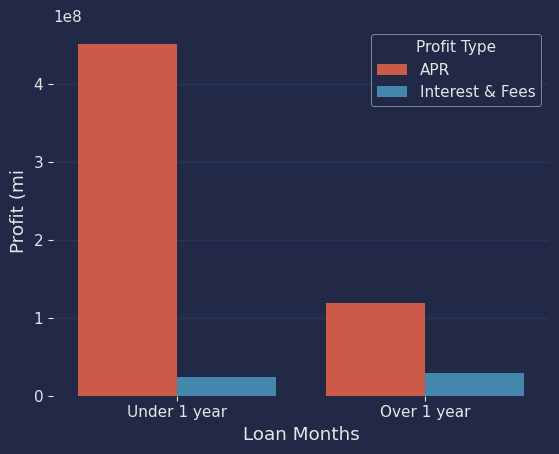

In [140]:
sns.barplot(barC, x='Loan Months', y='Profit', hue='Profit Type')
plt.ylabel('Profit (mi')

In [141]:
lineC.describe()

,BorrowerAPR,LoanMonthsSinceOrigination,LP_InterestandFees,LoanOriginalAmount,Return,APR x Amount
count,59373.000,59373.000,59373.000,59373.000,59373.000,59373.000
mean,0.217,15.117,890.629,9616.696,14568.120,9620.247
std,0.078,15.482,1020.547,6555.139,11253.112,6553.394
min,0.046,0.000,-2.350,1000.000,1000.000,1001.974
25%,0.158,3.000,208.790,4000.000,6719.635,4003.254
50%,0.206,8.000,563.900,8500.000,11885.714,8500.780
75%,0.279,28.000,1190.680,15000.000,18833.722,15000.208
max,0.424,56.000,10572.780,35000.000,192167.971,35002.265


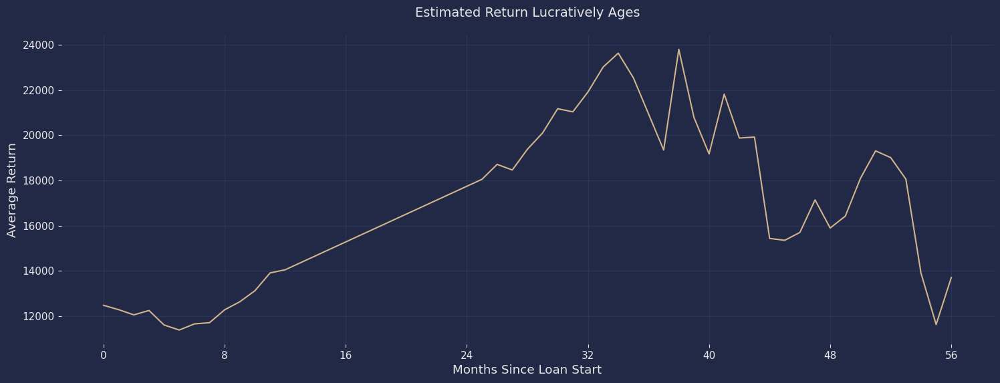

In [142]:
fig, axs = plt.subplots(1, 1, figsize=(18, 6))
sns.lineplot(lineC, x='LoanMonthsSinceOrigination', y='Return', ax=axs, color='tan', estimator='mean', ci=None)
plt.xticks(range(0, 64, 8))
plt.xlabel('Months Since Loan Start')
plt.ylabel('Average Return')
plt.title('Estimated Return Lucratively Ages')
plt.show()

In [247]:
lineC[lineC['LoanMonthsSinceOrigination']==48].mean()

BorrowerAPR                       0.204
LoanMonthsSinceOrigination       48.000
LP_InterestandFees              997.084
LoanOriginalAmount             4791.205
Return                        15894.174
APR x Amount                   4801.001
dtype: float64

In [231]:
lineC[lineC['LoanMonthsSinceOrigination']==25].mean()

BorrowerAPR                       0.235
LoanMonthsSinceOrigination       25.000
LP_InterestandFees             1720.213
LoanOriginalAmount             7703.747
Return                        18049.871
APR x Amount                   7709.614
dtype: float64

In [243]:
lineC[lineC['LoanMonthsSinceOrigination']==12].mean()

BorrowerAPR                       0.222
LoanMonthsSinceOrigination       12.000
LP_InterestandFees             1392.582
LoanOriginalAmount            10323.012
Return                        14048.957
APR x Amount                  10325.680
dtype: float64

In [233]:
lineC['Return'].mean()

14568.12023986302

## Estimated Return for Loan Months Z-tests
What's the probability that a customer's Estimated Return is less than the average 24 months?
* null hypothesis: x̄ >= 18049.87
* alternate hypothesis: x̄ < 18049.87

In [256]:
X = lineC['Return']
Y = 18049.87
alpha = .025
z_stat, p_value = ztest(X, value=Y, alternative='smaller', ddof=0)
sample_std = np.std(X) 
n = len(X)
# standard error
sem = sample_std / np.sqrt(n)
# z-score
z_score = (Y-X.mean())/sample_std
# Confidence interval
ci_lower = Y - z_score * sem
ci_upper = Y + z_score * sem

#if p_value > alpha:
    #print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
#else:
    #print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

print("Z-statistic:", round(z_stat, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))
print(f"P(z<{Y}) = .62172")
print(f'Score: {round(z_score, 3)}')

Z-statistic: -75.392
P-value: 0.0
Standard error: 46.1821864
Confidence Interval Upper: 18064.15904
Confidence Interval Lower: 18035.58096
P(z<18049.87) = .62172
Score: 0.309


What's the probability that a customer's Estimated Return is less than the average 12 months?
* null hypothesis: x̄ >= 14048.957
* alternate hypothesis: x̄ < 14048.957

In [257]:
X = lineC['Return']
Y = 14048.96
alpha = .025
z_stat, p_value = ztest(X, value=Y, alternative='smaller', ddof=0)
sample_std = np.std(X) 
n = len(X)
# standard error
sem = sample_std / np.sqrt(n)
# z-score
z_score = (Y-X.mean())/sample_std
# Confidence interval
ci_lower = Y - z_score * sem
ci_upper = Y + z_score * sem

#if p_value > alpha:
    #print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
#else:
    #print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

print("Z-statistic:", round(z_stat, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))
print(f"P(z<{Y}) = .32276")
print(f'Score: {round(z_score, 3)}')

Z-statistic: 11.242
P-value: 1.0
Standard error: 46.1821864
Confidence Interval Upper: 14046.82938
Confidence Interval Lower: 14051.09062
P(z<14048.96) = .32276
Score: -0.046


What's the probability that a customer's Estimated Return is less than the average 48 months?
* null hypothesis: x̄ >= 15894.174
* alternate hypothesis: x̄ < 15894.174

In [258]:
X = lineC['Return']
Y = 15894.17
alpha = .025
z_stat, p_value = ztest(X, value=Y, alternative='smaller', ddof=0)
sample_std = np.std(X) 
n = len(X)
# standard error
sem = sample_std / np.sqrt(n)
# z-score
z_score = (Y-X.mean())/sample_std
# Confidence interval
ci_lower = Y - z_score * sem
ci_upper = Y + z_score * sem

#if p_value > alpha:
    #print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
#else:
    #print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

print("Z-statistic:", round(z_stat, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))
print(f"P(z<{Y}) = .54776")
print(f'Score: {round(z_score, 3)}')

Z-statistic: -28.713
P-value: 1.2961141524460264e-181
Standard error: 46.1821864
Confidence Interval Upper: 15899.61209
Confidence Interval Lower: 15888.72791
P(z<15894.17) = .54776
Score: 0.118


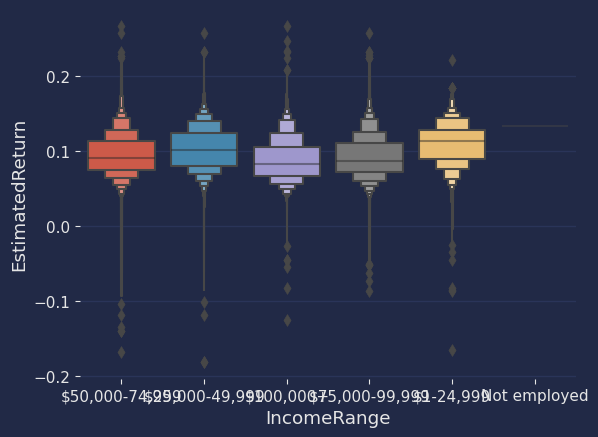

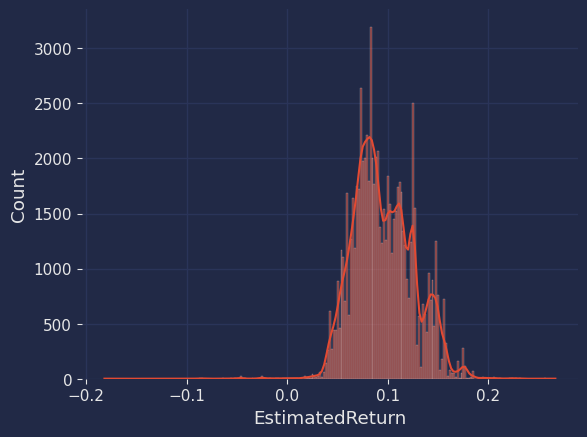

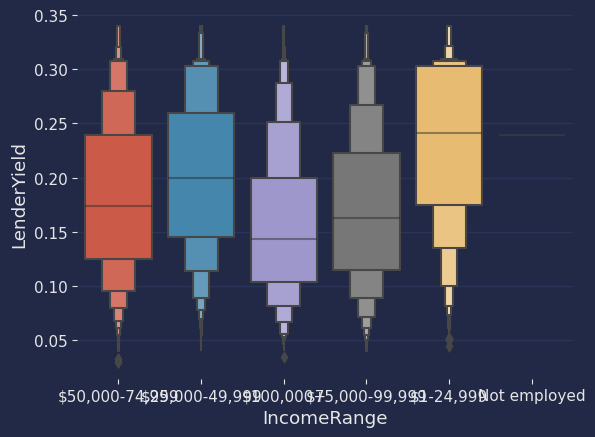

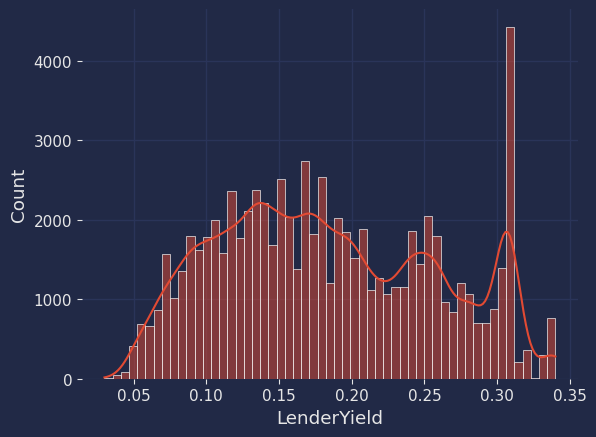

In [143]:
sns.boxenplot(roots, x='IncomeRange', y='EstimatedReturn')
plt.show()
sns.histplot(roots, x='EstimatedReturn', kde=True)
plt.show()
sns.boxenplot(roots, x='IncomeRange', y='LenderYield')
plt.show()
sns.histplot(roots, x='LenderYield', kde=True)
plt.show()

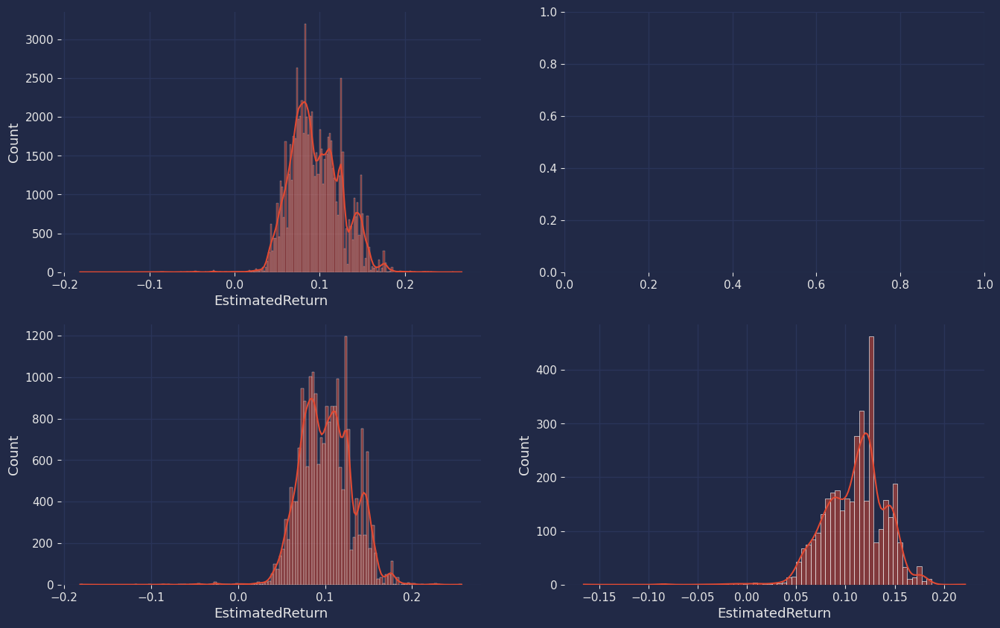

In [144]:
roots_25 = roots.query('IncomeRange == "$25,000-49,999"')
roots_1 = roots.query('IncomeRange == "$1-24,999"')
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs = axs.flatten()
sns.histplot(roots, x='EstimatedReturn', kde=True, ax=axs[0])
sns.histplot(roots_25, x='EstimatedReturn', kde=True, ax=axs[2])
sns.histplot(roots_1, x='EstimatedReturn', kde=True, ax=axs[3])
plt.show()

In [145]:
roots_1[['EstimatedReturn']].describe()

,EstimatedReturn
count,3578.000
mean,0.110
std,0.030
min,-0.166
25%,0.090
50%,0.114
75%,0.128
max,0.222


In [146]:
roots_25[['EstimatedReturn']].describe()

,EstimatedReturn
count,21421.000
mean,0.102
std,0.030
min,-0.182
25%,0.080
50%,0.101
75%,0.124
max,0.257


In [147]:
roots[['EstimatedReturn']].describe()

,EstimatedReturn
count,76216.000
mean,0.096
std,0.030
min,-0.182
25%,0.074
50%,0.091
75%,0.115
max,0.267


In [148]:
X = roots['EstimatedReturn']
Y = roots_1['EstimatedReturn']
alpha = .025
z_score = .46
hypno_mean = np.mean(Y)
descr_stats = sm.stats.DescrStatsW(X)
z_stat, p_value = descr_stats.ztest_mean(value=hypno_mean, alternative='larger')
sample_std = np.std(X) 
sample_size = len(Y)
# standard error
sem = sample_std / np.sqrt(sample_size)
# Confidence interval
ci_lower = hypno_mean - z_score * sem
ci_upper = hypno_mean + z_score * sem

if p_value > alpha:
    print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
else:
    print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

print("Z-statistic:", z_stat)
print("P-value:", p_value)
print("Standard error:", sem)
print("Confidenc Interval Upper:", ci_upper)
print("Confidenc Interval Lower:", ci_lower)
print("P(z<.102) = .6808")

SIGNIFICANCE NOT DETECTED

Z-statistic: -134.94567810923667
P-value: 1.0
Standard error: 0.0005020433826670968
Confidenc Interval Upper: 0.11043762804993408
Confidenc Interval Lower: 0.10997574813788034
P(z<.102) = .6808


In [149]:
mask = roots[roots['IncomeRange']=='Not employed'].index
r_chart = roots.copy(deep=True)
r_chart.drop(mask, inplace=True, axis=0)

In [150]:
income_ranks = ['$1-24,999', '$25,000-49,999', '$50,000-74,999',
                '$75,000-99,999', '$100,000+']
income_dtype = pd.CategoricalDtype(categories=income_ranks, ordered=True)
r_chart['IncomeRange'] = r_chart['IncomeRange'].astype(income_dtype)
r_chart['EstimatedReturn'] = r_chart['EstimatedReturn']*100

In [151]:
roots_1 = round(roots.query('IncomeRange == "$1-24,999"')['EstimatedReturn'].mean()*100, 2)
roots_25 = round(roots.query('IncomeRange == "$25,000-49,999"')['EstimatedReturn'].mean()*100, 2)
roots_50 = round(roots.query('IncomeRange == "$50,000-74,999"')['EstimatedReturn'].mean()*100, 2)
roots_75 = round(roots.query('IncomeRange == "$75,000-99,999"')['EstimatedReturn'].mean()*100, 2)
roots_100 = round(roots.query('IncomeRange == "$100,000+"')['EstimatedReturn'].mean()*100, 2)
MX = [roots_1, roots_25, roots_50, roots_75, roots_100]
MX

[11.02, 10.19, 9.46, 9.16, 8.72]

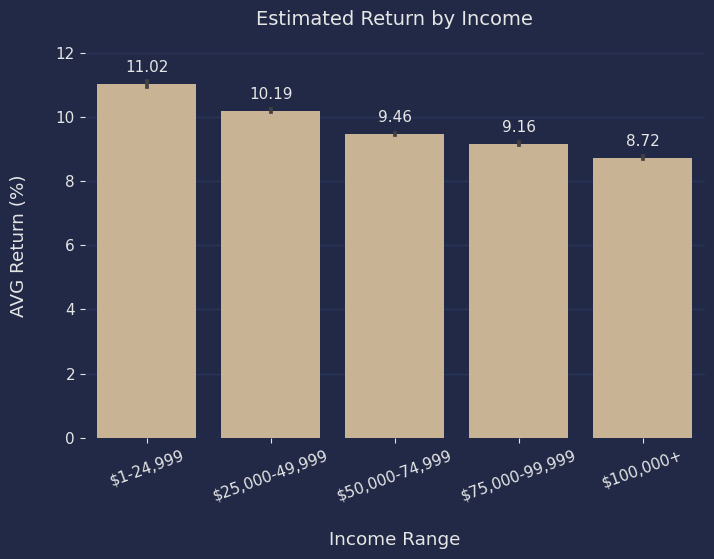

In [152]:
plt.figure(figsize=(8, 5))
sns.barplot(data=r_chart, x='IncomeRange', y='EstimatedReturn', color='tan')
plt.title('Estimated Return by Income')
plt.xticks(rotation=20)
plt.yticks(range(0, 14, 2))
plt.xlabel('Income Range', labelpad=20)
plt.ylabel('AVG Return (%)', labelpad=20)

# Printing values on bars
for i in range(len(MX)):
    total = MX[i]
    plt.text(i, total+.75, total, va='top', ha='center')

In [153]:
list = []
APR = np.array(roots['BorrowerAPR'])
term = np.array(roots['Term']/12)
Amt = np.array(roots['LoanOriginalAmount'])
roots['y'] = APR*term*Amt
roots.y.describe()

count    76216.000
mean      7095.736
std       5543.447
min         49.350
25%       3125.624
50%       5283.300
75%       9733.800
max      36037.750
Name: y, dtype: float64

In [154]:
roots[['BorrowerAPR', 'Term', 'LoanOriginalAmount', 'y']]

,BorrowerAPR,Term,LoanOriginalAmount,y
0,0.120,36,10000,3604.80
1,0.125,36,10000,3758.40
2,0.246,36,15000,11076.30
3,0.154,60,15000,11568.75
4,0.310,36,3000,2792.88
...,...,...,...,...
76211,0.224,36,10000,6706.20
76212,0.132,36,2000,793.20
76213,0.240,60,10000,11992.00
76214,0.284,60,15000,21306.00


In [155]:
roots['ListingCreationDate'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 76216 entries, 0 to 76215
Series name: ListingCreationDate
Non-Null Count  Dtype 
--------------  ----- 
76216 non-null  object
dtypes: object(1)
memory usage: 595.6+ KB


In [156]:
list = []
for date in roots['ListingCreationDate'].values:
    list.append(date[:10])
roots['ds'] = list
roots['ds'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 76216 entries, 0 to 76215
Series name: ds
Non-Null Count  Dtype 
--------------  ----- 
76216 non-null  object
dtypes: object(1)
memory usage: 595.6+ KB


In [157]:
roots['ds']

0        2014-02-27
1        2012-10-22
2        2013-09-14
3        2013-12-14
4        2013-04-12
            ...    
76211    2013-04-14
76212    2011-11-03
76213    2013-12-13
76214    2011-11-14
76215    2014-01-15
Name: ds, Length: 76216, dtype: object

In [158]:
df = roots[['ds', 'y']].loc[roots['ds']>'2013-01-01'].groupby('ds').sum()
df['unique_id'] = 1
df['ds'] = pd.to_datetime(df.index)
df.reset_index(inplace=True, drop=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 433 entries, 0 to 432
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   y          433 non-null    float64       
 1   unique_id  433 non-null    int64         
 2   ds         433 non-null    datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 10.3 KB


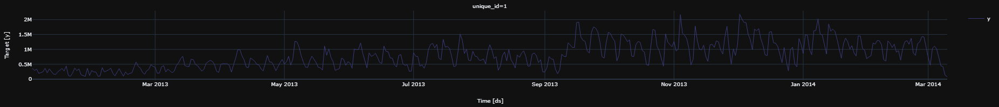

In [159]:
fig = StatsForecast.plot(df, engine="plotly")
fig.update_layout(template='plotly_dark')

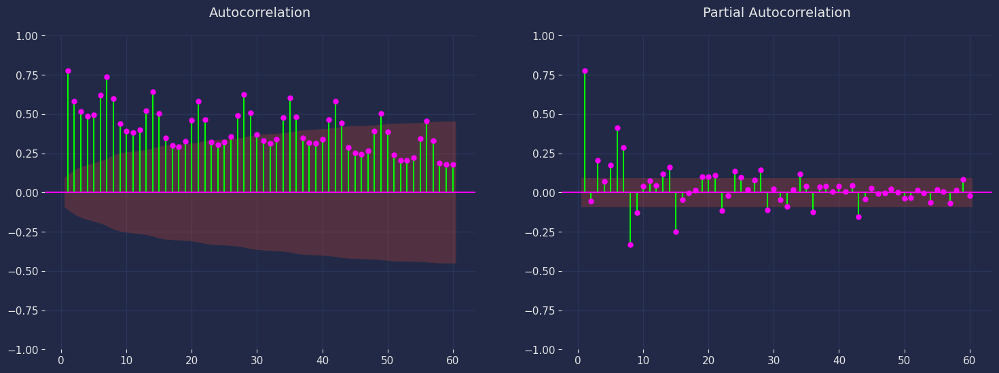

In [160]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))

plot_acf(df["y"],  lags=60, ax=axs[0],color="fuchsia", zero=False)
axs[0].set_title("Autocorrelation");

plot_pacf(df["y"],  lags=60, ax=axs[1],color="fuchsia", zero=False)
axs[1].set_title('Partial Autocorrelation')
plt.show();

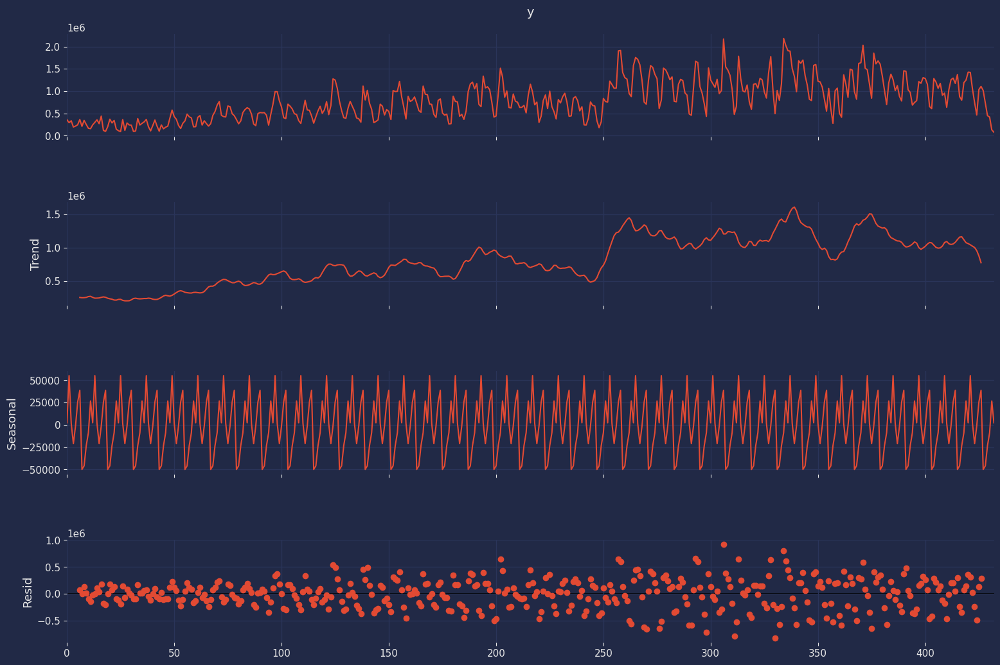

In [161]:
decomp_result = seasonal_decompose(df["y"], model="additive", period=12)
fig = decomp_result.plot()
fig.set_figwidth(18)
fig.set_figheight(12)
plt.show()

In [162]:
train = df.loc[df['ds']<'2013-12-01']
test = df.loc[df['ds']>='2013-12-01']

horizon = len(test)+90
print(len(train))
print(horizon)

333
190


In [163]:
scaledF, SS_FF = SSstandardize(df[['y']])
df['y_unscale'] = df['y']
df['y'] = scaledF
train['y'] = scaledF[:333]
test['y'] = scaledF[333:]

In [164]:
df

,y,unique_id,ds,y_unscale
0,-0.991,1,2013-01-02,359167.569
1,-1.140,1,2013-01-03,292766.009
2,-1.043,1,2013-01-04,335965.187
3,-1.359,1,2013-01-05,195309.842
4,-1.312,1,2013-01-06,216108.405
...,...,...,...,...
428,-0.144,1,2014-03-06,736513.595
429,-0.786,1,2014-03-07,450612.300
430,-0.859,1,2014-03-08,417809.886
431,-1.500,1,2014-03-09,132528.600


In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 433 entries, 0 to 432
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   y          433 non-null    float64       
 1   unique_id  433 non-null    int64         
 2   ds         433 non-null    datetime64[ns]
 3   y_unscale  433 non-null    float64       
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 13.7 KB


In [166]:
check_stationarity(test=df['y'], df='loan sales', col='sales')

DF: loan sales  |  COL: sales
ADF Statistic: -2.454430
p-value: 0.126959
Critical Values:
	1%: -3.446
	5%: -2.868
	10%: -2.570
Non-stationary 



In [167]:
season_length = 7
dfAR = [AutoARIMA(season_length=season_length, alias='Arima', biasadj=True)] #Box-Cox transform with biasadj=True
dfAT = [AutoTheta(season_length=season_length, decomposition_type="additive", model="OTM", alias='Theta')]
dfETS = [AutoETS(model=["Z","Z","Z"], season_length=season_length, alias='ETS')] #Z identifies the optimal parameter
sfAR = StatsForecast(df=train,
                   models=dfAR,
                   freq='D', 
                   n_jobs=-1)
sfAT = StatsForecast(df=train,
                   models=dfAT,
                   freq='D', 
                   n_jobs=-1)
sfETS = StatsForecast(df=train,
                   models=dfETS,
                   freq='D', 
                   n_jobs=-1)
sfAR.fit()
sfAT.fit()
sfETS.fit()

StatsForecast(models=[ETS])

In [168]:
print(arima_string(sfAR.fitted_[0,0].model_))
resultAR=sfAR.fitted_[0,0].model_
print(resultAR.keys())
resultAR

ARIMA(1,0,0)(0,1,1)[7]                   
dict_keys(['coef', 'sigma2', 'var_coef', 'mask', 'loglik', 'aic', 'arma', 'residuals', 'code', 'n_cond', 'nobs', 'model', 'bic', 'aicc', 'ic', 'xreg', 'x', 'lambda'])


{'coef': {'ar1': 0.6119178846974851, 'sma1': -0.8014867253759594},
 'sigma2': 0.16135557366030473,
 'var_coef': array([[0.0011989 , 0.        ],
        [0.        , 0.00306748]]),
 'mask': array([ True,  True]),
 'loglik': -168.04271911945966,
 'aic': 342.0854382389193,
 'arma': (1, 0, 0, 1, 7, 0, 1),
 'residuals': array([-9.90900826e-04, -1.14000204e-03, -1.04299850e-03, -1.35883547e-03,
        -1.31213239e-03, -1.24439925e-03, -9.79318577e-04, -2.09769420e-01,
         2.45116270e-01, -2.06340588e-01,  2.68718101e-02, -8.95735613e-02,
         2.53954897e-02, -1.66656451e-01,  2.46593393e-01, -1.88227308e-01,
         3.52192669e-01, -3.08011748e-01, -1.12393095e-01,  1.15844659e-02,
         1.13969486e-01, -7.77293051e-02,  1.15410394e-01, -4.79787613e-01,
         1.59824201e-01, -7.88719102e-02,  3.54443917e-01, -6.66004537e-01,
         2.64398843e-01, -1.33586376e-01, -1.80205613e-02, -4.27492955e-02,
        -3.86454403e-03,  2.87846015e-01, -2.50996675e-01,  1.71382879e-02,

In [169]:
resultAT=sfAT.fitted_[0,0].model_
print(resultAT.keys())
resultAT

dict_keys(['mse', 'amse', 'fit', 'residuals', 'm', 'states', 'par', 'n', 'modeltype', 'mean_y', 'decompose', 'decomposition_type', 'seas_forecast', 'fitted'])


{'mse': 82.05698876763867,
 'amse': array([0.1754735 , 0.2558364 , 0.29788724]),
 'fit': results(x=array([2.54036068, 0.59421164, 1.97778541]), fn=81.97896267023256, nit=52, simplex=array([[2.54036068, 0.59421164, 1.97778541],
        [2.62730414, 0.5922627 , 1.96678862],
        [2.4894186 , 0.59161304, 1.99734845],
        [2.48435602, 0.59182432, 1.94486408]])),
 'residuals': array([ 2.99262743e-01,  1.32950313e-01,  2.19250284e-01, -2.49893480e-01,
        -3.98167260e-01, -4.50756766e-01,  2.90775086e-01,  3.47059515e-02,
         4.75019889e-01,  5.80110301e-02, -1.94166051e-01, -4.40839579e-01,
        -3.44628986e-01,  1.94956192e-01,  4.69272077e-01,  1.59098843e-01,
         5.14825616e-01, -5.36124116e-01, -6.11793440e-01, -3.69094345e-01,
         4.38987419e-01,  2.50711794e-01,  3.88859246e-01, -2.16548285e-01,
        -1.84658164e-01, -4.66366630e-01,  6.25411604e-02, -3.11683950e-01,
         5.09942098e-01,  2.69122683e-01,  1.65926787e-01, -2.73751684e-01,
        -4.

In [170]:
resultETS=sfETS.fitted_[0,0].model_
print(resultETS.keys())
resultETS

dict_keys(['loglik', 'aic', 'bic', 'aicc', 'mse', 'amse', 'fit', 'residuals', 'components', 'm', 'nstate', 'fitted', 'states', 'par', 'sigma2', 'n_params', 'method', 'actual_residuals'])


{'loglik': -661.2316279179498,
 'aic': 1342.4632558358996,
 'bic': 1380.544680735704,
 'aicc': 1343.1464856495643,
 'mse': 0.1593294255423946,
 'amse': 0.21775894167138032,
 'fit': results(x=array([ 0.56852377,  0.1178366 , -1.09625591,  0.20004621,  0.17465137,
        -0.18282662, -0.27103585, -0.01903869,  0.00606012]), fn=1322.4632558358996, nit=641, simplex=array([[ 0.56798972,  0.11812683, -1.09889503,  0.20106245,  0.17419783,
         -0.18214435, -0.26927869, -0.01943384,  0.00560507],
        [ 0.56778497,  0.1181638 , -1.09738448,  0.19988558,  0.17291764,
         -0.18465053, -0.26856972, -0.01925024,  0.00752705],
        [ 0.56852377,  0.1178366 , -1.09625591,  0.20004621,  0.17465137,
         -0.18282662, -0.27103585, -0.01903869,  0.00606012],
        [ 0.56745878,  0.11812219, -1.09341782,  0.2014865 ,  0.17426161,
         -0.18317475, -0.2715061 , -0.01910544,  0.00603883],
        [ 0.56736372,  0.11769299, -1.09601198,  0.20195317,  0.17312346,
         -0.184266

In [171]:
residualAR = pd.DataFrame(resultAR.get("residuals"), columns=["residual Model"])
residualAR

,residual Model
0,-9.909e-04
1,-1.140e-03
2,-1.043e-03
3,-1.359e-03
4,-1.312e-03
...,...
328,1.025e+00
329,-1.008e+00
330,-1.240e+00
331,6.941e-01


In [172]:
residualAT = pd.DataFrame(resultAT.get("residuals"), columns=["residual Model"])
residualAT

,residual Model
0,0.299
1,0.133
2,0.219
3,-0.250
4,-0.398
...,...
328,1.256
329,-0.880
330,-1.421
331,0.663


In [173]:
residualETS = pd.DataFrame(resultETS.get("residuals"), columns=["residual Model"])
residualETS

,residual Model
0,0.013
1,-0.057
2,0.097
3,-0.022
4,-0.051
...,...
328,0.857
329,-1.061
330,-1.505
331,0.695


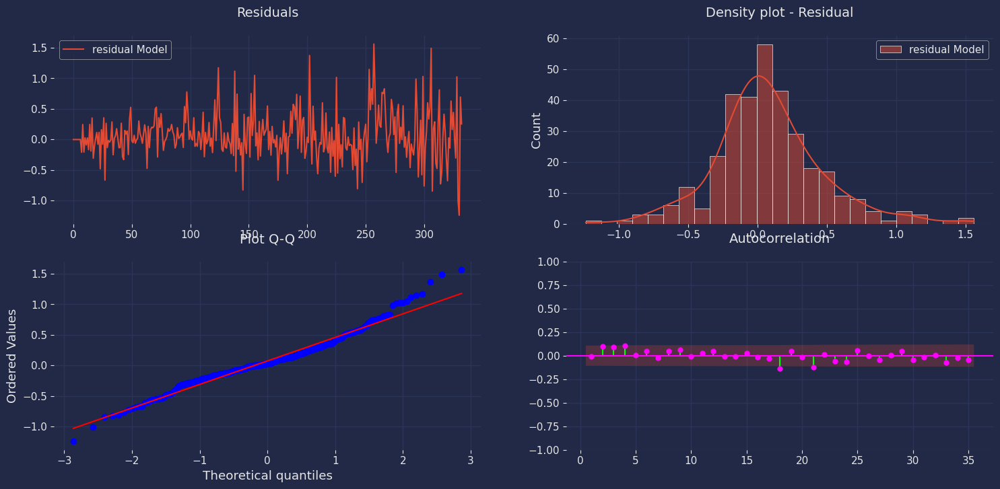

In [174]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,8))

residualAR.plot(ax=axs[0,0])
axs[0,0].set_title("Residuals");

sns.histplot(residualAR, ax=axs[0,1], kde=True);
axs[0,1].set_title("Density plot - Residual");

stats.probplot(residualAR["residual Model"], dist="norm", plot=axs[1,0])
axs[1,0].set_title('Plot Q-Q')

plot_acf(residualAR, lags=35, ax=axs[1,1],color="fuchsia", zero=False)
axs[1,1].set_title("Autocorrelation");

plt.show()

C:\Users\tekre\AppData\Local\Temp\ipykernel_39580\2252842875.py:356: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




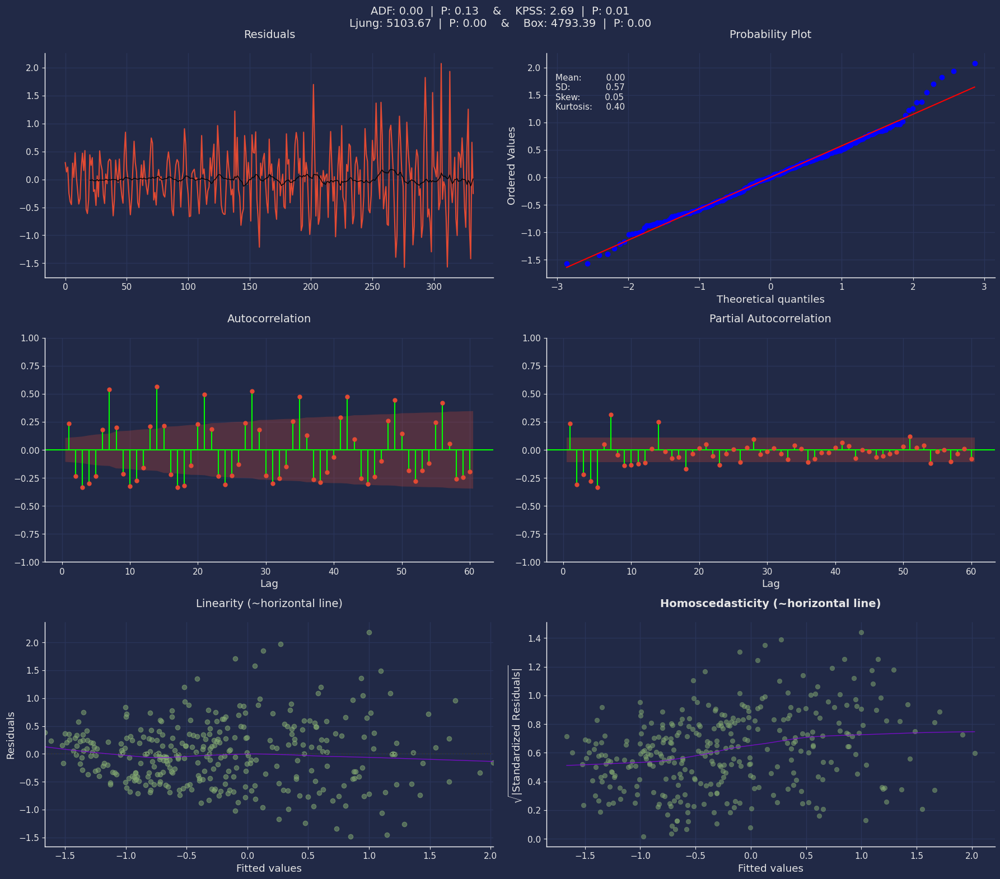

In [175]:
preds = resultAT['fitted']
diagnostic_plots(df['y'], preds, residualAT['residual Model'])

C:\Users\tekre\AppData\Local\Temp\ipykernel_39580\2252842875.py:356: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




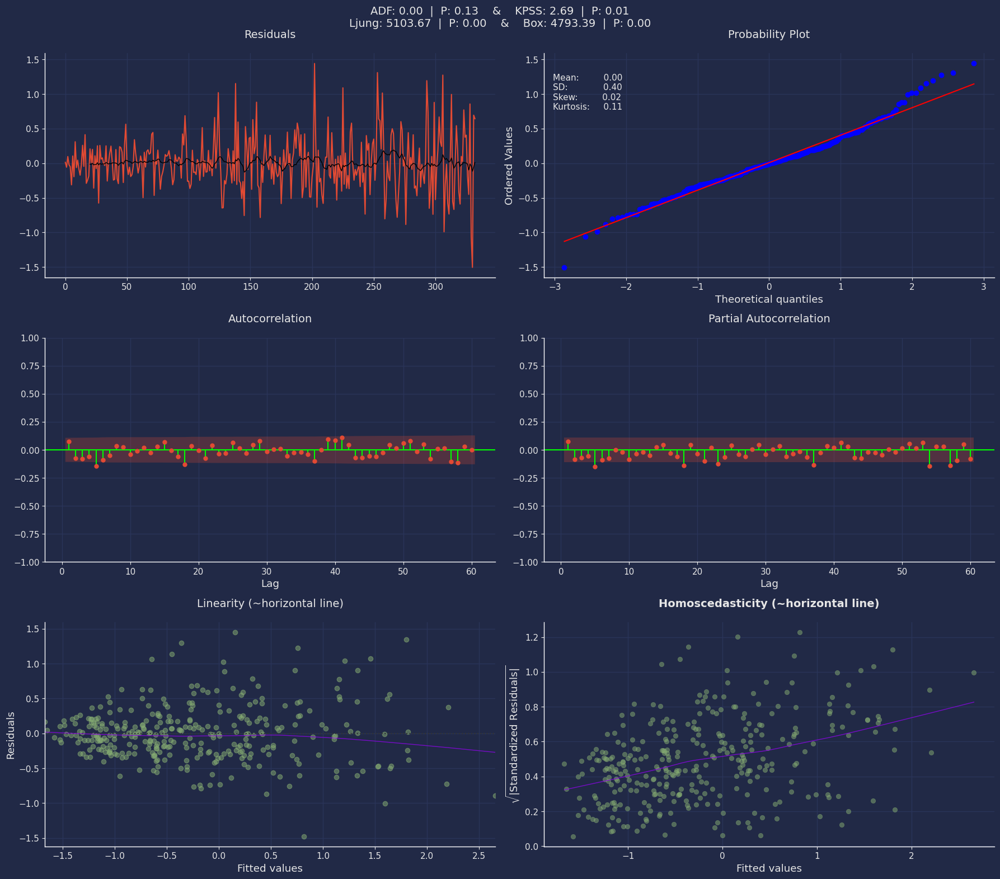

In [176]:
preds = resultETS['fitted']
diagnostic_plots(df['y'], preds, residualETS['residual Model'])

In [177]:
Y_hatAR = sfAR.forecast(horizon, fitted=True, level=[80, 95])
Y_hatAR.reset_index(inplace=True)
Y_hatAR.tail()

,unique_id,ds,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95
185,1,2014-06-04,0.859,-0.584,-0.085,1.803,2.302
186,1,2014-06-05,0.504,-0.940,-0.440,1.448,1.947
187,1,2014-06-06,0.657,-0.787,-0.287,1.601,2.100
188,1,2014-06-07,-0.113,-1.556,-1.056,0.831,1.331
189,1,2014-06-08,-0.221,-1.674,-1.171,0.728,1.231


In [178]:
Y_hatAR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   unique_id    190 non-null    int64         
 1   ds           190 non-null    datetime64[ns]
 2   Arima        190 non-null    float32       
 3   Arima-lo-95  190 non-null    float32       
 4   Arima-lo-80  190 non-null    float32       
 5   Arima-hi-80  190 non-null    float32       
 6   Arima-hi-95  190 non-null    float32       
dtypes: datetime64[ns](1), float32(5), int64(1)
memory usage: 6.8 KB


In [179]:
Y_hatAT = sfAT.forecast(horizon, fitted=True, level=[80, 95])
Y_hatAT.reset_index(inplace=True)
Y_hatAT.tail()
Y_hatAT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   unique_id    190 non-null    int64         
 1   ds           190 non-null    datetime64[ns]
 2   Theta        190 non-null    float32       
 3   Theta-lo-80  190 non-null    float32       
 4   Theta-hi-80  190 non-null    float32       
 5   Theta-lo-95  190 non-null    float32       
 6   Theta-hi-95  190 non-null    float32       
dtypes: datetime64[ns](1), float32(5), int64(1)
memory usage: 6.8 KB


In [180]:
Y_hatETS = sfETS.forecast(horizon, fitted=True, level=[80, 95, 50, 60, 40])
Y_hatETS.reset_index(inplace=True)
Y_hatETS.tail()
Y_hatETS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   unique_id  190 non-null    int64         
 1   ds         190 non-null    datetime64[ns]
 2   ETS        190 non-null    float32       
 3   ETS-lo-95  190 non-null    float32       
 4   ETS-lo-80  190 non-null    float32       
 5   ETS-lo-60  190 non-null    float32       
 6   ETS-lo-50  190 non-null    float32       
 7   ETS-lo-40  190 non-null    float32       
 8   ETS-hi-40  190 non-null    float32       
 9   ETS-hi-50  190 non-null    float32       
 10  ETS-hi-60  190 non-null    float32       
 11  ETS-hi-80  190 non-null    float32       
 12  ETS-hi-95  190 non-null    float32       
dtypes: datetime64[ns](1), float32(11), int64(1)
memory usage: 11.3 KB


In [181]:
valuesAR=sfAR.forecast_fitted_values()
valuesAR.tail()

,ds,y,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95
unique_id,,,,,,,
1,2013-11-26,2.189,1.164,0.377,0.650,1.679,1.952
1,2013-11-27,0.537,1.545,0.757,1.030,2.059,2.332
1,2013-11-28,-0.687,0.553,-0.235,0.038,1.067,1.340
1,2013-11-29,0.484,-0.210,-0.997,-0.725,0.305,0.577
1,2013-11-30,-0.014,-0.269,-1.056,-0.783,0.246,0.519


In [182]:
valuesAT=sfAT.forecast_fitted_values()
valuesAT.tail()

,ds,y,Theta,Theta-lo-95,Theta-lo-80,Theta-hi-80,Theta-hi-95
unique_id,,,,,,,
1,2013-11-26,2.189,0.934,-0.194,0.196,1.671,2.061
1,2013-11-27,0.537,1.417,0.289,0.680,2.154,2.545
1,2013-11-28,-0.687,0.733,-0.394,-0.004,1.471,1.861
1,2013-11-29,0.484,-0.179,-1.307,-0.916,0.558,0.949
1,2013-11-30,-0.014,0.238,-0.890,-0.499,0.975,1.366


In [183]:
valuesETS=sfETS.forecast_fitted_values()
valuesETS.tail()

,ds,y,ETS,ETS-lo-95,ETS-lo-80,ETS-lo-60,ETS-lo-50,ETS-lo-40,ETS-hi-40,ETS-hi-50,ETS-hi-60,ETS-hi-80,ETS-hi-95
unique_id,,,,,,,,,,,,,
1,2013-11-26,2.189,1.333,0.538,0.813,0.991,1.059,1.120,1.545,1.606,1.674,1.852,2.127
1,2013-11-27,0.537,1.598,0.804,1.079,1.257,1.325,1.386,1.811,1.872,1.939,2.118,2.393
1,2013-11-28,-0.687,0.818,0.023,0.298,0.477,0.544,0.605,1.030,1.091,1.159,1.337,1.612
1,2013-11-29,0.484,-0.211,-1.005,-0.730,-0.552,-0.484,-0.423,0.002,0.063,0.130,0.309,0.584
1,2013-11-30,-0.014,-0.658,-1.453,-1.178,-1.000,-0.932,-0.871,-0.446,-0.385,-0.317,-0.139,0.136


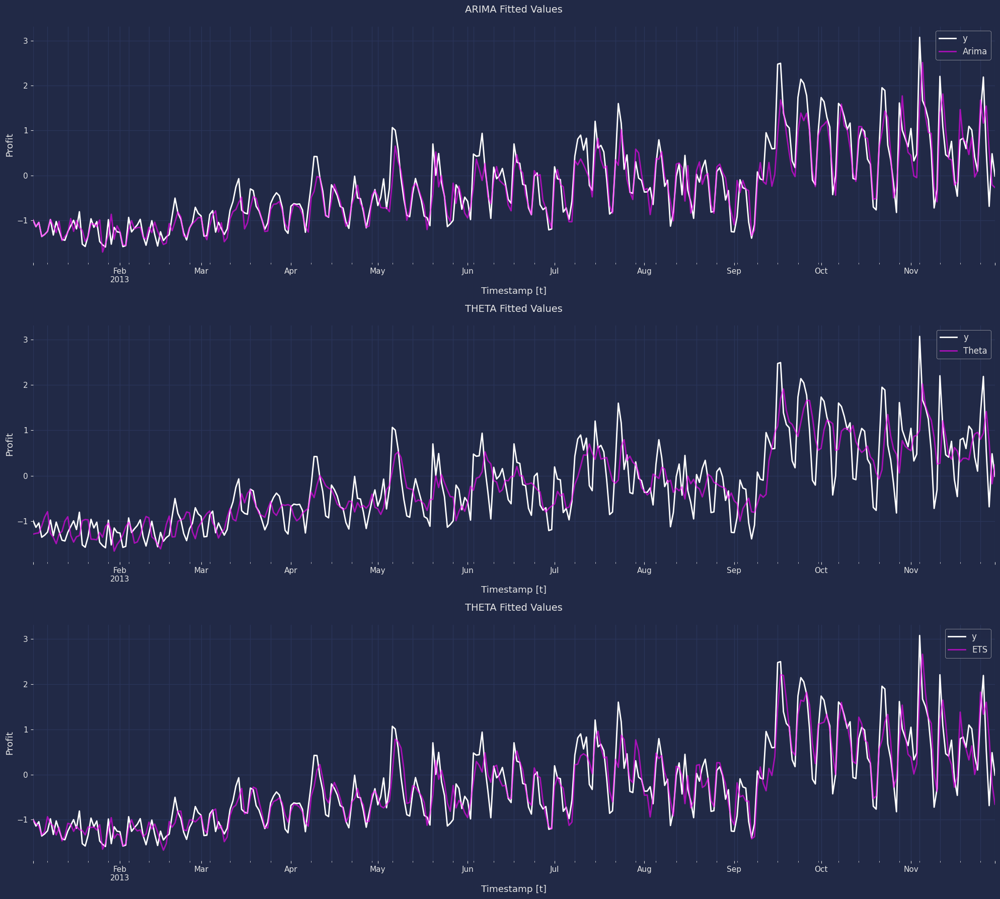

In [184]:
# SEABORN CAN'T USED DATETIME AS INDEX .plot() is applied instead
fig, axs = plt.subplots(3, 1, figsize=(20, 18))
fitted_dfAR = valuesAR[['y', 'Arima']].copy(deep=True)
fitted_dfAR.index = valuesAR['ds']
fitted_dfAR['y'].plot(ax=axs[0], linewidth=2, color='white')
fitted_dfAR["Arima"].plot(ax=axs[0], linewidth=2, color='Fuchsia', alpha=.6)
axs[0].set_title('ARIMA Fitted Values')
axs[0].set_ylabel('Profit')
axs[0].set_xlabel('Timestamp [t]')
axs[0].legend(prop={'size': 12})

fitted_dfAT = valuesAT[['y', 'Theta']].copy(deep=True)
fitted_dfAT.index = valuesAT['ds']
fitted_dfAT['y'].plot(ax=axs[1], linewidth=2, color='white')
fitted_dfAT["Theta"].plot(ax=axs[1], linewidth=2, color='Fuchsia', alpha=.6)
axs[1].set_title('THETA Fitted Values')
axs[1].set_ylabel('Profit')
axs[1].set_xlabel('Timestamp [t]')
axs[1].legend(prop={'size': 12})

fitted_dfETS = valuesETS[['y', 'ETS']].copy(deep=True)
fitted_dfETS.index = valuesETS['ds']
fitted_dfETS['y'].plot(ax=axs[2], linewidth=2, color='white')
fitted_dfETS["ETS"].plot(ax=axs[2], linewidth=2, color='Fuchsia', alpha=.6)
axs[2].set_title('THETA Fitted Values')
axs[2].set_ylabel('Profit')
axs[2].set_xlabel('Timestamp [t]')
axs[2].legend(prop={'size': 12})
plt.tight_layout()
plt.show()

In [185]:
df['ds'].tail()

428   2014-03-06
429   2014-03-07
430   2014-03-08
431   2014-03-09
432   2014-03-10
Name: ds, dtype: datetime64[ns]

In [186]:
df['ds'].head()

0   2013-01-02
1   2013-01-03
2   2013-01-04
3   2013-01-05
4   2013-01-06
Name: ds, dtype: datetime64[ns]

In [187]:
Y_hatAR.head(2)

,unique_id,ds,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95
0,1,2013-12-01,-0.161,-0.949,-0.676,0.353,0.626
1,1,2013-12-02,1.455,0.532,0.852,2.059,2.378


In [188]:
test.head(2)

,y,unique_id,ds
333,0.821,1,2013-12-01
334,3.103,1,2013-12-02


In [189]:
df.iloc[333:, 0]

333    0.821
334    3.103
335    2.752
336    2.485
337    2.461
       ...  
428   -0.144
429   -0.786
430   -0.859
431   -1.500
432   -1.620
Name: y, Length: 100, dtype: float64

In [190]:
Y_hatETS.iloc[:100]

,unique_id,ds,ETS,ETS-lo-95,ETS-lo-80,ETS-lo-60,ETS-lo-50,ETS-lo-40,ETS-hi-40,ETS-hi-50,ETS-hi-60,ETS-hi-80,ETS-hi-95
0,1,2013-12-01,-0.307,-2.085,-1.470,-1.071,-0.919,-0.783,0.168,0.304,0.456,0.855,1.470
1,1,2013-12-02,1.303,-0.531,0.104,0.515,0.672,0.812,1.794,1.934,2.091,2.502,3.137
2,1,2013-12-03,1.223,-0.666,-0.012,0.412,0.573,0.718,1.729,1.873,2.034,2.458,3.112
3,1,2013-12-04,0.776,-1.167,-0.495,-0.059,0.107,0.256,1.295,1.444,1.610,2.046,2.718
4,1,2013-12-05,0.546,-1.448,-0.758,-0.310,-0.140,0.013,1.080,1.233,1.403,1.850,2.541
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,2014-03-06,0.546,-4.207,-2.562,-1.495,-1.090,-0.726,1.818,2.182,2.587,3.654,5.300
96,1,2014-03-07,0.633,-4.142,-2.490,-1.418,-1.011,-0.645,1.910,2.276,2.683,3.755,5.408
97,1,2014-03-08,-0.216,-5.013,-3.352,-2.276,-1.867,-1.500,1.067,1.434,1.843,2.920,4.580
98,1,2014-03-09,-0.307,-5.125,-3.458,-2.376,-1.965,-1.596,0.982,1.350,1.761,2.843,4.510


In [191]:
# creating tables to forecast rest of 2014 year
overcastAR = Y_hatAR[Y_hatAR['ds']>'2014-03-10']

overcastAT = Y_hatAT[Y_hatAT['ds']>'2014-03-10']

overcastETS = Y_hatETS[Y_hatETS['ds']>'2014-03-10']


In [192]:
df.query('ds == "2013-12-01"')

,y,unique_id,ds,y_unscale
333,0.821,1,2013-12-01,1.166e+06


In [193]:
df.iloc[333:]

,y,unique_id,ds,y_unscale
333,0.821,1,2013-12-01,1.166e+06
334,3.103,1,2013-12-02,2.182e+06
335,2.752,1,2013-12-03,2.026e+06
336,2.485,1,2013-12-04,1.907e+06
337,2.461,1,2013-12-05,1.897e+06
...,...,...,...,...
428,-0.144,1,2014-03-06,7.365e+05
429,-0.786,1,2014-03-07,4.506e+05
430,-0.859,1,2014-03-08,4.178e+05
431,-1.500,1,2014-03-09,1.325e+05


In [194]:
# DATETIME MUST BE COLUMN OBJECT TYPE TO USE SEABORN AND STATSFORECAST .plot()
# datetime as index will only allow df.plot() through matplotlib
# STATIC assingment is more reliable than dynamic with concat or merge regarding datetimes
Y_hatAR['ds'] = Y_hatAR['ds'].astype(object)
forecastAR = Y_hatAR.iloc[:100]
forecastAR['y'] = df.iloc[333:, 0].values
# forecastAR = pd.concat([df, forecastAR.iloc[:, 2:7]], axis=1) this wouldn't stop bugging with NANs and has to be manually entered in excel.

Y_hatAT['ds'] = Y_hatAT['ds'].astype(object)
forecastAT = Y_hatAT.iloc[:100]
forecastAT['y'] = df.iloc[333:, 0].values
# forecastAT = pd.concat([df, forecastAT.iloc[:, 2:7]], axis=1) this wouldn't stop bugging with NANs and has to be manually entered in excel.

Y_hatETS['ds'] = Y_hatETS['ds'].astype(object)
forecastETS = Y_hatETS.iloc[:100]
forecastETS['y'] = df.iloc[333:, 0].values
# forecastETS = pd.concat([forecastETS.iloc[:, 2:7], df], axis=1) this wouldn't stop bugging with NANs and has to be manually entered in excel.
forecastETS

,unique_id,ds,ETS,ETS-lo-95,ETS-lo-80,ETS-lo-60,ETS-lo-50,ETS-lo-40,ETS-hi-40,ETS-hi-50,ETS-hi-60,ETS-hi-80,ETS-hi-95,y
0,1,2013-12-01 00:00:00,-0.307,-2.085,-1.470,-1.071,-0.919,-0.783,0.168,0.304,0.456,0.855,1.470,0.821
1,1,2013-12-02 00:00:00,1.303,-0.531,0.104,0.515,0.672,0.812,1.794,1.934,2.091,2.502,3.137,3.103
2,1,2013-12-03 00:00:00,1.223,-0.666,-0.012,0.412,0.573,0.718,1.729,1.873,2.034,2.458,3.112,2.752
3,1,2013-12-04 00:00:00,0.776,-1.167,-0.495,-0.059,0.107,0.256,1.295,1.444,1.610,2.046,2.718,2.485
4,1,2013-12-05 00:00:00,0.546,-1.448,-0.758,-0.310,-0.140,0.013,1.080,1.233,1.403,1.850,2.541,2.461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,2014-03-06 00:00:00,0.546,-4.207,-2.562,-1.495,-1.090,-0.726,1.818,2.182,2.587,3.654,5.300,-0.144
96,1,2014-03-07 00:00:00,0.633,-4.142,-2.490,-1.418,-1.011,-0.645,1.910,2.276,2.683,3.755,5.408,-0.786
97,1,2014-03-08 00:00:00,-0.216,-5.013,-3.352,-2.276,-1.867,-1.500,1.067,1.434,1.843,2.920,4.580,-0.859
98,1,2014-03-09 00:00:00,-0.307,-5.125,-3.458,-2.376,-1.965,-1.596,0.982,1.350,1.761,2.843,4.510,-1.500


In [195]:
forecastETS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   unique_id  100 non-null    int64  
 1   ds         100 non-null    object 
 2   ETS        100 non-null    float32
 3   ETS-lo-95  100 non-null    float32
 4   ETS-lo-80  100 non-null    float32
 5   ETS-lo-60  100 non-null    float32
 6   ETS-lo-50  100 non-null    float32
 7   ETS-lo-40  100 non-null    float32
 8   ETS-hi-40  100 non-null    float32
 9   ETS-hi-50  100 non-null    float32
 10  ETS-hi-60  100 non-null    float32
 11  ETS-hi-80  100 non-null    float32
 12  ETS-hi-95  100 non-null    float32
 13  y          100 non-null    float64
dtypes: float32(11), float64(1), int64(1), object(1)
memory usage: 6.8+ KB


In [196]:
overcastETS

,unique_id,ds,ETS,ETS-lo-95,ETS-lo-80,ETS-lo-60,ETS-lo-50,ETS-lo-40,ETS-hi-40,ETS-hi-50,ETS-hi-60,ETS-hi-80,ETS-hi-95
100,1,2014-03-11,1.223,-3.637,-1.955,-0.864,-0.449,-0.077,2.523,2.896,3.310,4.401,6.083
101,1,2014-03-12,0.776,-4.105,-2.416,-1.320,-0.904,-0.530,2.081,2.455,2.871,3.967,5.656
102,1,2014-03-13,0.546,-4.356,-2.659,-1.559,-1.141,-0.765,1.858,2.233,2.651,3.751,5.448
103,1,2014-03-14,0.633,-4.290,-2.586,-1.481,-1.062,-0.685,1.950,2.327,2.746,3.851,5.555
104,1,2014-03-15,-0.216,-5.160,-3.449,-2.339,-1.917,-1.539,1.106,1.485,1.906,3.016,4.727
...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,1,2014-06-04,0.776,-5.628,-3.412,-1.974,-1.428,-0.938,2.489,2.979,3.525,4.963,7.179
186,1,2014-06-05,0.546,-5.874,-3.651,-2.210,-1.663,-1.171,2.264,2.755,3.303,4.744,6.966
187,1,2014-06-06,0.633,-5.803,-3.576,-2.131,-1.582,-1.089,2.354,2.847,3.396,4.841,7.068
188,1,2014-06-07,-0.216,-6.668,-4.435,-2.987,-2.436,-1.942,1.510,2.004,2.554,4.002,6.235


In [197]:
overcastETS.info()

<class 'pandas.core.frame.DataFrame'>
Index: 90 entries, 100 to 189
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   unique_id  90 non-null     int64         
 1   ds         90 non-null     datetime64[ns]
 2   ETS        90 non-null     float32       
 3   ETS-lo-95  90 non-null     float32       
 4   ETS-lo-80  90 non-null     float32       
 5   ETS-lo-60  90 non-null     float32       
 6   ETS-lo-50  90 non-null     float32       
 7   ETS-lo-40  90 non-null     float32       
 8   ETS-hi-40  90 non-null     float32       
 9   ETS-hi-50  90 non-null     float32       
 10  ETS-hi-60  90 non-null     float32       
 11  ETS-hi-80  90 non-null     float32       
 12  ETS-hi-95  90 non-null     float32       
dtypes: datetime64[ns](1), float32(11), int64(1)
memory usage: 6.0 KB


In [198]:
forecastAR2 = SS_FF.inverse_transform(forecastAR.iloc[:, 2:])
forecastAT2 = SS_FF.inverse_transform(forecastAT.iloc[:, 2:])
forecastETS2 = SS_FF.inverse_transform(forecastETS.iloc[:, 2:])

for c, col in enumerate(forecastAR.iloc[:, 2:]):
    forecastAR[col] = forecastAR2[:, c]
for c, col in enumerate(forecastAT.iloc[:, 2:]):
    forecastAT[col] = forecastAT2[:, c]
for c, col in enumerate(forecastETS.iloc[:, 2:]):
    forecastETS[col] = forecastETS2[:, c]

In [199]:
overcastAR2 = SS_FF.inverse_transform(overcastAR.iloc[:, 2:])
overcastAT2 = SS_FF.inverse_transform(overcastAT.iloc[:, 2:])
overcastETS2 = SS_FF.inverse_transform(overcastETS.iloc[:, 2:])

for c, col in enumerate(overcastAR.iloc[:, 2:]):
    overcastAR[col] = overcastAR2[:, c]
for c, col in enumerate(overcastAT.iloc[:, 2:]):
    overcastAT[col] = overcastAT2[:, c]
for c, col in enumerate(overcastETS.iloc[:, 2:]):
    overcastETS[col] = overcastETS2[:, c]

df2 = df.iloc[:, 1:]
df2.rename({'y_unscale':'y'}, axis=1, inplace=True)

In [200]:
df2.head(4)

,unique_id,ds,y
0,1,2013-01-02,359167.569
1,1,2013-01-03,292766.009
2,1,2013-01-04,335965.187
3,1,2013-01-05,195309.842


In [201]:
overcastAR.head(4)

,unique_id,ds,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95
100,1,2014-03-11,1.422e+06,862102.625,1.056e+06,1.788e+06,1.982e+06
101,1,2014-03-12,1.183e+06,622668.875,8.166e+05,1.549e+06,1.743e+06
102,1,2014-03-13,1.025e+06,464308.594,6.583e+05,1.391e+06,1.585e+06
103,1,2014-03-14,1.093e+06,532424.125,7.264e+05,1.459e+06,1.653e+06


In [202]:
forecastAR.head(4)

,unique_id,ds,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95,y
0,1,2013-12-01 00:00:00,7.286e+05,3.780e+05,4.994e+05,9.579e+05,1.079e+06,1.166e+06
1,1,2013-12-02 00:00:00,1.449e+06,1.037e+06,1.180e+06,1.717e+06,1.860e+06,2.182e+06
2,1,2013-12-03 00:00:00,1.432e+06,1.001e+06,1.150e+06,1.714e+06,1.864e+06,2.026e+06
3,1,2013-12-04 00:00:00,1.189e+06,7.503e+05,9.022e+05,1.476e+06,1.628e+06,1.907e+06


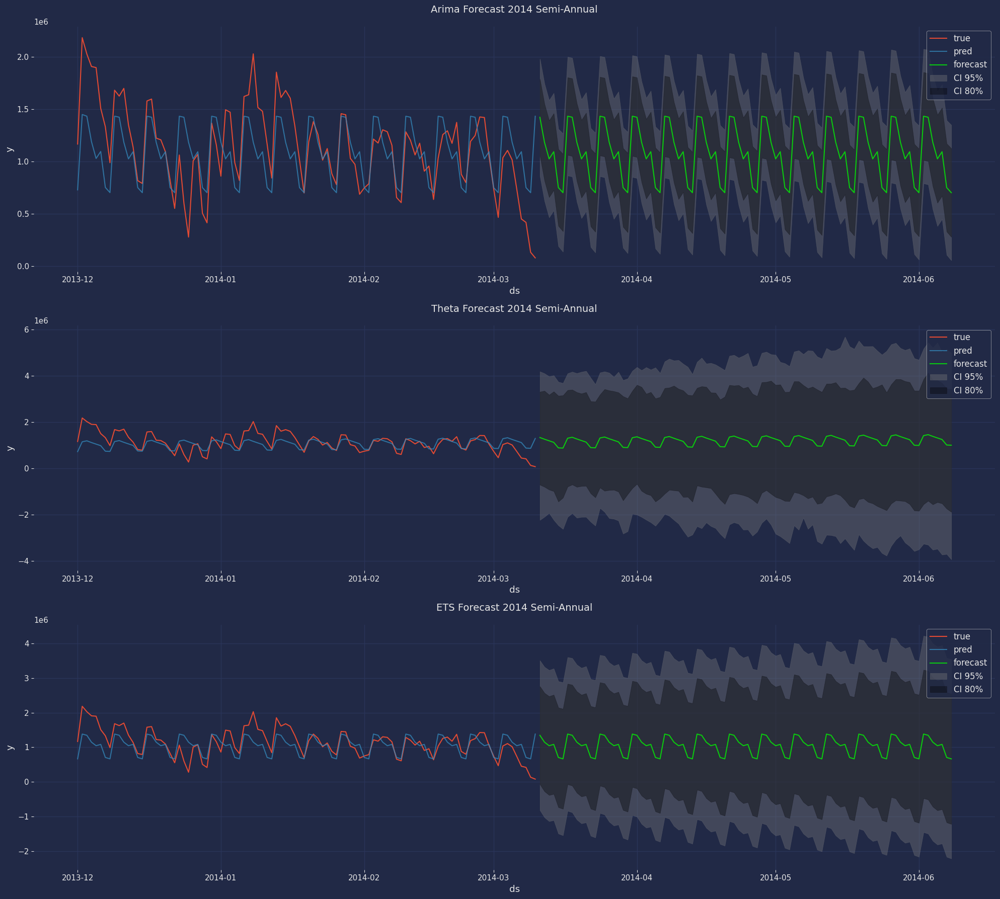

In [203]:
fig, axs = plt.subplots(3, 1, figsize=(20, 18))
sns.lineplot(forecastAR, x='ds', y='y', label='true', ax=axs[0])
sns.lineplot(forecastAR, x='ds', y='Arima', label='pred', alpha=0.75, ax=axs[0])
sns.lineplot(overcastAR, x='ds', y='Arima', label='forecast', alpha=0.75, color='lime', ax=axs[0])
axs[0].fill_between(overcastAR['ds'], 
                overcastAR['Arima-lo-95'], 
                overcastAR['Arima-hi-95'],
                alpha=.35,
                color='gray',
                label='CI 95%')
axs[0].fill_between(overcastAR['ds'], 
                overcastAR['Arima-lo-80'], 
                overcastAR['Arima-hi-80'],
                alpha=.35,
                color='black',
                label='CI 80%')
axs[0].legend(prop={'size': 12})
axs[0].set_title('Arima Forecast 2014 Semi-Annual')

sns.lineplot(forecastAT, x='ds', y='y', label='true', ax=axs[1])
sns.lineplot(forecastAT, x='ds', y='Theta', label='pred', alpha=0.75, ax=axs[1])
sns.lineplot(overcastAT, x='ds', y='Theta', label='forecast', alpha=0.75, color='lime', ax=axs[1])
axs[1].fill_between(overcastAT['ds'], 
                overcastAT['Theta-lo-95'], 
                overcastAT['Theta-hi-95'],
                alpha=.35,
                color='gray',
                label='CI 95%')
axs[1].fill_between(overcastAT['ds'], 
                overcastAT['Theta-lo-80'], 
                overcastAT['Theta-hi-80'],
                alpha=.35,
                color='black',
                label='CI 80%')
axs[1].legend(prop={'size': 12})
axs[1].set_title('Theta Forecast 2014 Semi-Annual')

sns.lineplot(forecastETS, x='ds', y='y', label='true', ax=axs[2])
sns.lineplot(forecastETS, x='ds', y='ETS', label='pred', alpha=0.75, ax=axs[2])
sns.lineplot(overcastETS, x='ds', y='ETS', label='forecast', alpha=0.75, color='lime', ax=axs[2])
axs[2].fill_between(overcastETS['ds'], 
                overcastETS['ETS-lo-95'], 
                overcastETS['ETS-hi-95'],
                alpha=.35,
                color='gray',
                label='CI 95%')
axs[2].fill_between(overcastETS['ds'], 
                overcastETS['ETS-lo-80'], 
                overcastETS['ETS-hi-80'],
                alpha=.35,
                color='black',
                label='CI 80%')
axs[2].legend(prop={'size': 12})
axs[2].set_title('ETS Forecast 2014 Semi-Annual')
plt.tight_layout()
plt.show()

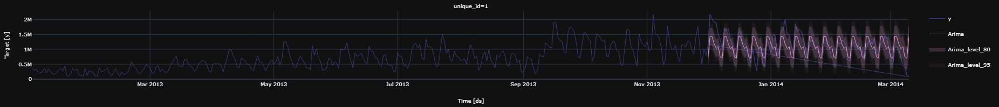

In [204]:
fig = sfAR.plot(df2, forecastAR, level=[80, 95], engine='plotly')
fig.update_layout(template='plotly_dark')

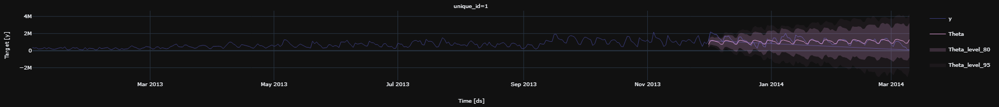

In [205]:
fig = sfAT.plot(df2, forecastAT, level=[80, 95], engine='plotly')
fig.update_layout(template='plotly_dark')

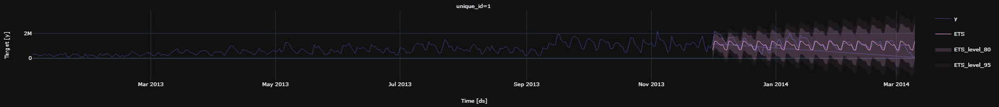

In [206]:
fig = sfETS.plot(df2, forecastETS, level=[80, 95], engine='plotly')
fig.update_layout(template='plotly_dark')

In [207]:
size, frame = step_sequence(train, .10)
cvAR = sfAR.cross_validation(df=train,
                                    h=3,
                                    step_size=size,
                                    n_windows=frame)
cvAR.head()

,ds,cutoff,y,Arima
unique_id,,,,
1,2013-01-26,2013-01-25,-1.543,-1.280
1,2013-01-27,2013-01-25,-1.591,-1.511
1,2013-01-28,2013-01-25,-0.983,-1.257
1,2013-03-01,2013-02-28,-0.899,-0.879
1,2013-03-02,2013-02-28,-1.349,-0.994


In [208]:
rmseAR = rmse(cvAR['y'], cvAR["Arima"])
print("RMSE using cross-validation: ", rmseAR)

RMSE using cross-validation:  0.45391902


In [209]:
cvAT = sfAT.cross_validation(df=train,
                                    h=3,
                                    step_size=size,
                                    n_windows=frame)
cvAT.head()

,ds,cutoff,y,Theta
unique_id,,,,
1,2013-01-26,2013-01-25,-1.543,-1.239
1,2013-01-27,2013-01-25,-1.591,-1.241
1,2013-01-28,2013-01-25,-0.983,-1.243
1,2013-03-01,2013-02-28,-0.899,-0.968
1,2013-03-02,2013-02-28,-1.349,-1.276


In [210]:
rmseAT = rmse(cvAT['y'], cvAT["Theta"])
print("RMSE using cross-validation: ", rmseAT)

RMSE using cross-validation:  0.53623366


In [211]:
cvETS = sfETS.cross_validation(df=train,
                                         h=3,
                                         step_size=size,
                                         n_windows=frame)
cvETS.head()

,ds,cutoff,y,ETS
unique_id,,,,
1,2013-01-26,2013-01-25,-1.543,-1.206
1,2013-01-27,2013-01-25,-1.591,-1.206
1,2013-01-28,2013-01-25,-0.983,-1.206
1,2013-03-01,2013-02-28,-0.899,-0.968
1,2013-03-02,2013-02-28,-1.349,-1.283


In [212]:
rmseETS = rmse(cvETS['y'], cvETS["ETS"])
print("RMSE using cross-validation: ", rmseETS)

RMSE using cross-validation:  0.4966791


In [213]:
evaluate_performance([train, train, train], [forecastAR, forecastAT, forecastETS], ['Arima', 'Theta', 'ETS'], seasonality=7)

,mase,mae,mse,rmse,mad
Arima,569184.639,265632.552,1.265e+11,355629.292,327948.37
Theta,592763.690,276636.650,1.389e+11,372714.638,330307.64
ETS,576956.561,269259.627,1.275e+11,357007.439,332250.49


In [214]:
overcastAR.iloc[:, 2:].sum()

Arima          9.746e+07
Arima-lo-95    4.315e+07
Arima-lo-80    6.195e+07
Arima-hi-80    1.330e+08
Arima-hi-95    1.518e+08
dtype: float32

In [215]:
df

,y,unique_id,ds,y_unscale
0,-0.991,1,2013-01-02,359167.569
1,-1.140,1,2013-01-03,292766.009
2,-1.043,1,2013-01-04,335965.187
3,-1.359,1,2013-01-05,195309.842
4,-1.312,1,2013-01-06,216108.405
...,...,...,...,...
428,-0.144,1,2014-03-06,736513.595
429,-0.786,1,2014-03-07,450612.300
430,-0.859,1,2014-03-08,417809.886
431,-1.500,1,2014-03-09,132528.600


In [216]:
pre_show = overcastAR[['ds', 'unique_id', 'Arima', 'Arima-lo-95', 'Arima-hi-95']].copy(deep=True)
print(pre_show.shape)
pre_show.head(2)

(90, 5)


,ds,unique_id,Arima,Arima-lo-95,Arima-hi-95
100,2014-03-11,1,1.422e+06,862102.625,1.982e+06
101,2014-03-12,1,1.183e+06,622668.875,1.743e+06


In [217]:
final_show = df.merge(pre_show, on=['unique_id', 'ds'], how='outer')
final_show

,y,unique_id,ds,y_unscale,Arima,Arima-lo-95,Arima-hi-95
0,-0.991,1,2013-01-02,359167.569,NaN,NaN,NaN
1,-1.140,1,2013-01-03,292766.009,NaN,NaN,NaN
2,-1.043,1,2013-01-04,335965.187,NaN,NaN,NaN
3,-1.359,1,2013-01-05,195309.842,NaN,NaN,NaN
4,-1.312,1,2013-01-06,216108.405,NaN,NaN,NaN
...,...,...,...,...,...,...,...
518,NaN,1,2014-06-04,NaN,1.183e+06,540300.938,1.826e+06
519,NaN,1,2014-06-05,NaN,1.025e+06,381952.219,1.668e+06
520,NaN,1,2014-06-06,NaN,1.093e+06,450072.125,1.736e+06
521,NaN,1,2014-06-07,NaN,7.503e+05,107478.523,1.393e+06


In [218]:
final_show.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 523 entries, 0 to 522
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   y            433 non-null    float64       
 1   unique_id    523 non-null    int64         
 2   ds           523 non-null    datetime64[ns]
 3   y_unscale    433 non-null    float64       
 4   Arima        90 non-null     float32       
 5   Arima-lo-95  90 non-null     float32       
 6   Arima-hi-95  90 non-null     float32       
dtypes: datetime64[ns](1), float32(3), float64(2), int64(1)
memory usage: 22.6 KB


In [219]:
final_show.iloc[432:435]

,y,unique_id,ds,y_unscale,Arima,Arima-lo-95,Arima-hi-95
432,-1.62,1,2014-03-10,78973.434,NaN,NaN,NaN
433,NaN,1,2014-03-11,NaN,1.422e+06,862102.625,1.982e+06
434,NaN,1,2014-03-12,NaN,1.183e+06,622668.875,1.743e+06


In [220]:
final_show['Arima'][final_show['Arima']>0] = final_show['Arima'].mean()
final_show['Arima-lo-95'][final_show['Arima-lo-95']>0] = final_show['Arima-lo-95'].mean()
final_show['Arima-hi-95'][final_show['Arima-hi-95']>0] = final_show['Arima-hi-95'].mean()

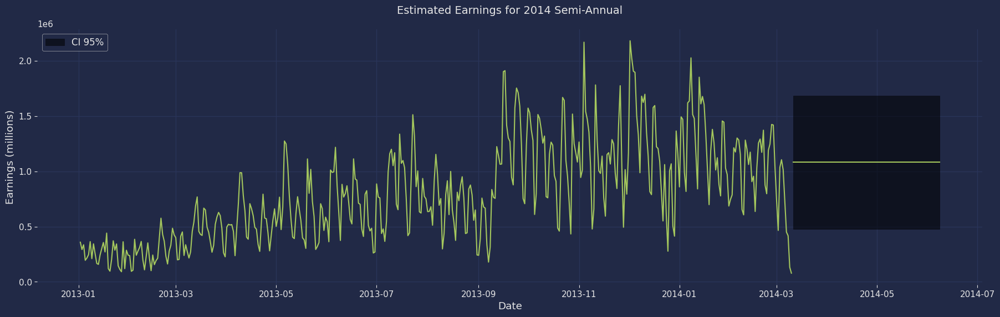

In [221]:
fig, axs = plt.subplots(1,1,figsize=(22, 6))
sns.lineplot(final_show, y='y_unscale', x='ds', color='#a4c75d')
sns.lineplot(final_show, y='Arima', x='ds', color='#a4c75d')
axs.fill_between(final_show['ds'], 
                final_show['Arima-lo-95'], 
                final_show['Arima-hi-95'],
                alpha=.55,
                color='black',
                label='CI 95%')
axs.legend(prop={'size': 12}, loc='upper left')
axs.set_title('Estimated Earnings for 2014 Semi-Annual')
axs.set_ylabel('Earnings (millions)')
axs.set_xlabel('Date')
plt.show()

In [222]:
final_show = df.merge(overcastETS, on=['unique_id', 'ds'], how='outer')
final_show

,y,unique_id,ds,y_unscale,ETS,ETS-lo-95,ETS-lo-80,ETS-lo-60,ETS-lo-50,ETS-lo-40,ETS-hi-40,ETS-hi-50,ETS-hi-60,ETS-hi-80,ETS-hi-95
0,-0.991,1,2013-01-02,359167.569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1.140,1,2013-01-03,292766.009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-1.043,1,2013-01-04,335965.187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-1.359,1,2013-01-05,195309.842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-1.312,1,2013-01-06,216108.405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518,NaN,1,2014-06-04,NaN,1.146e+06,-1.706e+06,-7.189e+05,-78775.477,164411.406,382800.812,1.909e+06,2.127e+06,2.370e+06,3.011e+06,3.998e+06
519,NaN,1,2014-06-05,NaN,1.044e+06,-1.815e+06,-8.257e+05,-183948.281,59844.465,278777.938,1.809e+06,2.028e+06,2.271e+06,2.913e+06,3.903e+06
520,NaN,1,2014-06-06,NaN,1.082e+06,-1.784e+06,-7.919e+05,-148550.719,95846.461,315322.656,1.849e+06,2.068e+06,2.313e+06,2.956e+06,3.948e+06
521,NaN,1,2014-06-07,NaN,7.042e+05,-2.169e+06,-1.174e+06,-529587.000,-284586.969,-64569.410,1.473e+06,1.693e+06,1.938e+06,2.583e+06,3.577e+06


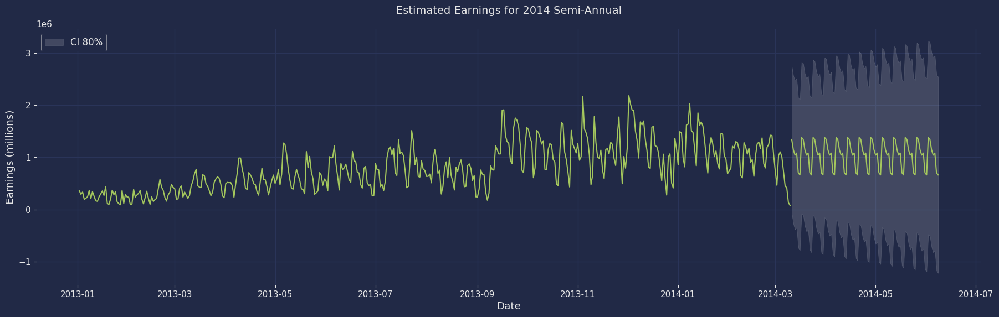

In [223]:
fig, axs = plt.subplots(1,1,figsize=(22, 6))
sns.lineplot(final_show, y='y_unscale', x='ds', color='#a4c75d')
sns.lineplot(final_show, y='ETS', x='ds', color='#a4c75d')
axs.fill_between(final_show['ds'], 
                final_show['ETS-lo-80'], 
                final_show['ETS-hi-80'],
                alpha=.15,
                color='white',
                label='CI 80%')
axs.legend(prop={'size': 12}, loc='upper left')
axs.set_title('Estimated Earnings for 2014 Semi-Annual')
axs.set_ylabel('Earnings (millions)')
axs.set_xlabel('Date')
plt.show()

In [224]:
final_show['ETS'].std()

261251.6

In [225]:
final_show['ETS-lo-80'].mean() + final_show['ETS-hi-80'].mean()

2097047.2